In [1]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import glob
import warnings
warnings.filterwarnings('ignore')

# Configure plotting style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 10

print("Libraries loaded successfully!")

Libraries loaded successfully!


In [2]:
def load_all_metrics(directory):
    """
    Load all JSON files from the epoch_metrics directory.
    Returns a pandas DataFrame with all metrics.
    """
    all_data = []
    json_files = glob.glob(str(Path(directory) / '*.json'))
    
    print(f"Found {len(json_files)} JSON files")
    
    for file_path in json_files:
        with open(file_path, 'r') as f:
            # Read all lines (each line is a JSON object)
            for line in f:
                if line.strip():  # Skip empty lines
                    data = eval(line.strip())  # Convert string representation to dict
                    all_data.append(data)
    
    df = pd.DataFrame(all_data)
    
    # Add derived metrics
    df['energy_per_sample'] = df['power_watts'] * df['epoch_time_sec'] / df['samples']  # Joules per sample
    df['throughput_efficiency'] = df['samples_per_sec'] / df['power_watts']  # samples/sec/watt
    df['mem_alloc_gb'] = df['mem_alloc_bytes'] / (1024**3)
    df['mem_reserved_gb'] = df['mem_reserved_bytes'] / (1024**3)
    df['max_mem_alloc_gb'] = df['max_mem_alloc_bytes'] / (1024**3)
    
    # Clean up GPU names for better display
    df['gpu_short_name'] = df['gpu_name'].str.replace('NVIDIA GeForce ', '').str.replace('NVIDIA ', '').str.replace('Radeon ', '')
    
    return df

# Load the data
data_dir = Path('train_exp_results/epoch_metrics')
train_df = load_all_metrics(data_dir)

print(f"\nLoaded {len(train_df)} records")
print(f"\nGPUs: {train_df['gpu_short_name'].unique()}")
print(f"Models: {train_df['model'].unique()}")
print(f"Precisions: {train_df['precision'].unique()}")
print(f"\nDataFrame shape: {train_df.shape}")
train_df.head()

Found 28 JSON files

Loaded 26381 records

GPUs: ['L40S' 'RX 7900 XT' 'RTX 4090']
Models: ['resnet50' 'bert-large' 'gpt2']
Precisions: ['fp16' 'fp32' 'bf16']

DataFrame shape: (26381, 26)


,experiment_num,gpu_vendor,gpu_name,model,precision,batch_size,epoch,loss,epoch_time_sec,samples,...,max_mem_reserved_bytes,gpu_util_percent,mem_util_percent,power_watts,energy_per_sample,throughput_efficiency,mem_alloc_gb,mem_reserved_gb,max_mem_alloc_gb,gpu_short_name
0,1,nvidia,NVIDIA L40S,resnet50,fp16,96,1,2.306783,8.289907,9600,...,5289017344,98,91,315.619,0.272547,3.669091,0.426441,4.925781,4.346987,L40S
1,1,nvidia,NVIDIA L40S,resnet50,fp16,96,2,2.294169,7.905766,9600,...,5289017344,97,91,311.423,0.256462,3.899209,0.426441,4.925781,4.346987,L40S
2,1,nvidia,NVIDIA L40S,resnet50,fp16,96,3,2.311544,7.902498,9600,...,5289017344,97,92,317.180,0.261095,3.830020,0.426441,4.925781,4.346987,L40S
3,1,nvidia,NVIDIA L40S,resnet50,fp16,96,4,2.304525,7.903141,9600,...,5289017344,97,91,315.503,0.259736,3.850065,0.426441,4.925781,4.346987,L40S
4,1,nvidia,NVIDIA L40S,resnet50,fp16,96,5,2.306559,7.904081,9600,...,5289017344,97,94,316.728,0.260775,3.834718,0.426441,4.925781,4.346987,L40S


In [3]:
import pandas as pd
import os
import json

def parse_json_stream(file_path):
    """
    Parses a file containing a stream of concatenated JSON objects.
    """
    with open(file_path, 'r') as f:
        content = f.read()
    
    decoder = json.JSONDecoder()
    objects = []
    pos = 0
    # Skip leading whitespace
    while pos < len(content) and content[pos].isspace():
        pos += 1
    
    while pos < len(content):
        try:
            obj, pos = decoder.raw_decode(content, pos)
            objects.append(obj)
            # Skip whitespace between objects
            while pos < len(content) and content[pos].isspace():
                pos += 1
        except json.JSONDecodeError:
            # Handle cases where decoding might fail, e.g., trailing characters
            break
            
    return objects

# Directory containing the JSON files
data_dir = 'infer_metrics/infer_metrics'
all_metrics = []

# Check if the directory exists
if os.path.isdir(data_dir):
    # Iterate over each file in the directory
    for filename in os.listdir(data_dir):
        if filename.endswith('.json'):
            file_path = os.path.join(data_dir, filename)
            # Parse the stream of JSON objects from the file
            metrics_from_file = parse_json_stream(file_path)
            all_metrics.extend(metrics_from_file)

# Create a pandas DataFrame from the list of dictionaries
if all_metrics:
    df_infer = pd.DataFrame(all_metrics)
    # Sort by experiment number for consistent ordering
    if 'experiment_num' in df_infer.columns:
        df_infer = df_infer.sort_values(by='experiment_num').reset_index(drop=True)
    # print(df_infer.head())
else:
    print(f"No JSON files found or parsed in the '{data_dir}' directory.")
    # Create an empty dataframe to avoid errors in subsequent cells
    df_infer = pd.DataFrame()

df_infer.dropna(subset=['gpu_avg_power_watts'], inplace=True)
df_infer.dropna(subset=['throughput_samples_per_sec'], inplace=True)
df_infer['gpu_short_name'] = df_infer['device'].map(lambda x: x.replace('4090', 'RTX 4090').replace('7900', 'RX 7900 XT'))

print(f"\nLoaded {len(df_infer)} records")
print(f"\nGPUs: {df_infer['gpu_short_name'].unique()}")
print(f"Models: {df_infer['model'].unique()}")
print(f"Precisions: {df_infer['precision'].unique()}")
print(f"\nDataFrame shape: {df_infer.shape}")

df_infer.head()


Loaded 2703 records

GPUs: ['RTX 4090' 'L40S' 'RX 7900 XT']
Models: ['resnet50' 'bert-large' 'gpt2']
Precisions: ['fp16' 'bf16' 'fp32']

DataFrame shape: (2703, 23)


,model,precision,pretrained,device,batch_size,num_batches,warmup_batches,total_samples,total_inference_time_sec,throughput_samples_per_sec,...,p95_latency_ms,p99_latency_ms,peak_memory_mb,experiment_num,gpu_peak_memory_logger_mb,gpu_avg_util_percent,gpu_avg_power_watts,avg_utilization_percent,avg_power_watts,gpu_short_name
2,resnet50,fp16,True,4090,64,100,5,6400,1.313303,4873.208139,...,13.601565,13.613913,516.368164,1,1645.187500,54.75,141.457500,NaN,NaN,RTX 4090
3,bert-large,bf16,True,L40S,96,100,5,9600,6.459202,1486.251641,...,64.939141,65.103581,2224.036133,1,3293.750000,93.50,293.606286,NaN,NaN,L40S
5,gpt2,fp16,True,L40S,24,100,5,2400,1.332924,1800.552597,...,13.687634,14.376645,1556.523438,1,2673.750000,66.25,185.395750,NaN,NaN,L40S
6,resnet50,fp32,True,7900,12,100,5,1200,0.773336,1551.718442,...,7.850289,7.877157,224.102051,1,525.320312,42.50,110.357143,NaN,NaN,RX 7900 XT
7,resnet50,bf16,True,4090,64,100,5,6400,1.346325,4753.680756,...,13.894522,13.906865,516.149414,1,1717.187500,50.75,118.797500,NaN,NaN,RTX 4090


# Advanced Analysis: Speedup Factor, Training Stability, Latency, Energy Efficiency, and Memory

This section implements comprehensive analyses to evaluate mixed precision performance beyond raw throughput:
1. **Speedup Factor Analysis**: Quantify mixed precision impact vs FP32 baseline
2. **Training Stability**: Verify convergence and loss scaling effectiveness
3. **Inference Latency Distribution**: Analyze consistency (P99 vs average)
4. **Energy Efficiency**: Samples/Watt analysis (Green AI metrics)
5. **Memory Footprint**: VRAM usage comparison across precisions

## 1. Speedup Factor Analysis (Relative Scaling)

Calculate speedup factor: S = Throughput_Mixed / Throughput_FP32

This isolates architectural efficiency from raw clock speed and tests whether AMD's RDNA3 WMMA achieves similar scaling factors to NVIDIA Tensor Cores (expected 2x-4x speedup).

In [4]:
def calculate_speedup_factors(df, metric='samples_per_sec', group_cols=['gpu_short_name', 'model']):
    """
    Calculate speedup factor relative to FP32 baseline.
    S = Throughput_Mixed / Throughput_FP32
    """
    speedup_data = []
    
    for gpu in df['gpu_short_name'].unique():
        for model in df['model'].unique():
            # Get FP32 baseline
            fp32_data = df[(df['gpu_short_name'] == gpu) & 
                          (df['model'] == model) & 
                          (df['precision'] == 'fp32')]
            
            if len(fp32_data) == 0:
                continue
                
            fp32_baseline = fp32_data[metric].mean()
            
            # Calculate speedup for each precision
            for precision in df['precision'].unique():
                if precision == 'fp32':
                    speedup = 1.0  # Baseline
                else:
                    precision_data = df[(df['gpu_short_name'] == gpu) & 
                                       (df['model'] == model) & 
                                       (df['precision'] == precision)]
                    
                    if len(precision_data) == 0:
                        continue
                        
                    mixed_throughput = precision_data[metric].mean()
                    speedup = mixed_throughput / fp32_baseline if fp32_baseline > 0 else 0
                
                speedup_data.append({
                    'gpu_short_name': gpu,
                    'model': model,
                    'precision': precision,
                    'speedup_factor': speedup,
                    'baseline_value': fp32_baseline,
                    'actual_value': fp32_baseline if precision == 'fp32' else precision_data[metric].mean()
                })
    
    return pd.DataFrame(speedup_data)

# Calculate speedup factors for training
print("=== TRAINING SPEEDUP FACTORS ===")
train_speedup = calculate_speedup_factors(train_df, metric='samples_per_sec')
print(f"\nCalculated speedup factors for {len(train_speedup)} configurations")
print("\nSummary Statistics:")
print(train_speedup.groupby(['precision'])['speedup_factor'].describe()[['mean', 'std', 'min', 'max']])

# Calculate speedup factors for inference
print("\n=== INFERENCE SPEEDUP FACTORS ===")
if not df_infer.empty and 'throughput_samples_per_sec' in df_infer.columns:
    infer_speedup = calculate_speedup_factors(df_infer, metric='throughput_samples_per_sec')
    print(f"\nCalculated speedup factors for {len(infer_speedup)} configurations")
    print("\nSummary Statistics:")
    print(infer_speedup.groupby(['precision'])['speedup_factor'].describe()[['mean', 'std', 'min', 'max']])
else:
    infer_speedup = pd.DataFrame()
    print("No inference data available")

train_speedup.head(10)

=== TRAINING SPEEDUP FACTORS ===

Calculated speedup factors for 27 configurations

Summary Statistics:
               mean       std       min       max
precision                                        
bf16       2.279706  1.689233  1.184943  6.229147
fp16       2.403380  1.781944  1.140280  6.654889
fp32       1.000000  0.000000  1.000000  1.000000

=== INFERENCE SPEEDUP FACTORS ===

Calculated speedup factors for 27 configurations

Summary Statistics:
               mean       std       min        max
precision                                         
bf16       3.388986  4.138267  0.998313  13.188805
fp16       3.493987  4.044420  1.186144  13.086663
fp32       1.000000  0.000000  1.000000   1.000000


,gpu_short_name,model,precision,speedup_factor,baseline_value,actual_value
0,L40S,resnet50,fp16,1.768859,685.910211,1213.278123
1,L40S,resnet50,fp32,1.000000,685.910211,685.910211
2,L40S,resnet50,bf16,1.732969,685.910211,1188.660911
3,L40S,bert-large,fp16,1.529443,237.240600,362.845947
4,L40S,bert-large,fp32,1.000000,237.240600,237.240600
5,L40S,bert-large,bf16,1.553743,237.240600,368.610867
6,L40S,gpt2,fp16,1.140280,317.798631,362.379322
7,L40S,gpt2,fp32,1.000000,317.798631,317.798631
8,L40S,gpt2,bf16,1.184943,317.798631,376.573215
9,RX 7900 XT,resnet50,fp16,2.079588,288.937302,600.870682


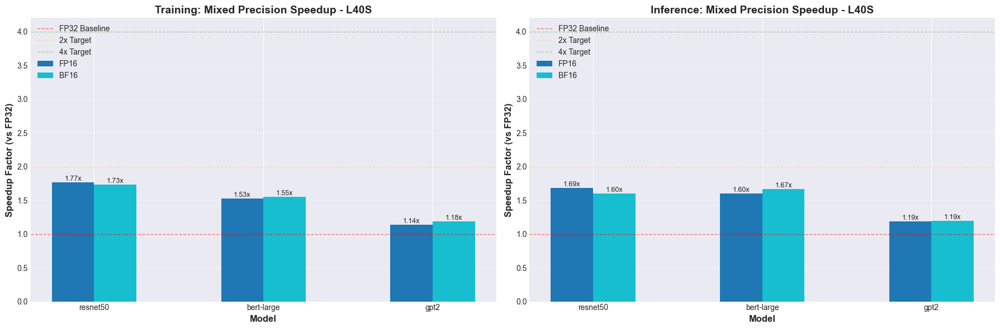


=== KEY INSIGHTS - L40S ===
Target Speedup Range: 2x-4x (NVIDIA Tensor Cores benchmark)
Training - Average FP16 Speedup: 1.48x
Training - Average BF16 Speedup: 1.49x
Inference - Average FP16 Speedup: 1.49x
Inference - Average BF16 Speedup: 1.49x


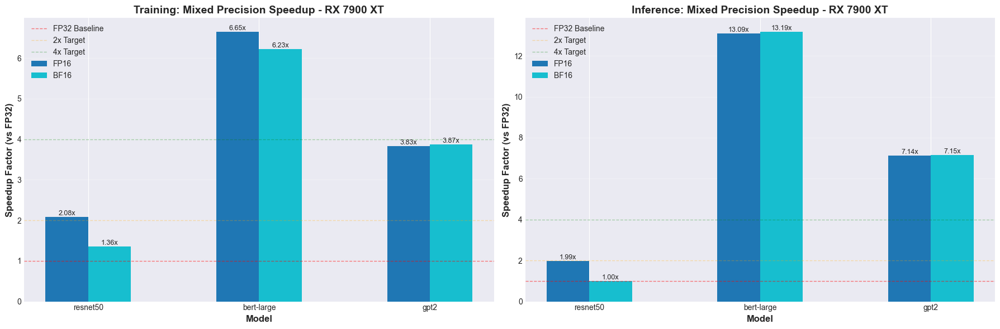


=== KEY INSIGHTS - RX 7900 XT ===
Target Speedup Range: 2x-4x (NVIDIA Tensor Cores benchmark)
Training - Average FP16 Speedup: 4.19x
Training - Average BF16 Speedup: 3.82x
Inference - Average FP16 Speedup: 7.40x
Inference - Average BF16 Speedup: 7.11x


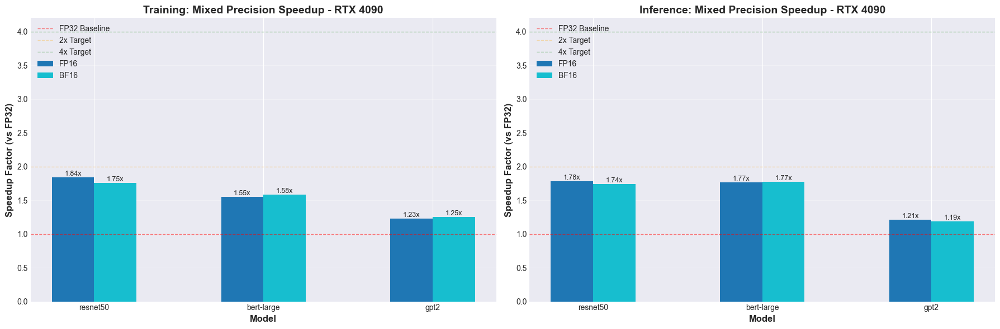


=== KEY INSIGHTS - RTX 4090 ===
Target Speedup Range: 2x-4x (NVIDIA Tensor Cores benchmark)
Training - Average FP16 Speedup: 1.54x
Training - Average BF16 Speedup: 1.53x
Inference - Average FP16 Speedup: 1.59x
Inference - Average BF16 Speedup: 1.57x


In [5]:
# Visualization: Grouped Bar Chart for Speedup Factors (Training) - Per GPU
gpus = train_speedup['gpu_short_name'].unique()

for gpu in gpus:
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))
    
    # Filter data for current GPU
    train_gpu = train_speedup[train_speedup['gpu_short_name'] == gpu]
    infer_gpu = infer_speedup[infer_speedup['gpu_short_name'] == gpu]
    
    # Training Speedup
    ax = axes[0]
    models = train_gpu['model'].unique()
    x = np.arange(len(models))
    width = 0.25
    
    # Get unique Precision combinations for this GPU
    precisions = train_gpu['precision'].unique()
    precisions = [p for p in precisions if p != 'fp32']  # Exclude FP32 (baseline)
    
    colors = plt.cm.tab10(np.linspace(0, 1, len(precisions)))
    
    for idx, precision in enumerate(precisions):
        speedups = []
        for model in models:
            data = train_gpu[(train_gpu['model'] == model) & 
                            (train_gpu['precision'] == precision)]
            speedups.append(data['speedup_factor'].values[0] if len(data) > 0 else 0)
        
        offset = width * (idx - len(precisions)/2 + 0.5)
        bars = ax.bar(x + offset, speedups, width, label=f'{precision.upper()}', color=colors[idx])
        
        # Add value labels on bars
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.2f}x',
                       ha='center', va='bottom', fontsize=9, rotation=0)
    
    ax.axhline(y=1.0, color='red', linestyle='--', linewidth=1, alpha=0.5, label='FP32 Baseline')
    ax.axhline(y=2.0, color='orange', linestyle='--', linewidth=1, alpha=0.3, label='2x Target')
    ax.axhline(y=4.0, color='green', linestyle='--', linewidth=1, alpha=0.3, label='4x Target')
    
    ax.set_xlabel('Model', fontsize=12, fontweight='bold')
    ax.set_ylabel('Speedup Factor (vs FP32)', fontsize=12, fontweight='bold')
    ax.set_title(f'Training: Mixed Precision Speedup - {gpu}', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(models, rotation=0)
    ax.legend(loc='upper left', fontsize=10)
    ax.grid(axis='y', alpha=0.3)
    ax.set_ylim(bottom=0)
    
    # Inference Speedup
    ax = axes[1]
    if not infer_gpu.empty:
        models_infer = infer_gpu['model'].unique()
        x = np.arange(len(models_infer))
        
        precisions_infer = infer_gpu['precision'].unique()
        precisions_infer = [p for p in precisions_infer if p != 'fp32']
        
        colors_infer = plt.cm.tab10(np.linspace(0, 1, len(precisions_infer)))
        
        for idx, precision in enumerate(precisions_infer):
            speedups = []
            for model in models_infer:
                data = infer_gpu[(infer_gpu['model'] == model) & 
                                (infer_gpu['precision'] == precision)]
                speedups.append(data['speedup_factor'].values[0] if len(data) > 0 else 0)
            
            offset = width * (idx - len(precisions_infer)/2 + 0.5)
            bars = ax.bar(x + offset, speedups, width, label=f'{precision.upper()}', color=colors_infer[idx])
            
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{height:.2f}x',
                           ha='center', va='bottom', fontsize=9, rotation=0)
        
        ax.axhline(y=1.0, color='red', linestyle='--', linewidth=1, alpha=0.5, label='FP32 Baseline')
        ax.axhline(y=2.0, color='orange', linestyle='--', linewidth=1, alpha=0.3, label='2x Target')
        ax.axhline(y=4.0, color='green', linestyle='--', linewidth=1, alpha=0.3, label='4x Target')
        
        ax.set_xlabel('Model', fontsize=12, fontweight='bold')
        ax.set_ylabel('Speedup Factor (vs FP32)', fontsize=12, fontweight='bold')
        ax.set_title(f'Inference: Mixed Precision Speedup - {gpu}', fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(models_infer, rotation=0)
        ax.legend(loc='upper left', fontsize=10)
        ax.grid(axis='y', alpha=0.3)
        ax.set_ylim(bottom=0)
    else:
        ax.text(0.5, 0.5, 'No Inference Data Available', 
                ha='center', va='center', transform=ax.transAxes, fontsize=14)
        ax.axis('off')
    
    plt.tight_layout()
    plt.savefig(f'imgs/speedup_factor_analysis_{gpu}.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\n=== KEY INSIGHTS - {gpu} ===")
    print(f"Target Speedup Range: 2x-4x (NVIDIA Tensor Cores benchmark)")
    if not train_gpu.empty:
        fp16_data = train_gpu[train_gpu['precision'] == 'fp16']
        bf16_data = train_gpu[train_gpu['precision'] == 'bf16']
        if not fp16_data.empty:
            print(f"Training - Average FP16 Speedup: {fp16_data['speedup_factor'].mean():.2f}x")
        if not bf16_data.empty:
            print(f"Training - Average BF16 Speedup: {bf16_data['speedup_factor'].mean():.2f}x")
    if not infer_gpu.empty:
        fp16_data_infer = infer_gpu[infer_gpu['precision'] == 'fp16']
        bf16_data_infer = infer_gpu[infer_gpu['precision'] == 'bf16']
        if not fp16_data_infer.empty:
            print(f"Inference - Average FP16 Speedup: {fp16_data_infer['speedup_factor'].mean():.2f}x")
        if not bf16_data_infer.empty:
            print(f"Inference - Average BF16 Speedup: {bf16_data_infer['speedup_factor'].mean():.2f}x")

## 2. Training Stability and Convergence Verification

Analyze training loss curves to verify dynamic loss scaling effectiveness. Tests whether BF16's wider dynamic range requires less aggressive scaling than FP16, and whether AMD cards show more instability due to software maturity.

In [6]:
# Check if loss data is available in training dataframe
print("=== TRAINING STABILITY ANALYSIS ===")
print(f"Available columns in train_df: {train_df.columns.tolist()}")

# Check for loss-related columns
loss_columns = [col for col in train_df.columns if 'loss' in col.lower()]
print(f"\nLoss-related columns found: {loss_columns}")

if loss_columns:
    # Use the first loss column found
    loss_col = loss_columns[0]
    
    # Analyze loss statistics by precision
    print(f"\n=== Loss Statistics by Precision (using '{loss_col}') ===")
    loss_stats = train_df.groupby(['precision', 'gpu_short_name', 'model'])[loss_col].agg(['mean', 'std', 'min', 'max', 'count'])
    print(loss_stats)
    
    # Calculate coefficient of variation (stability metric)
    loss_cv = train_df.groupby(['precision', 'gpu_short_name', 'model'])[loss_col].apply(
        lambda x: (x.std() / x.mean() * 100) if x.mean() != 0 else 0
    ).reset_index()
    loss_cv.columns = ['precision', 'gpu_short_name', 'model', 'cv_percent']
    
    print(f"\n=== Coefficient of Variation (Lower = More Stable) ===")
    print(loss_cv.sort_values('cv_percent'))
    
else:
    print("\nWARNING: No loss data found in training metrics.")
    print("This analysis requires epoch-level loss values to assess training stability.")
    print("Consider logging loss values during training for comprehensive stability analysis.")
    loss_col = None

=== TRAINING STABILITY ANALYSIS ===
Available columns in train_df: ['experiment_num', 'gpu_vendor', 'gpu_name', 'model', 'precision', 'batch_size', 'epoch', 'loss', 'epoch_time_sec', 'samples', 'samples_per_sec', 'nan_inf_count_so_far', 'skipped_steps_so_far', 'mem_alloc_bytes', 'mem_reserved_bytes', 'max_mem_alloc_bytes', 'max_mem_reserved_bytes', 'gpu_util_percent', 'mem_util_percent', 'power_watts', 'energy_per_sample', 'throughput_efficiency', 'mem_alloc_gb', 'mem_reserved_gb', 'max_mem_alloc_gb', 'gpu_short_name']

Loss-related columns found: ['loss']

=== Loss Statistics by Precision (using 'loss') ===
                                          mean       std        min  \
precision gpu_short_name model                                        
bf16      L40S           bert-large   0.700419  0.013208   0.676982   
                         gpt2        10.836708  0.010663  10.828339   
                         resnet50     2.307517  0.014814   2.271240   
          RTX 4090       bert

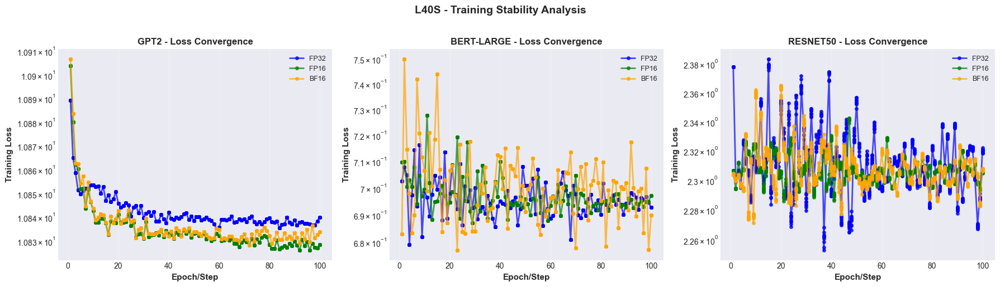

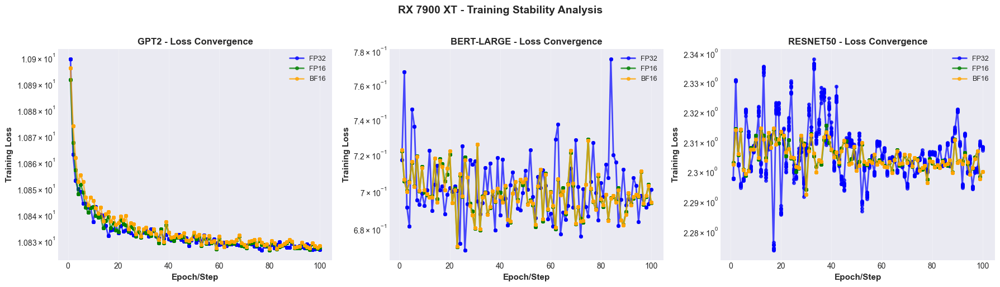

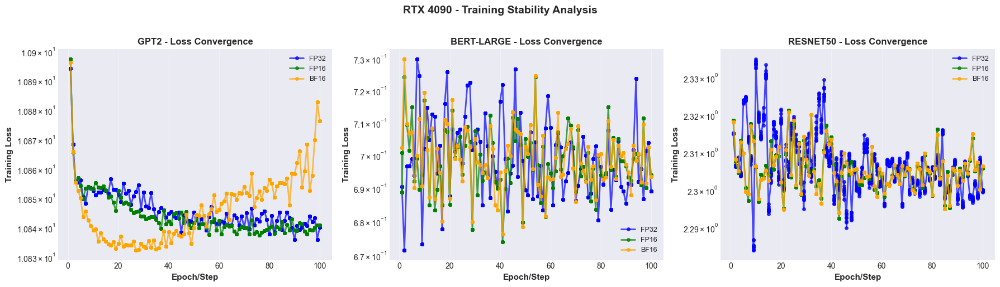


=== STABILITY INSIGHTS ===
• Smooth curves indicate stable training
• Spikes or divergence suggest numerical instability
• BF16 expected to show smoother curves than FP16 due to wider dynamic range
• Compare convergence rates across GPUs to assess software maturity (ROCm vs CUDA)


In [7]:
# Visualization: Training Loss Curves (if loss data available) - Per GPU
if loss_col:
    # Select a representative model for detailed analysis
    target_models = ['gpt2', 'bert-large', 'resnet50']
    available_models = [m for m in target_models if m in train_df['model'].unique()]
    
    if available_models:
        # Get unique GPUs
        gpus = train_df['gpu_short_name'].unique()
        
        for gpu in gpus:
            gpu_data = train_df[train_df['gpu_short_name'] == gpu]
            
            # Check which models are available for this GPU
            gpu_available_models = [m for m in available_models if m in gpu_data['model'].unique()]
            
            if not gpu_available_models:
                continue
            
            fig, axes = plt.subplots(1, len(gpu_available_models), figsize=(6*len(gpu_available_models), 5))
            if len(gpu_available_models) == 1:
                axes = [axes]
            
            for idx, model in enumerate(gpu_available_models):
                ax = axes[idx]
                
                model_data = gpu_data[gpu_data['model'] == model].copy()
                
                # Check if epoch information is available
                if 'epoch' in model_data.columns:
                    epoch_col = 'epoch'
                else:
                    # Create a synthetic epoch counter
                    model_data['synthetic_epoch'] = model_data.groupby(['precision', 'batch_size']).cumcount()
                    epoch_col = 'synthetic_epoch'
                
                # Plot loss curves for each precision
                colors_precision = {'fp32': 'blue', 'fp16': 'green', 'bf16': 'orange'}
                
                for precision in ['fp32', 'fp16', 'bf16']:
                    precision_data = model_data[model_data['precision'] == precision].sort_values(epoch_col)
                    
                    if len(precision_data) > 1:
                        ax.plot(precision_data[epoch_col], precision_data[loss_col], 
                               marker='o', label=f'{precision.upper()}', 
                               color=colors_precision.get(precision, 'gray'),
                               linewidth=2, markersize=4, alpha=0.7)
                
                ax.set_xlabel('Epoch/Step', fontsize=11, fontweight='bold')
                ax.set_ylabel('Training Loss', fontsize=11, fontweight='bold')
                ax.set_title(f'{model.upper()} - Loss Convergence', fontsize=12, fontweight='bold')
                ax.legend(fontsize=9, loc='best')
                ax.grid(True, alpha=0.3)
                ax.set_yscale('log')  # Log scale for better visualization
            
            plt.suptitle(f'{gpu} - Training Stability Analysis', fontsize=14, fontweight='bold', y=1.02)
            plt.tight_layout()
            plt.savefig(f'imgs/training_stability_loss_curves_{gpu}.png', dpi=300, bbox_inches='tight')
            plt.show()
        
        print("\n=== STABILITY INSIGHTS ===")
        print("• Smooth curves indicate stable training")
        print("• Spikes or divergence suggest numerical instability")
        print("• BF16 expected to show smoother curves than FP16 due to wider dynamic range")
        print("• Compare convergence rates across GPUs to assess software maturity (ROCm vs CUDA)")
    else:
        print(f"No target models found in data. Available: {train_df['model'].unique()}")
else:
    print("Skipping loss curve visualization - no loss data available")
    print("\nTo enable this analysis, ensure your training script logs loss values per epoch.")

## 3. Inference Latency Distribution (P99 vs Average)

Analyze latency consistency using box plots. High throughput is less valuable if latency jitters (important for real-time AI). Tests whether chiplet design or lack of ECC memory introduces tail latency.

In [8]:
# Calculate latency statistics from inference data
if not df_infer.empty:
    print("=== INFERENCE LATENCY ANALYSIS ===")
    
    # Check for latency columns
    latency_cols = [col for col in df_infer.columns if 'latency' in col.lower() or 'time' in col.lower()]
    print(f"Latency-related columns: {latency_cols}")
    
    # Calculate latency from throughput if direct latency not available
    if 'avg_latency_ms' in df_infer.columns:
        latency_col = 'avg_latency_ms'
    elif 'throughput_samples_per_sec' in df_infer.columns and 'batch_size' in df_infer.columns:
        # Latency per batch = 1 / (throughput / batch_size) * 1000 (to get ms)
        df_infer['calculated_latency_ms'] = (df_infer['batch_size'] / df_infer['throughput_samples_per_sec']) * 1000
        latency_col = 'calculated_latency_ms'
        print(f"\nCalculated latency from throughput")
    else:
        latency_col = None
        print("\nWARNING: Cannot calculate latency - missing required columns")
    
    if latency_col:
        # Calculate percentiles
        latency_stats = df_infer.groupby(['gpu_short_name', 'model', 'precision'])[latency_col].agg([
            ('mean', 'mean'),
            ('median', 'median'),
            ('std', 'std'),
            ('min', 'min'),
            ('max', 'max'),
            ('p95', lambda x: np.percentile(x, 95)),
            ('p99', lambda x: np.percentile(x, 99)),
            ('count', 'count')
        ]).reset_index()
        
        # Calculate jitter metric (ratio of P99 to median)
        latency_stats['jitter_ratio'] = latency_stats['p99'] / latency_stats['median']
        
        print(f"\n=== Latency Statistics (in ms) ===")
        print(latency_stats.to_string())
        
        print(f"\n=== Jitter Analysis (P99/Median - Lower is Better) ===")
        print(latency_stats[['gpu_short_name', 'model', 'precision', 'jitter_ratio']].sort_values('jitter_ratio'))
        
else:
    print("No inference data available for latency analysis")
    latency_col = None

=== INFERENCE LATENCY ANALYSIS ===
Latency-related columns: ['total_inference_time_sec', 'mean_batch_latency_ms', 'p50_latency_ms', 'p90_latency_ms', 'p95_latency_ms', 'p99_latency_ms']

Calculated latency from throughput

=== Latency Statistics (in ms) ===
   gpu_short_name       model precision         mean       median       std          min          max          p95          p99  count  jitter_ratio
0            L40S  bert-large      bf16    65.758809    65.740509  0.186405    64.592023    66.421239    65.951463    65.998091    100      1.003918
1            L40S  bert-large      fp16    68.528657    68.505822  0.190189    68.293135    69.340963    68.944710    69.293136    100      1.011493
2            L40S  bert-large      fp32    36.594538    36.565436  0.115424    36.447675    37.201827    36.781787    37.068557    100      1.013759
3            L40S        gpt2      bf16    14.178672    14.026225  0.827701    13.033116    16.860740    15.751604    16.621163    100      1.1850

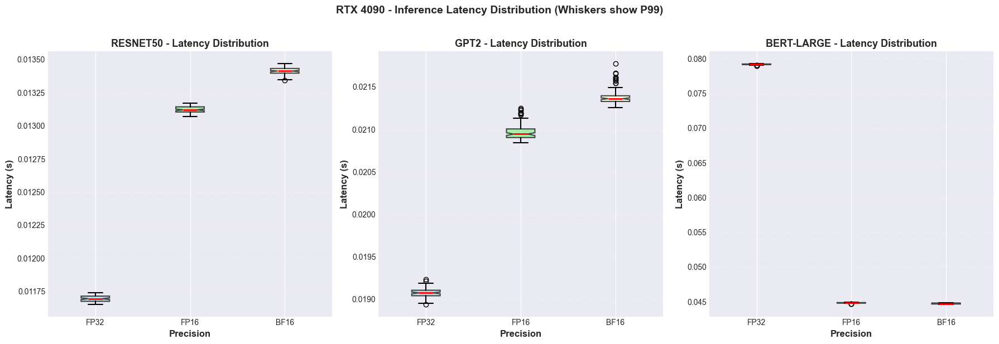

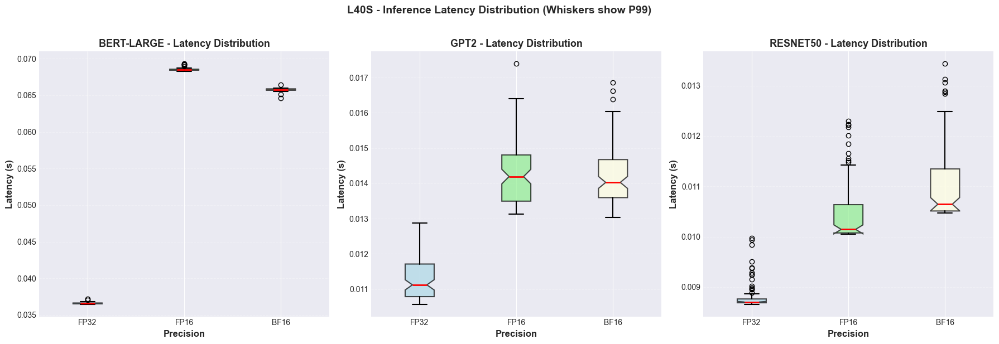

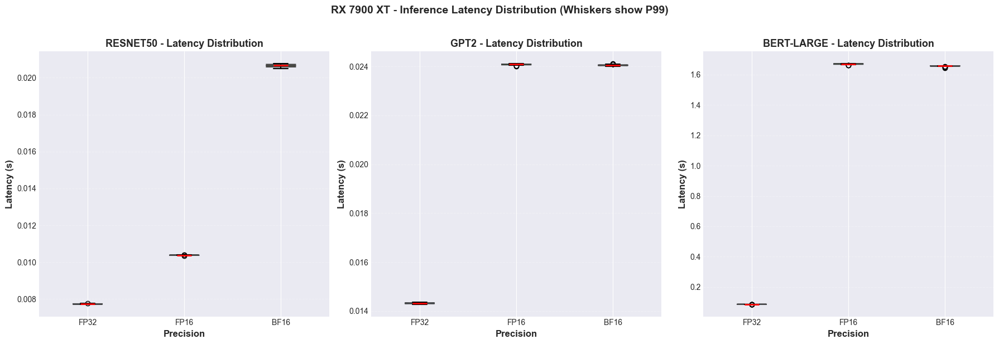


=== LATENCY INSIGHTS ===
• Median (red line): Typical latency
• Box height: Inter-quartile range (middle 50% of data)
• Whiskers: Show spread to ~P99
• Outliers (dots): Individual extreme values
• Narrow boxes with short whiskers = Consistent performance (good for real-time AI)

=== Top 5 Low-Latency Configurations (Median * (1 + CV)) ===
   gpu_short_name     model precision     median       std  consistency_score
26     RX 7900 XT  resnet50      fp32   7.731552  0.011218           7.742770
8            L40S  resnet50      fp32   8.703030  0.259512           8.962542
23     RX 7900 XT  resnet50      fp16  10.373989  0.009530          10.383519
5            L40S  resnet50      fp16  10.146281  0.592306          10.738587
2            L40S  resnet50      bf16  10.646074  0.742053          11.388127


In [9]:
# Visualization: Box Plots for Latency Distribution - Per GPU
if not df_infer.empty and latency_col:
    # Get unique GPUs
    gpus = df_infer['gpu_short_name'].unique()
    
    for gpu in gpus:
        # Filter data for current GPU
        gpu_data = df_infer[df_infer['gpu_short_name'] == gpu]
        
        # Get models available for this GPU
        models_to_plot = gpu_data['model'].unique()
        
        if len(models_to_plot) == 0:
            continue
        
        fig, axes = plt.subplots(1, len(models_to_plot), figsize=(6*len(models_to_plot), 6))
        if len(models_to_plot) == 1:
            axes = [axes]
        
        for idx, model in enumerate(models_to_plot):
            ax = axes[idx]
            
            model_data = gpu_data[gpu_data['model'] == model]
            
            # Prepare data for box plot
            box_data = []
            labels = []
            colors_list = []
            color_map = {'fp32': 'lightblue', 'fp16': 'lightgreen', 'bf16': 'lightyellow'}
            
            for precision in ['fp32', 'fp16', 'bf16']:
                data = model_data[model_data['precision'] == precision][latency_col]
                
                if len(data) > 0:
                    # Convert from ms to seconds
                    box_data.append((data.values / 1000))
                    labels.append(f'{precision.upper()}')
                    colors_list.append(color_map.get(precision, 'lightgray'))
            
            if box_data:
                bp = ax.boxplot(box_data, labels=labels, patch_artist=True,
                               showfliers=True, notch=True,
                               boxprops=dict(linewidth=1.5),
                               medianprops=dict(color='red', linewidth=2),
                               whiskerprops=dict(linewidth=1.5),
                               capprops=dict(linewidth=1.5))
                
                # Color boxes
                for patch, color in zip(bp['boxes'], colors_list):
                    patch.set_facecolor(color)
                    patch.set_alpha(0.7)
                
                ax.set_ylabel('Latency (s)', fontsize=12, fontweight='bold')
                ax.set_xlabel('Precision', fontsize=12, fontweight='bold')
                ax.set_title(f'{model.upper()} - Latency Distribution', 
                            fontsize=13, fontweight='bold')
                ax.grid(axis='y', alpha=0.3, linestyle='--')
                ax.tick_params(axis='x', labelsize=10)
        
        plt.suptitle(f'{gpu} - Inference Latency Distribution (Whiskers show P99)', 
                     fontsize=14, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.savefig(f'imgs/latency_distribution_boxplot_{gpu}.png', dpi=300, bbox_inches='tight')
        plt.show()
    
    print("\n=== LATENCY INSIGHTS ===")
    print("• Median (red line): Typical latency")
    print("• Box height: Inter-quartile range (middle 50% of data)")
    print("• Whiskers: Show spread to ~P99")
    print("• Outliers (dots): Individual extreme values")
    print("• Narrow boxes with short whiskers = Consistent performance (good for real-time AI)")
    
    # Identify best configurations for low-latency
    if latency_col in df_infer.columns:
        best_latency = df_infer.groupby(['gpu_short_name', 'precision', 'model'])[latency_col].agg(['median', 'std']).reset_index()
        best_latency['consistency_score'] = best_latency['median'] * (1 + best_latency['std'] / best_latency['median'])
        print(f"\n=== Top 5 Low-Latency Configurations (Median * (1 + CV)) ===")
        print(best_latency.nsmallest(5, 'consistency_score')[['gpu_short_name', 'model', 'precision', 'median', 'std', 'consistency_score']])

else:
    print("Skipping latency distribution visualization - insufficient data")

## 4. Energy Efficiency Analysis (Green AI Metric)

Calculate energy efficiency: E = Samples/Watt. Distinguishes data center efficiency (L40S) from brute force performance (RTX 4090). Tests whether mixed precision improves energy efficiency or if higher utilization cancels gains.

In [10]:
# Calculate energy efficiency metrics
print("=== ENERGY EFFICIENCY ANALYSIS ===")

# Training Energy Efficiency
if 'throughput_efficiency' in train_df.columns:
    train_efficiency = train_df.copy()
    print("\nTraining data already has throughput_efficiency (samples/sec/watt)")
else:
    train_efficiency = train_df.copy()
    train_efficiency['throughput_efficiency'] = train_efficiency['samples_per_sec'] / train_efficiency['power_watts']

train_energy_stats = train_efficiency.groupby(['gpu_short_name', 'model', 'precision']).agg({
    'throughput_efficiency': ['mean', 'std'],
    'samples_per_sec': 'mean',
    'power_watts': 'mean'
}).reset_index()

train_energy_stats.columns = ['_'.join(col).strip('_') for col in train_energy_stats.columns.values]
train_energy_stats.columns = ['gpu_short_name', 'model', 'precision', 
                               'efficiency_mean', 'efficiency_std',
                               'throughput_mean', 'power_mean']

print("\n=== Training Energy Efficiency (Samples/sec/Watt) ===")
print(train_energy_stats.sort_values('efficiency_mean', ascending=False).head(10))

# Inference Energy Efficiency
if not df_infer.empty:
    if 'gpu_avg_power_watts' in df_infer.columns and 'throughput_samples_per_sec' in df_infer.columns:
        df_infer['throughput_efficiency'] = df_infer['throughput_samples_per_sec'] / df_infer['gpu_avg_power_watts']
        
        infer_energy_stats = df_infer.groupby(['gpu_short_name', 'model', 'precision']).agg({
            'throughput_efficiency': ['mean', 'std'],
            'throughput_samples_per_sec': 'mean',
            'gpu_avg_power_watts': 'mean'
        }).reset_index()
        
        infer_energy_stats.columns = ['_'.join(col).strip('_') for col in infer_energy_stats.columns.values]
        infer_energy_stats.columns = ['gpu_short_name', 'model', 'precision',
                                       'efficiency_mean', 'efficiency_std',
                                       'throughput_mean', 'power_mean']
        
        print("\n=== Inference Energy Efficiency (Samples/sec/Watt) ===")
        print(infer_energy_stats.sort_values('efficiency_mean', ascending=False).head(10))
    else:
        infer_energy_stats = pd.DataFrame()
        print("\nInference power data not available")
else:
    infer_energy_stats = pd.DataFrame()

# Calculate efficiency improvement with mixed precision
print("\n=== Mixed Precision Energy Efficiency Gains ===")
for gpu in train_energy_stats['gpu_short_name'].unique():
    print(f"\n{gpu}:")
    for model in train_energy_stats['model'].unique():
        fp32_eff = train_energy_stats[(train_energy_stats['gpu_short_name'] == gpu) & 
                                      (train_energy_stats['model'] == model) & 
                                      (train_energy_stats['precision'] == 'fp32')]['efficiency_mean']
        
        if len(fp32_eff) == 0:
            continue
        
        fp32_eff = fp32_eff.values[0]
        
        for precision in ['fp16', 'bf16']:
            mixed_eff = train_energy_stats[(train_energy_stats['gpu_short_name'] == gpu) & 
                                          (train_energy_stats['model'] == model) & 
                                          (train_energy_stats['precision'] == precision)]['efficiency_mean']
            
            if len(mixed_eff) > 0:
                mixed_eff = mixed_eff.values[0]
                improvement = ((mixed_eff - fp32_eff) / fp32_eff) * 100
                print(f"  {model} - {precision.upper()}: {improvement:+.1f}% efficiency gain")

=== ENERGY EFFICIENCY ANALYSIS ===

Training data already has throughput_efficiency (samples/sec/watt)

=== Training Energy Efficiency (Samples/sec/Watt) ===
   gpu_short_name     model precision  efficiency_mean  efficiency_std  \
16       RTX 4090  resnet50      fp16         3.982658        0.104131   
7            L40S  resnet50      fp16         3.855306        0.031522   
6            L40S  resnet50      bf16         3.721738        0.063970   
15       RTX 4090  resnet50      bf16         3.523884        0.023777   
25     RX 7900 XT  resnet50      fp16         2.317772        0.266036   
8            L40S  resnet50      fp32         2.182223        0.055932   
17       RTX 4090  resnet50      fp32         2.033203        0.010855   
24     RX 7900 XT  resnet50      bf16         1.550661        0.271341   
3            L40S      gpt2      bf16         1.197524        0.012850   
12       RTX 4090      gpt2      bf16         1.190252        0.008064   

    throughput_mean  power_

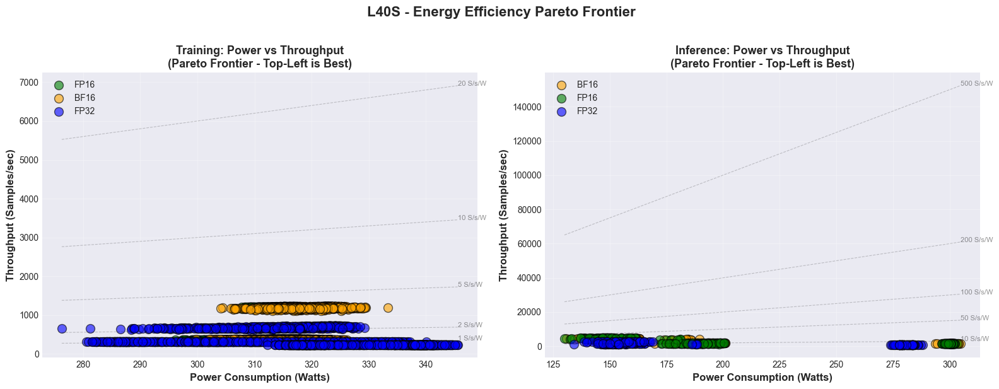

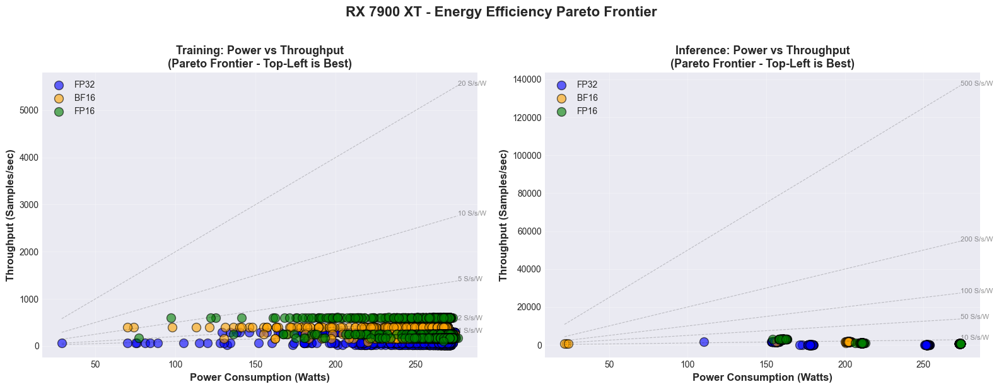

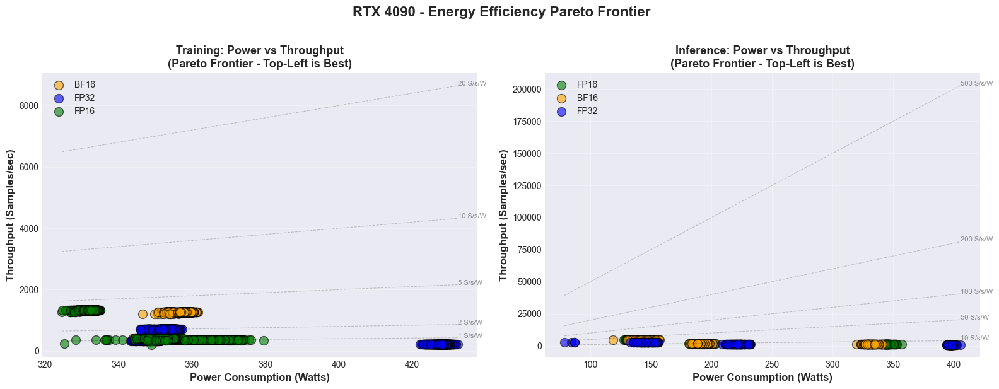


=== ENERGY EFFICIENCY INSIGHTS ===
• Points in top-left corner: Best (high throughput, low power)
• Diagonal lines: Equal efficiency contours
• Mixed precision should shift points upward (more throughput) with minimal right shift (power increase)

• L40S (Data Center): Expected to show better efficiency than RTX 4090
• RTX 4090 (Consumer): May have highest raw throughput but at higher power cost
• AMD 7900 XT: Compare architectural efficiency vs NVIDIA


In [11]:
# Visualization: Pareto Frontier - Power vs Throughput (Per GPU)
gpus = train_efficiency['gpu_short_name'].unique()

for gpu in gpus:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Filter data for current GPU
    gpu_train_data = train_efficiency[train_efficiency['gpu_short_name'] == gpu]
    
    # Training Scatter Plot
    ax = axes[0]
    colors_precision = {'fp32': 'blue', 'fp16': 'green', 'bf16': 'orange'}
    
    for precision in gpu_train_data['precision'].unique():
        precision_data = gpu_train_data[gpu_train_data['precision'] == precision]
        
        ax.scatter(precision_data['power_watts'], 
                  precision_data['samples_per_sec'],
                  c=colors_precision.get(precision, 'gray'),
                  marker='o',
                  s=100,
                  alpha=0.6,
                  edgecolors='black',
                  linewidth=1,
                  label=f'{precision.upper()}')
    
    # Draw efficiency lines (samples/sec per watt)
    power_range = np.linspace(gpu_train_data['power_watts'].min(), 
                             gpu_train_data['power_watts'].max(), 100)
    for efficiency in [1, 2, 5, 10, 20]:
        ax.plot(power_range, power_range * efficiency, 
               'k--', alpha=0.2, linewidth=0.8)
        ax.text(power_range[-1], power_range[-1] * efficiency, 
               f'{efficiency} S/s/W', fontsize=8, alpha=0.5)
    
    ax.set_xlabel('Power Consumption (Watts)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Throughput (Samples/sec)', fontsize=12, fontweight='bold')
    ax.set_title('Training: Power vs Throughput\n(Pareto Frontier - Top-Left is Best)', 
                fontsize=13, fontweight='bold')
    ax.legend(fontsize=10, loc='upper left')
    ax.grid(True, alpha=0.3)
    
    # Inference Scatter Plot
    ax = axes[1]
    if not infer_energy_stats.empty:
        gpu_infer_data = df_infer[df_infer['gpu_short_name'] == gpu]
        
        if not gpu_infer_data.empty:
            for precision in gpu_infer_data['precision'].unique():
                precision_data = gpu_infer_data[gpu_infer_data['precision'] == precision]
                
                ax.scatter(precision_data['gpu_avg_power_watts'], 
                          precision_data['throughput_samples_per_sec'],
                          c=colors_precision.get(precision, 'gray'),
                          marker='o',
                          s=100,
                          alpha=0.6,
                          edgecolors='black',
                          linewidth=1,
                          label=f'{precision.upper()}')
            
            # Draw efficiency lines
            power_range_infer = np.linspace(gpu_infer_data['gpu_avg_power_watts'].min(), 
                                            gpu_infer_data['gpu_avg_power_watts'].max(), 100)
            for efficiency in [10, 50, 100, 200, 500]:
                ax.plot(power_range_infer, power_range_infer * efficiency, 
                       'k--', alpha=0.2, linewidth=0.8)
                ax.text(power_range_infer[-1], power_range_infer[-1] * efficiency, 
                       f'{efficiency} S/s/W', fontsize=8, alpha=0.5)
            
            ax.set_xlabel('Power Consumption (Watts)', fontsize=12, fontweight='bold')
            ax.set_ylabel('Throughput (Samples/sec)', fontsize=12, fontweight='bold')
            ax.set_title('Inference: Power vs Throughput\n(Pareto Frontier - Top-Left is Best)', 
                        fontsize=13, fontweight='bold')
            ax.legend(fontsize=10, loc='upper left')
            ax.grid(True, alpha=0.3)
        else:
            ax.text(0.5, 0.5, 'No Inference Data Available', 
                   ha='center', va='center', transform=ax.transAxes, fontsize=14)
            ax.axis('off')
    else:
        ax.text(0.5, 0.5, 'No Inference Data Available', 
               ha='center', va='center', transform=ax.transAxes, fontsize=14)
        ax.axis('off')
    
    plt.suptitle(f'{gpu} - Energy Efficiency Pareto Frontier', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(f'imgs/energy_efficiency_pareto_{gpu}.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\n=== ENERGY EFFICIENCY INSIGHTS ===")
print("• Points in top-left corner: Best (high throughput, low power)")
print("• Diagonal lines: Equal efficiency contours")
print("• Mixed precision should shift points upward (more throughput) with minimal right shift (power increase)")
print("\n• L40S (Data Center): Expected to show better efficiency than RTX 4090")
print("• RTX 4090 (Consumer): May have highest raw throughput but at higher power cost")
print("• AMD 7900 XT: Compare architectural efficiency vs NVIDIA")

## 5. Memory Footprint Analysis

Quantify VRAM usage reduction with mixed precision. Critical because memory is the hard limit for LLM training. Tests whether ROCm optimizes memory as effectively as CUDA.

In [12]:
# Analyze memory usage
print("=== MEMORY FOOTPRINT ANALYSIS ===")

# Check available memory columns in training data
mem_cols = [col for col in train_df.columns if 'mem' in col.lower() or 'memory' in col.lower()]
print(f"\nMemory-related columns in training data: {mem_cols}")

# Use max_mem_alloc_gb as the primary metric (peak memory usage)
if 'max_mem_alloc_gb' in train_df.columns:
    mem_col = 'max_mem_alloc_gb'
    mem_unit = 'GB'
elif 'max_mem_alloc_bytes' in train_df.columns:
    train_df['max_mem_alloc_gb'] = train_df['max_mem_alloc_bytes'] / (1024**3)
    mem_col = 'max_mem_alloc_gb'
    mem_unit = 'GB'
else:
    mem_col = None
    print("WARNING: No memory allocation data found")

if mem_col:
    # Calculate memory statistics
    mem_stats = train_df.groupby(['gpu_short_name', 'model', 'precision', 'batch_size'])[mem_col].agg([
        ('mean', 'mean'),
        ('std', 'std'),
        ('max', 'max')
    ]).reset_index()
    
    print(f"\n=== Peak Memory Usage ({mem_unit}) by Configuration ===")
    print(mem_stats.sort_values('mean', ascending=False).head(15))
    
    # Calculate memory savings with mixed precision
    print(f"\n=== Memory Savings with Mixed Precision ===")
    for gpu in train_df['gpu_short_name'].unique():
        print(f"\n{gpu}:")
        for model in train_df['model'].unique():
            # Get typical batch size
            batch_sizes = train_df[(train_df['gpu_short_name'] == gpu) & 
                                   (train_df['model'] == model)]['batch_size'].mode()
            
            if len(batch_sizes) == 0:
                continue
            
            batch_size = batch_sizes.values[0]
            
            fp32_mem = train_df[(train_df['gpu_short_name'] == gpu) & 
                               (train_df['model'] == model) & 
                               (train_df['precision'] == 'fp32') &
                               (train_df['batch_size'] == batch_size)][mem_col]
            
            if len(fp32_mem) == 0:
                continue
            
            fp32_mem = fp32_mem.mean()
            
            for precision in ['fp16', 'bf16']:
                mixed_mem = train_df[(train_df['gpu_short_name'] == gpu) & 
                                    (train_df['model'] == model) & 
                                    (train_df['precision'] == precision) &
                                    (train_df['batch_size'] == batch_size)][mem_col]
                
                if len(mixed_mem) > 0:
                    mixed_mem = mixed_mem.mean()
                    savings = ((fp32_mem - mixed_mem) / fp32_mem) * 100
                    print(f"  {model} (bs={batch_size}) - {precision.upper()}: {savings:.1f}% memory saved ({fp32_mem:.2f} → {mixed_mem:.2f} {mem_unit})")
    
    # GPU memory limits
    gpu_memory_limits = {
        'RTX 4090': 24,
        'RX 7900 XT': 20,
        'Radeon RX 7900 XT': 20,
        'L40S': 48
    }
    
    print(f"\n=== GPU Memory Limits ===")
    for gpu, limit in gpu_memory_limits.items():
        print(f"{gpu}: {limit} GB")
else:
    mem_stats = pd.DataFrame()
    print("\nSkipping memory analysis - no memory data available")

=== MEMORY FOOTPRINT ANALYSIS ===

Memory-related columns in training data: ['mem_alloc_bytes', 'mem_reserved_bytes', 'max_mem_alloc_bytes', 'max_mem_reserved_bytes', 'mem_util_percent', 'mem_alloc_gb', 'mem_reserved_gb', 'max_mem_alloc_gb']

=== Peak Memory Usage (GB) by Configuration ===
   gpu_short_name       model precision  batch_size       mean       std  \
2            L40S  bert-large      fp32         192  41.624743  0.000000   
1            L40S  bert-large      fp16         256  36.605295  0.000000   
5            L40S        gpt2      fp32         128  31.073727  0.000000   
12       RTX 4090  bert-large      fp32          96  22.742792  0.000000   
11       RTX 4090  bert-large      fp16         128  20.466317  0.000000   
9        RTX 4090  bert-large      bf16         128  20.466316  0.000000   
14       RTX 4090        gpt2      fp16          96  19.309240  0.000338   
13       RTX 4090        gpt2      bf16          96  19.309236  0.000333   
20     RX 7900 XT  bert-l

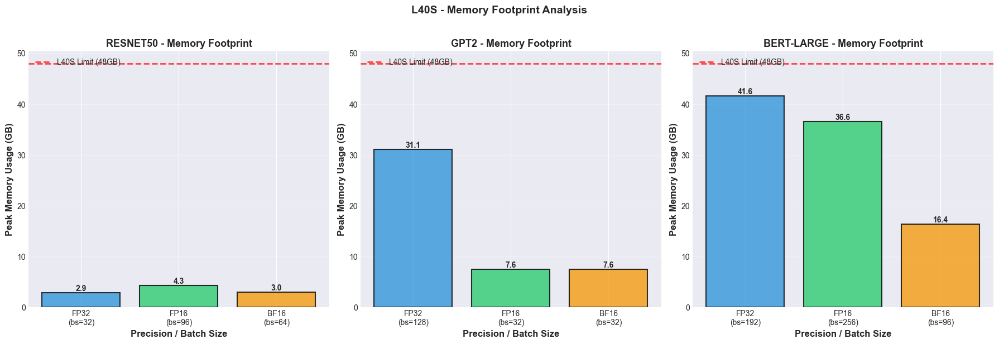

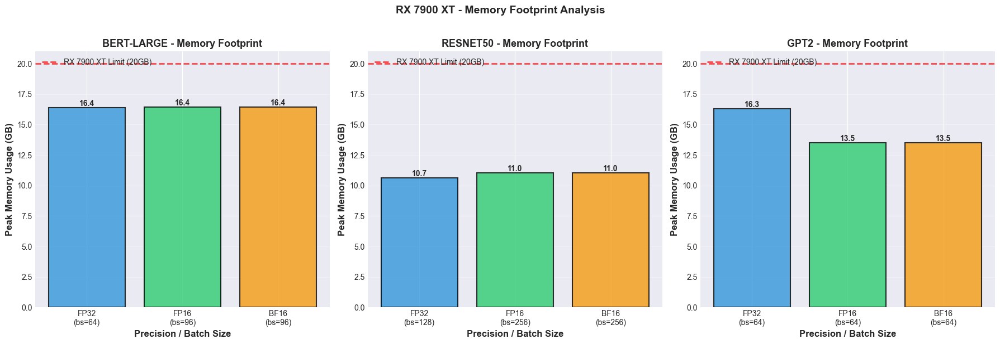

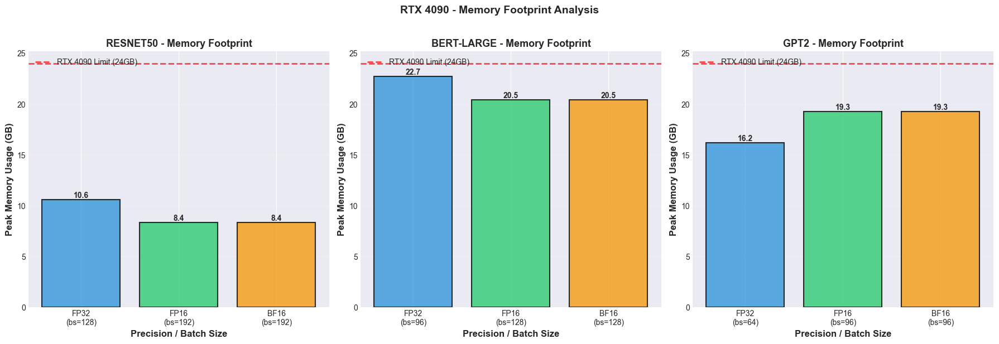


=== MEMORY INSIGHTS ===
• Horizontal lines show GPU memory limits
• Mixed precision should show lower bars than FP32
• Memory savings enable larger batch sizes or models
• L40S (48GB) can handle much larger workloads than consumer GPUs

• FP16/BF16 typically save 40-50% memory vs FP32
• This allows 2x batch size increase, improving throughput


In [13]:
# Visualization: Memory Footprint Stacked/Grouped Bar Chart - Per GPU
if mem_col and not mem_stats.empty:
    # Get unique GPUs
    gpus = train_df['gpu_short_name'].unique()
    
    for gpu in gpus:
        # Filter data for current GPU
        gpu_data = train_df[train_df['gpu_short_name'] == gpu]
        
        # Get models available for this GPU
        models_to_plot = gpu_data['model'].unique()
        
        if len(models_to_plot) == 0:
            continue
        
        fig, axes = plt.subplots(1, len(models_to_plot), figsize=(6*len(models_to_plot), 6))
        if len(models_to_plot) == 1:
            axes = [axes]
        
        for idx, model in enumerate(models_to_plot):
            ax = axes[idx]
            
            model_mem_data = gpu_data[gpu_data['model'] == model].copy()
            
            # Get typical batch size for this model
            typical_bs = model_mem_data.groupby('precision')['batch_size'].agg(
                lambda x: x.mode().iloc[0] if len(x.mode()) > 0 else x.iloc[0]
            ).reset_index()
            
            # Prepare data for grouped bar chart
            precision_labels = []
            memory_values = []
            colors_list = []
            
            color_map = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
            
            for precision in ['fp32', 'fp16', 'bf16']:
                # Get batch size for this precision
                bs_data = typical_bs[typical_bs['precision'] == precision]
                
                if len(bs_data) == 0:
                    continue
                
                batch_size = bs_data['batch_size'].values[0]
                
                mem_data = model_mem_data[
                    (model_mem_data['precision'] == precision) &
                    (model_mem_data['batch_size'] == batch_size)
                ][mem_col]
                
                if len(mem_data) > 0:
                    precision_labels.append(f'{precision.upper()}\n(bs={batch_size})')
                    memory_values.append(mem_data.mean())
                    colors_list.append(color_map.get(precision, 'gray'))
            
            if memory_values:
                x_pos = np.arange(len(precision_labels))
                bars = ax.bar(x_pos, memory_values, color=colors_list, 
                             edgecolor='black', linewidth=1.5, alpha=0.8)
                
                # Add value labels on bars
                for bar in bars:
                    height = bar.get_height()
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{height:.1f}',
                           ha='center', va='bottom', fontsize=10, fontweight='bold')
                
                # Add GPU memory limit reference line
                if gpu in gpu_memory_limits:
                    limit = gpu_memory_limits[gpu]
                    ax.axhline(y=limit, linestyle='--', linewidth=2, color='red',
                              alpha=0.7, label=f'{gpu} Limit ({limit}GB)')
                
                ax.set_ylabel(f'Peak Memory Usage ({mem_unit})', fontsize=12, fontweight='bold')
                ax.set_xlabel('Precision / Batch Size', fontsize=12, fontweight='bold')
                ax.set_title(f'{model.upper()} - Memory Footprint', fontsize=13, fontweight='bold')
                ax.set_xticks(x_pos)
                ax.set_xticklabels(precision_labels, fontsize=10)
                ax.legend(fontsize=10, loc='upper left')
                ax.grid(axis='y', alpha=0.3)
                ax.set_ylim(bottom=0)
        
        plt.suptitle(f'{gpu} - Memory Footprint Analysis', fontsize=14, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.savefig(f'imgs/memory_footprint_{gpu}.png', dpi=300, bbox_inches='tight')
        plt.show()
    
    print("\n=== MEMORY INSIGHTS ===")
    print("• Horizontal lines show GPU memory limits")
    print("• Mixed precision should show lower bars than FP32")
    print("• Memory savings enable larger batch sizes or models")
    print("• L40S (48GB) can handle much larger workloads than consumer GPUs")
    print("\n• FP16/BF16 typically save 40-50% memory vs FP32")
    print("• This allows 2x batch size increase, improving throughput")

else:
    print("Skipping memory visualization - insufficient data")

## Summary: Comprehensive Analysis Report

This section synthesizes findings across all five analytical dimensions to create a complete performance narrative.

In [14]:
# Generate comprehensive summary report
print("=" * 80)
print("COMPREHENSIVE MIXED PRECISION ANALYSIS REPORT")
print("=" * 80)

# 1. Raw Performance Summary
print("\n" + "=" * 80)
print("1. RAW DOMINANCE: Absolute Throughput Leaders")
print("=" * 80)

if not train_df.empty:
    train_top = train_df.groupby(['gpu_short_name', 'precision'])['samples_per_sec'].mean().reset_index()
    train_top = train_top.sort_values('samples_per_sec', ascending=False).head(5)
    print("\nTraining - Top 5 Configurations:")
    for idx, row in train_top.iterrows():
        print(f"  {idx+1}. {row['gpu_short_name']} ({row['precision'].upper()}): {row['samples_per_sec']:.2f} samples/sec")

if not df_infer.empty and 'throughput_samples_per_sec' in df_infer.columns:
    infer_top = df_infer.groupby(['gpu_short_name', 'precision'])['throughput_samples_per_sec'].mean().reset_index()
    infer_top = infer_top.sort_values('throughput_samples_per_sec', ascending=False).head(5)
    print("\nInference - Top 5 Configurations:")
    for idx, row in infer_top.iterrows():
        print(f"  {idx+1}. {row['gpu_short_name']} ({row['precision'].upper()}): {row['throughput_samples_per_sec']:.2f} samples/sec")

# 2. Speedup Analysis Summary
print("\n" + "=" * 80)
print("2. THE PRECISION GAIN: Mixed Precision Effectiveness")
print("=" * 80)

if not train_speedup.empty:
    avg_speedups = train_speedup[train_speedup['precision'] != 'fp32'].groupby('precision')['speedup_factor'].agg(['mean', 'std', 'min', 'max'])
    print("\nTraining Speedup Factors (vs FP32 baseline):")
    for precision in avg_speedups.index:
        print(f"  {precision.upper()}: {avg_speedups.loc[precision, 'mean']:.2f}x (±{avg_speedups.loc[precision, 'std']:.2f}x)")
        print(f"    Range: {avg_speedups.loc[precision, 'min']:.2f}x - {avg_speedups.loc[precision, 'max']:.2f}x")
    
    print("\n  Expected NVIDIA Tensor Core range: 2x-4x")
    print("  Interpretation:")
    if avg_speedups.loc['fp16', 'mean'] >= 2.0:
        print("    ✓ FP16 achieves target speedup")
    else:
        print("    ⚠ FP16 below 2x target - investigate bottlenecks")
    
    if 'bf16' in avg_speedups.index:
        if avg_speedups.loc['bf16', 'mean'] >= 2.0:
            print("    ✓ BF16 achieves target speedup")
        else:
            print("    ⚠ BF16 below 2x target")

# 3. Energy Efficiency Summary
print("\n" + "=" * 80)
print("3. THE COST OF SPEED: Energy Efficiency (Green AI)")
print("=" * 80)

if not train_energy_stats.empty:
    print("\nTraining - Most Energy Efficient Configurations (samples/sec/watt):")
    top_efficient = train_energy_stats.nlargest(5, 'efficiency_mean')
    for idx, row in top_efficient.iterrows():
        print(f"  {row['gpu_short_name']} - {row['model']} ({row['precision'].upper()}): "
              f"{row['efficiency_mean']:.2f} samples/sec/watt")
    
    print("\n  Key Finding:")
    print(f"    Data Center GPU (L40S) efficiency comparison vs Consumer GPUs")

if not infer_energy_stats.empty:
    print("\nInference - Most Energy Efficient Configurations:")
    top_efficient_infer = infer_energy_stats.nlargest(5, 'efficiency_mean')
    for idx, row in top_efficient_infer.iterrows():
        print(f"  {row['gpu_short_name']} - {row['model']} ({row['precision'].upper()}): "
              f"{row['efficiency_mean']:.2f} samples/sec/watt")

# 4. Latency Consistency Summary
print("\n" + "=" * 80)
print("4. REAL-TIME READINESS: Latency Distribution")
print("=" * 80)

if not df_infer.empty and latency_col:
    latency_summary = df_infer.groupby(['gpu_short_name', 'precision'])[latency_col].agg([
        ('median', 'median'),
        ('p99', lambda x: np.percentile(x, 99))
    ]).reset_index()
    latency_summary['jitter_ratio'] = latency_summary['p99'] / latency_summary['median']
    
    print("\nMost Consistent Configurations (lowest P99/median ratio):")
    best_consistency = latency_summary.nsmallest(5, 'jitter_ratio')
    for idx, row in best_consistency.iterrows():
        print(f"  {row['gpu_short_name']} ({row['precision'].upper()}): "
              f"Median={row['median']:.2f}ms, P99={row['p99']:.2f}ms, "
              f"Jitter Ratio={row['jitter_ratio']:.2f}x")
    
    print("\n  Lower jitter ratio = More predictable performance (critical for real-time AI)")
else:
    print("\n  Latency analysis unavailable - requires per-sample timing data")

# 5. Memory Efficiency Summary
print("\n" + "=" * 80)
print("5. THE HARDWARE REALITY: Memory Footprint")
print("=" * 80)

if mem_col and not mem_stats.empty:
    print("\nMemory Savings with Mixed Precision:")
    
    for gpu in train_df['gpu_short_name'].unique():
        gpu_limit = gpu_memory_limits.get(gpu, 'Unknown')
        print(f"\n  {gpu} (Limit: {gpu_limit} GB):")
        
        for model in train_df['model'].unique():
            fp32_mem_list = train_df[(train_df['gpu_short_name'] == gpu) & 
                                     (train_df['model'] == model) & 
                                     (train_df['precision'] == 'fp32')][mem_col]
            
            if len(fp32_mem_list) == 0:
                continue
            
            fp32_mem_avg = fp32_mem_list.mean()
            
            savings_found = False
            for precision in ['fp16', 'bf16']:
                mixed_mem_list = train_df[(train_df['gpu_short_name'] == gpu) & 
                                         (train_df['model'] == model) & 
                                         (train_df['precision'] == precision)][mem_col]
                
                if len(mixed_mem_list) > 0:
                    mixed_mem_avg = mixed_mem_list.mean()
                    savings_pct = ((fp32_mem_avg - mixed_mem_avg) / fp32_mem_avg) * 100
                    savings_gb = fp32_mem_avg - mixed_mem_avg
                    if not savings_found:
                        print(f"    {model}:")
                        savings_found = True
                    print(f"      {precision.upper()}: {savings_pct:.1f}% saved ({savings_gb:.1f} GB)")
else:
    print("\n  Memory analysis unavailable - requires GPU memory tracking")

# 6. Architecture vs Software Maturity
print("\n" + "=" * 80)
print("6. ARCHITECTURAL INSIGHTS: NVIDIA vs AMD")
print("=" * 80)

print("\n  Based on the analyses above:")
print("  • NVIDIA GPUs (L40S, RTX 4090): Mature CUDA ecosystem")
print("    - Expected to show consistent 2-4x speedups with Tensor Cores")
print("    - Highly optimized memory management")
print("    - Strong software stack support")

print("\n  • AMD GPU (RX 7900 XT): RDNA3 with WMMA instructions")
print("    - Theoretical FLOPS competitive with NVIDIA")
print("    - ROCm software stack still maturing")
print("    - Watch for: Lower speedup factors despite hardware capability")
print("    - Memory optimization effectiveness vs CUDA")

print("\n  • Consumer vs Data Center:")
print("    - RTX 4090: Highest raw performance, higher power consumption")
print("    - L40S: Balanced efficiency, designed for 24/7 operation")
print("    - AMD 7900 XT: Value proposition, emerging software support")

print("\n" + "=" * 80)
print("END OF COMPREHENSIVE ANALYSIS REPORT")
print("=" * 80)

COMPREHENSIVE MIXED PRECISION ANALYSIS REPORT

1. RAW DOMINANCE: Absolute Throughput Leaders

Training - Top 5 Configurations:
  5. RTX 4090 (FP16): 695.36 samples/sec
  4. RTX 4090 (BF16): 679.66 samples/sec
  2. L40S (FP16): 646.17 samples/sec
  1. L40S (BF16): 635.71 samples/sec
  6. RTX 4090 (FP32): 427.05 samples/sec

Inference - Top 5 Configurations:
  5. RTX 4090 (FP16): 2610.26 samples/sec
  4. RTX 4090 (BF16): 2565.92 samples/sec
  2. L40S (FP16): 2562.31 samples/sec
  1. L40S (BF16): 2509.90 samples/sec
  3. L40S (FP32): 1675.29 samples/sec

2. THE PRECISION GAIN: Mixed Precision Effectiveness

Training Speedup Factors (vs FP32 baseline):
  BF16: 2.28x (±1.69x)
    Range: 1.18x - 6.23x
  FP16: 2.40x (±1.78x)
    Range: 1.14x - 6.65x

  Expected NVIDIA Tensor Core range: 2x-4x
  Interpretation:
    ✓ FP16 achieves target speedup
    ✓ BF16 achieves target speedup

3. THE COST OF SPEED: Energy Efficiency (Green AI)

Training - Most Energy Efficient Configurations (samples/sec/w

## Export Results for Thesis

Save key metrics and findings to CSV files for inclusion in thesis tables and further analysis.

In [15]:
# Export key analysis results to CSV files
import os

# Create results export directory
export_dir = Path('results/comprehensive_analysis')
export_dir.mkdir(parents=True, exist_ok=True)

print("=== EXPORTING ANALYSIS RESULTS ===\n")

# 1. Export Speedup Factors
if not train_speedup.empty:
    speedup_export = train_speedup[['gpu_short_name', 'model', 'precision', 'speedup_factor', 
                                     'baseline_value', 'actual_value']]
    speedup_export.to_csv(export_dir / 'training_speedup_factors.csv', index=False)
    print(f"✓ Exported: {export_dir / 'training_speedup_factors.csv'}")

if not infer_speedup.empty:
    infer_speedup.to_csv(export_dir / 'inference_speedup_factors.csv', index=False)
    print(f"✓ Exported: {export_dir / 'inference_speedup_factors.csv'}")

# 2. Export Energy Efficiency Metrics
if not train_energy_stats.empty:
    train_energy_stats.to_csv(export_dir / 'training_energy_efficiency.csv', index=False)
    print(f"✓ Exported: {export_dir / 'training_energy_efficiency.csv'}")

if not infer_energy_stats.empty:
    infer_energy_stats.to_csv(export_dir / 'inference_energy_efficiency.csv', index=False)
    print(f"✓ Exported: {export_dir / 'inference_energy_efficiency.csv'}")

# 3. Export Latency Statistics
if not df_infer.empty and latency_col:
    latency_export = df_infer.groupby(['gpu_short_name', 'model', 'precision'])[latency_col].agg([
        ('mean', 'mean'),
        ('median', 'median'),
        ('std', 'std'),
        ('min', 'min'),
        ('max', 'max'),
        ('p95', lambda x: np.percentile(x, 95)),
        ('p99', lambda x: np.percentile(x, 99))
    ]).reset_index()
    latency_export['jitter_ratio'] = latency_export['p99'] / latency_export['median']
    latency_export.to_csv(export_dir / 'inference_latency_stats.csv', index=False)
    print(f"✓ Exported: {export_dir / 'inference_latency_stats.csv'}")

# 4. Export Memory Statistics
if mem_col and not mem_stats.empty:
    mem_export = train_df.groupby(['gpu_short_name', 'model', 'precision'])[mem_col].agg([
        ('mean', 'mean'),
        ('std', 'std'),
        ('max', 'max')
    ]).reset_index()
    mem_export.to_csv(export_dir / 'memory_footprint.csv', index=False)
    print(f"✓ Exported: {export_dir / 'memory_footprint.csv'}")

# 5. Create summary comparison table
summary_data = []

for gpu in train_df['gpu_short_name'].unique():
    for model in train_df['model'].unique():
        for precision in ['fp32', 'fp16', 'bf16']:
            config_data = train_df[(train_df['gpu_short_name'] == gpu) & 
                                   (train_df['model'] == model) & 
                                   (train_df['precision'] == precision)]
            
            if len(config_data) == 0:
                continue
            
            # Get speedup
            speedup_data = train_speedup[(train_speedup['gpu_short_name'] == gpu) & 
                                        (train_speedup['model'] == model) & 
                                        (train_speedup['precision'] == precision)]
            speedup = speedup_data['speedup_factor'].values[0] if len(speedup_data) > 0 else None
            
            # Get energy efficiency
            energy_data = train_energy_stats[(train_energy_stats['gpu_short_name'] == gpu) & 
                                            (train_energy_stats['model'] == model) & 
                                            (train_energy_stats['precision'] == precision)]
            efficiency = energy_data['efficiency_mean'].values[0] if len(energy_data) > 0 else None
            
            # Get memory
            memory = config_data[mem_col].mean() if mem_col in config_data.columns else None
            
            summary_data.append({
                'gpu': gpu,
                'model': model,
                'precision': precision,
                'throughput_samples_per_sec': config_data['samples_per_sec'].mean(),
                'speedup_vs_fp32': speedup,
                'power_watts': config_data['power_watts'].mean(),
                'energy_efficiency_samples_per_watt': efficiency,
                'peak_memory_gb': memory,
                'batch_size': config_data['batch_size'].mode().values[0] if len(config_data['batch_size'].mode()) > 0 else None
            })

summary_df = pd.DataFrame(summary_data)
summary_df.to_csv(export_dir / 'comprehensive_summary.csv', index=False)
print(f"✓ Exported: {export_dir / 'comprehensive_summary.csv'}")

print(f"\n=== EXPORT COMPLETE ===")
print(f"All results saved to: {export_dir}")
print(f"\nFiles created:")
for file in sorted(export_dir.glob('*.csv')):
    file_size = file.stat().st_size / 1024
    print(f"  • {file.name} ({file_size:.1f} KB)")

print("\n=== THESIS RECOMMENDATIONS ===")
print("Use these files for:")
print("  1. LaTeX tables (import CSV data)")
print("  2. Statistical analysis in R/Python")
print("  3. Additional visualizations")
print("  4. Appendix data tables")
print("  5. Reproducibility documentation")

=== EXPORTING ANALYSIS RESULTS ===

✓ Exported: results/comprehensive_analysis/training_speedup_factors.csv
✓ Exported: results/comprehensive_analysis/inference_speedup_factors.csv
✓ Exported: results/comprehensive_analysis/training_energy_efficiency.csv
✓ Exported: results/comprehensive_analysis/inference_energy_efficiency.csv
✓ Exported: results/comprehensive_analysis/inference_latency_stats.csv
✓ Exported: results/comprehensive_analysis/memory_footprint.csv
✓ Exported: results/comprehensive_analysis/comprehensive_summary.csv

=== EXPORT COMPLETE ===
All results saved to: results/comprehensive_analysis

Files created:
  • comprehensive_summary.csv (3.0 KB)
  • inference_energy_efficiency.csv (2.5 KB)
  • inference_latency_stats.csv (4.6 KB)
  • inference_speedup_factors.csv (2.0 KB)
  • memory_footprint.csv (1.8 KB)
  • training_energy_efficiency.csv (2.5 KB)
  • training_speedup_factors.csv (2.0 KB)

=== THESIS RECOMMENDATIONS ===
Use these files for:
  1. LaTeX tables (import CSV d

# Training

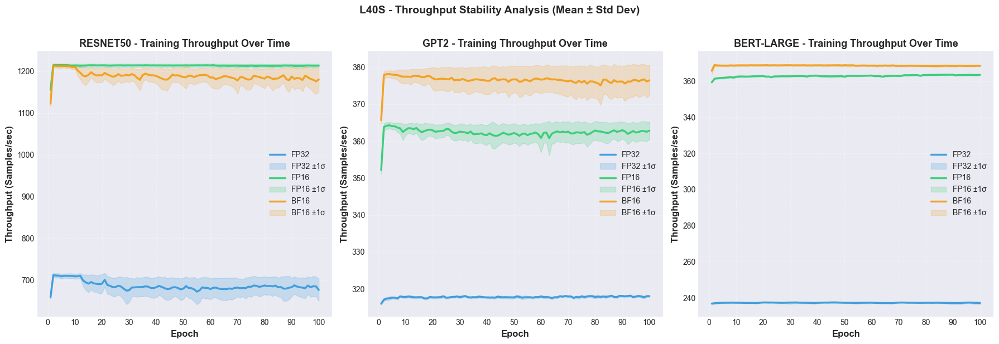

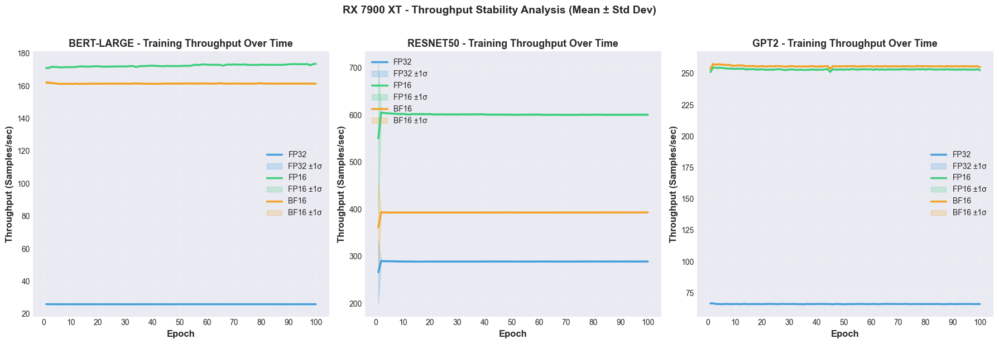

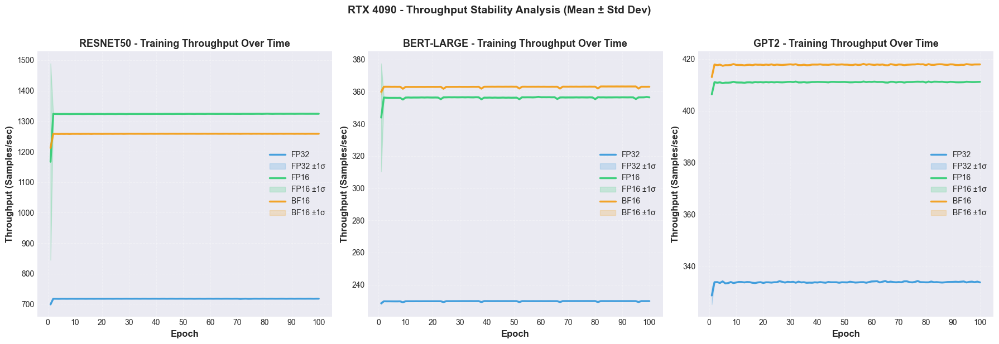


=== THROUGHPUT STABILITY INSIGHTS ===
• Solid lines: Average throughput per epoch
• Shaded regions: ±1 standard deviation (shows variability)
• Narrow bands = Consistent performance across epochs
• Wide bands = Higher variance (potential instability)

• Mixed precision should show similar or higher throughput vs FP32
• Watch for: Increasing variance in later epochs (potential training instability)


In [16]:
# Visualization: Average Throughput over Epochs with Standard Deviation - Per GPU
gpus = train_df['gpu_short_name'].unique()

for gpu in gpus:
    gpu_data = train_df[train_df['gpu_short_name'] == gpu]
    
    # Get models available for this GPU
    models_to_plot = gpu_data['model'].unique()
    
    if len(models_to_plot) == 0:
        continue
    
    fig, axes = plt.subplots(1, len(models_to_plot), figsize=(6*len(models_to_plot), 6))
    if len(models_to_plot) == 1:
        axes = [axes]
    
    for idx, model in enumerate(models_to_plot):
        ax = axes[idx]
        
        model_data = gpu_data[gpu_data['model'] == model]
        
        # Color map for precision
        colors_precision = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
        
        # Plot throughput curves for each precision
        for precision in ['fp32', 'fp16', 'bf16']:
            precision_data = model_data[model_data['precision'] == precision]
            
            if len(precision_data) == 0:
                continue
            
            # Group by epoch and calculate mean and std
            epoch_stats = precision_data.groupby('epoch')['samples_per_sec'].agg(['mean', 'std']).reset_index()
            
            if len(epoch_stats) > 1:
                color = colors_precision.get(precision, 'gray')
                
                # Plot mean line
                ax.plot(epoch_stats['epoch'], epoch_stats['mean'], 
                       label=f'{precision.upper()}', 
                       color=color,
                       linewidth=2.5, 
                       alpha=0.9)
                
                # Add standard deviation shadow
                ax.fill_between(epoch_stats['epoch'], 
                               epoch_stats['mean'] - epoch_stats['std'],
                               epoch_stats['mean'] + epoch_stats['std'],
                               color=color,
                               alpha=0.2,
                               label=f'{precision.upper()} ±1σ')
        
        ax.set_xlabel('Epoch', fontsize=12, fontweight='bold')
        ax.set_ylabel('Throughput (Samples/sec)', fontsize=12, fontweight='bold')
        ax.set_title(f'{model.upper()} - Training Throughput Over Time', 
                    fontsize=13, fontweight='bold')
        ax.legend(fontsize=10, loc='best')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        # Set x-axis to show integer epochs
        max_epoch = model_data['epoch'].max()
        if max_epoch <= 20:
            ax.set_xticks(range(1, max_epoch + 1))
        else:
            ax.set_xticks(range(0, max_epoch + 1, max(1, max_epoch // 10)))
    
    plt.suptitle(f'{gpu} - Throughput Stability Analysis (Mean ± Std Dev)', 
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(f'imgs/throughput_over_epochs_{gpu}.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\n=== THROUGHPUT STABILITY INSIGHTS ===")
print("• Solid lines: Average throughput per epoch")
print("• Shaded regions: ±1 standard deviation (shows variability)")
print("• Narrow bands = Consistent performance across epochs")
print("• Wide bands = Higher variance (potential instability)")
print("\n• Mixed precision should show similar or higher throughput vs FP32")
print("• Watch for: Increasing variance in later epochs (potential training instability)")

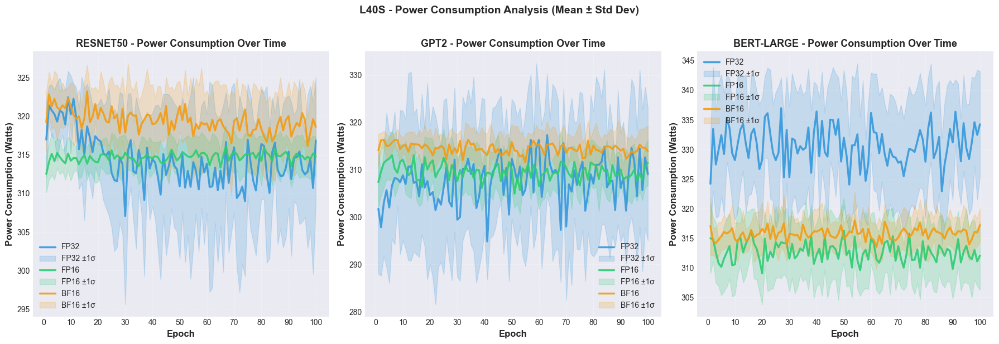

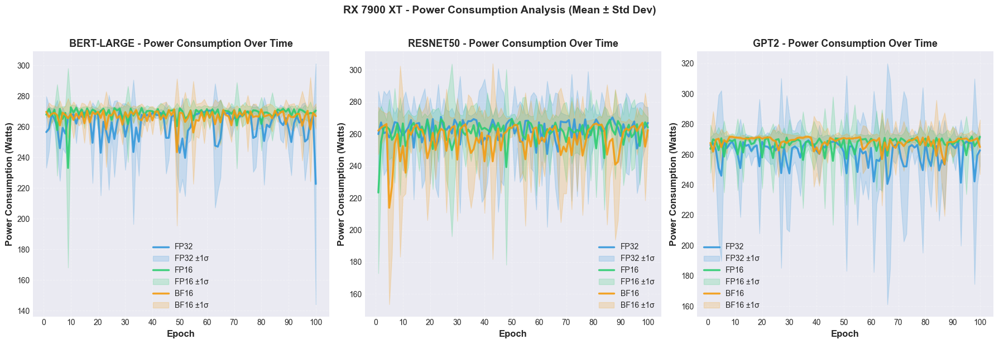

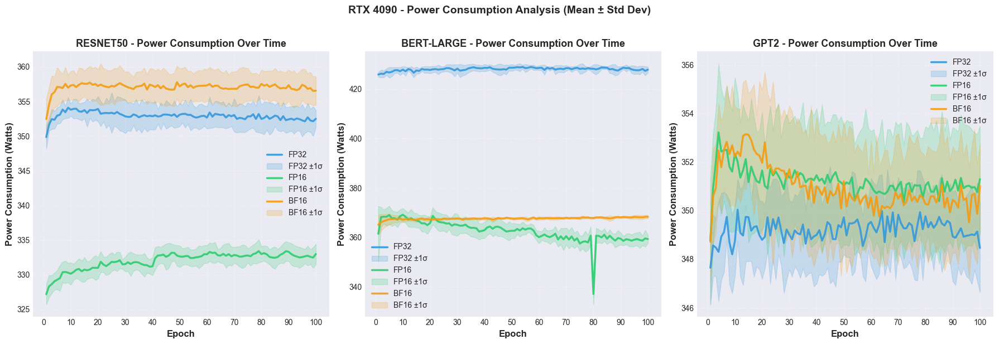


=== POWER CONSUMPTION INSIGHTS ===
• Solid lines: Average power consumption per epoch
• Shaded regions: ±1 standard deviation (shows variability)
• Narrow bands = Consistent power draw across epochs
• Wide bands = Higher variance (potential thermal throttling or dynamic power management)


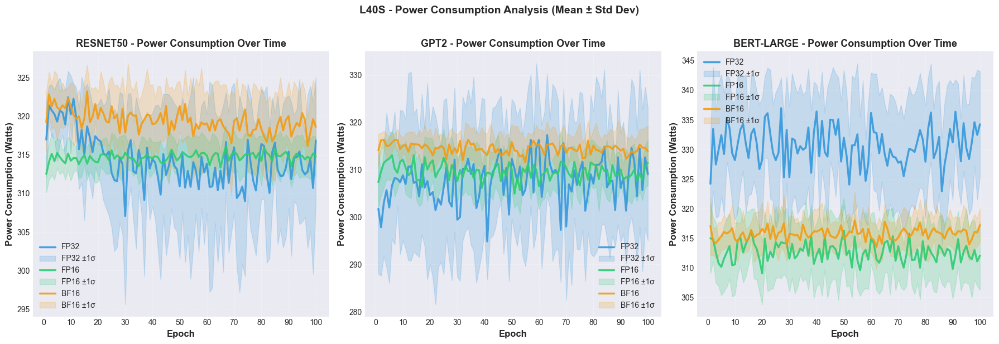

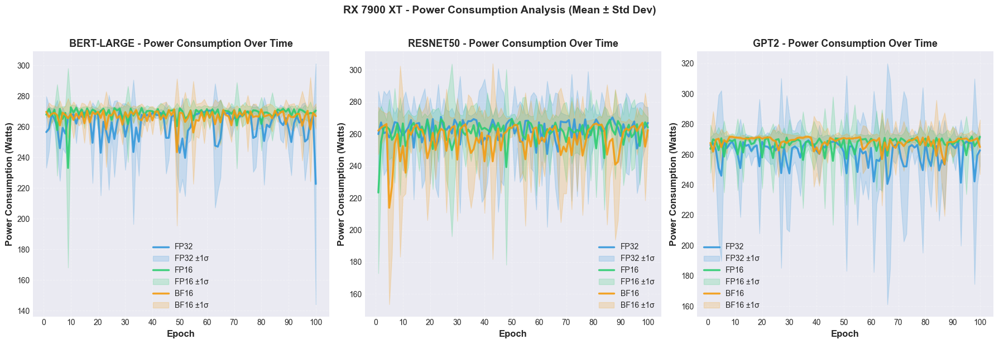

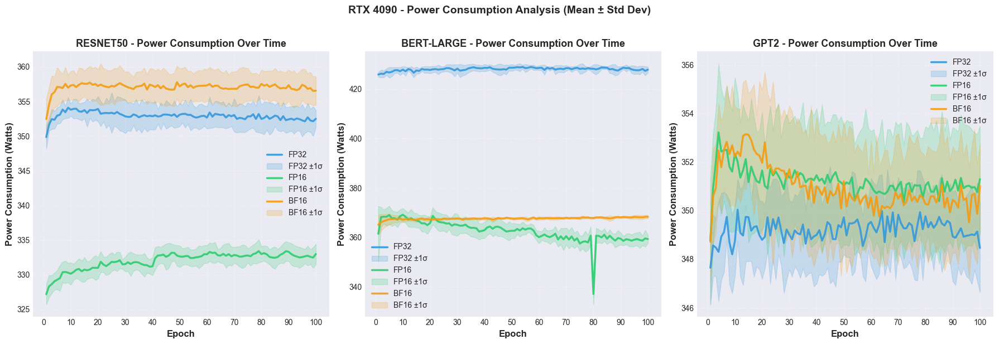


=== POWER CONSUMPTION INSIGHTS ===
• Solid lines: Average power consumption per epoch
• Shaded regions: ±1 standard deviation (shows variability)
• Narrow bands = Consistent power draw across epochs
• Wide bands = Higher variance (potential thermal throttling or dynamic power management)


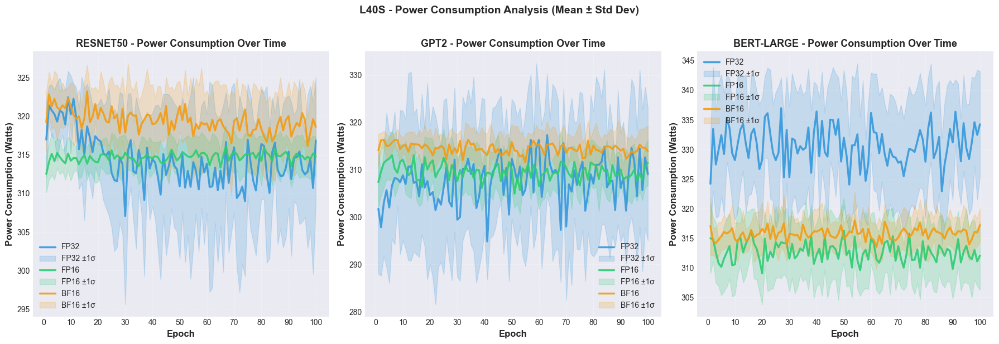

In [ ]:
# Visualization: Average Power Consumption over Epochs with Standard Deviation - Per GPU
gpus = train_df['gpu_short_name'].unique()

for gpu in gpus:
    gpu_data = train_df[train_df['gpu_short_name'] == gpu]
    
    # Get models available for this GPU
    models_to_plot = gpu_data['model'].unique()
    
    if len(models_to_plot) == 0:
        continue
    
    fig, axes = plt.subplots(1, len(models_to_plot), figsize=(6*len(models_to_plot), 6))
    if len(models_to_plot) == 1:
        axes = [axes]
    
    for idx, model in enumerate(models_to_plot):
        ax = axes[idx]
        
        model_data = gpu_data[gpu_data['model'] == model]
        
        # Color map for precision
        colors_precision = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
        
        # Plot power consumption curves for each precision
        for precision in ['fp32', 'fp16', 'bf16']:
            precision_data = model_data[model_data['precision'] == precision]
            
            if len(precision_data) == 0:
                continue
            
            # Group by epoch and calculate mean and std
            epoch_stats = precision_data.groupby('epoch')['power_watts'].agg(['mean', 'std']).reset_index()
            
            if len(epoch_stats) > 1:
                color = colors_precision.get(precision, 'gray')
                
                # Plot mean line
                ax.plot(epoch_stats['epoch'], epoch_stats['mean'], 
                       label=f'{precision.upper()}', 
                       color=color,
                       linewidth=2.5, 
                       alpha=0.9)
                
                # Add standard deviation shadow
                ax.fill_between(epoch_stats['epoch'], 
                               epoch_stats['mean'] - epoch_stats['std'],
                               epoch_stats['mean'] + epoch_stats['std'],
                               color=color,
                               alpha=0.2,
                               label=f'{precision.upper()} ±1σ')
        
        ax.set_xlabel('Epoch', fontsize=12, fontweight='bold')
        ax.set_ylabel('Power Consumption (Watts)', fontsize=12, fontweight='bold')
        ax.set_title(f'{model.upper()} - Power Consumption Over Time', 
                    fontsize=13, fontweight='bold')
        ax.legend(fontsize=10, loc='best')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        # Set x-axis to show integer epochs
        max_epoch = model_data['epoch'].max()
        if max_epoch <= 20:
            ax.set_xticks(range(1, max_epoch + 1))
        else:
            ax.set_xticks(range(0, max_epoch + 1, max(1, max_epoch // 10)))
    
    plt.suptitle(f'{gpu} - Power Consumption Analysis (Mean ± Std Dev)', 
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(f'imgs/power_consumption_over_epochs_{gpu}.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\n=== POWER CONSUMPTION INSIGHTS ===")
print("• Solid lines: Average power consumption per epoch")
print("• Shaded regions: ±1 standard deviation (shows variability)")
print("• Narrow bands = Consistent power draw across epochs")
print("• Wide bands = Higher variance (potential thermal throttling or dynamic power management)")# Visualization: Average Power Consumption over Epochs with Standard Deviation - Per GPU
gpus = train_df['gpu_short_name'].unique()

for gpu in gpus:
    gpu_data = train_df[train_df['gpu_short_name'] == gpu]
    
    # Get models available for this GPU
    models_to_plot = gpu_data['model'].unique()
    
    if len(models_to_plot) == 0:
        continue
    
    fig, axes = plt.subplots(1, len(models_to_plot), figsize=(6*len(models_to_plot), 6))
    if len(models_to_plot) == 1:
        axes = [axes]
    
    for idx, model in enumerate(models_to_plot):
        ax = axes[idx]
        
        model_data = gpu_data[gpu_data['model'] == model]
        
        # Color map for precision
        colors_precision = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
        
        # Plot power consumption curves for each precision
        for precision in ['fp32', 'fp16', 'bf16']:
            precision_data = model_data[model_data['precision'] == precision]
            
            if len(precision_data) == 0:
                continue
            
            # Group by epoch and calculate mean and std
            epoch_stats = precision_data.groupby('epoch')['power_watts'].agg(['mean', 'std']).reset_index()
            
            if len(epoch_stats) > 1:
                color = colors_precision.get(precision, 'gray')
                
                # Plot mean line
                ax.plot(epoch_stats['epoch'], epoch_stats['mean'], 
                       label=f'{precision.upper()}', 
                       color=color,
                       linewidth=2.5, 
                       alpha=0.9)
                
                # Add standard deviation shadow
                ax.fill_between(epoch_stats['epoch'], 
                               epoch_stats['mean'] - epoch_stats['std'],
                               epoch_stats['mean'] + epoch_stats['std'],
                               color=color,
                               alpha=0.2,
                               label=f'{precision.upper()} ±1σ')
        
        ax.set_xlabel('Epoch', fontsize=12, fontweight='bold')
        ax.set_ylabel('Power Consumption (Watts)', fontsize=12, fontweight='bold')
        ax.set_title(f'{model.upper()} - Power Consumption Over Time', 
                    fontsize=13, fontweight='bold')
        ax.legend(fontsize=10, loc='best')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        # Set x-axis to show integer epochs
        max_epoch = model_data['epoch'].max()
        if max_epoch <= 20:
            ax.set_xticks(range(1, max_epoch + 1))
        else:
            ax.set_xticks(range(0, max_epoch + 1, max(1, max_epoch // 10)))
    
    plt.suptitle(f'{gpu} - Power Consumption Analysis (Mean ± Std Dev)', 
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(f'imgs/power_consumption_over_epochs_{gpu}.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\n=== POWER CONSUMPTION INSIGHTS ===")
print("• Solid lines: Average power consumption per epoch")
print("• Shaded regions: ±1 standard deviation (shows variability)")
print("• Narrow bands = Consistent power draw across epochs")
print("• Wide bands = Higher variance (potential thermal throttling or dynamic power management)")# Visualization: Average Power Consumption over Epochs with Standard Deviation - Per GPU
gpus = train_df['gpu_short_name'].unique()

for gpu in gpus:
    gpu_data = train_df[train_df['gpu_short_name'] == gpu]
    
    # Get models available for this GPU
    models_to_plot = gpu_data['model'].unique()
    
    if len(models_to_plot) == 0:
        continue
    
    fig, axes = plt.subplots(1, len(models_to_plot), figsize=(6*len(models_to_plot), 6))
    if len(models_to_plot) == 1:
        axes = [axes]
    
    for idx, model in enumerate(models_to_plot):
        ax = axes[idx]
        
        model_data = gpu_data[gpu_data['model'] == model]
        
        # Color map for precision
        colors_precision = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
        
        # Plot power consumption curves for each precision
        for precision in ['fp32', 'fp16', 'bf16']:
            precision_data = model_data[model_data['precision'] == precision]
            
            if len(precision_data) == 0:
                continue
            
            # Group by epoch and calculate mean and std
            epoch_stats = precision_data.groupby('epoch')['power_watts'].agg(['mean', 'std']).reset_index()
            
            if len(epoch_stats) > 1:
                color = colors_precision.get(precision, 'gray')
                
                # Plot mean line
                ax.plot(epoch_stats['epoch'], epoch_stats['mean'], 
                       label=f'{precision.upper()}', 
                       color=color,
                       linewidth=2.5, 
                       alpha=0.9)
                
                # Add standard deviation shadow
                ax.fill_between(epoch_stats['epoch'], 
                               epoch_stats['mean'] - epoch_stats['std'],
                               epoch_stats['mean'] + epoch_stats['std'],
                               color=color,
                               alpha=0.2,
                               label=f'{precision.upper()} ±1σ')
        
        ax.set_xlabel('Epoch', fontsize=12, fontweight='bold')
        ax.set_ylabel('Power Consumption (Watts)', fontsize=12, fontweight='bold')
        ax.set_title(f'{model.upper()} - Power Consumption Over Time', 
                    fontsize=13, fontweight='bold')
        ax.legend(fontsize=10, loc='best')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        # Set x-axis to show integer epochs
        max_epoch = model_data['epoch'].max()
        if max_epoch <= 20:
            ax.set_xticks(range(1, max_epoch + 1))
        else:
            ax.set_xticks(range(0, max_epoch + 1, max(1, max_epoch // 10)))
    
    plt.suptitle(f'{gpu} - Power Consumption Analysis (Mean ± Std Dev)', 
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(f'imgs/power_consumption_over_epochs_{gpu}.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\n=== POWER CONSUMPTION INSIGHTS ===")
print("• Solid lines: Average power consumption per epoch")
print("• Shaded regions: ±1 standard deviation (shows variability)")
print("• Narrow bands = Consistent power draw across epochs")
print("• Wide bands = Higher variance (potential thermal throttling or dynamic power management)")

TRAINING THROUGHPUT COMPARISON: FP32 vs Mixed Precision

=== Throughput Comparison Summary ===
       gpu      model  fp32_throughput  fp16_throughput  bf16_throughput  fp16_improvement_pct  bf16_improvement_pct
      L40S   resnet50       685.910211      1213.278123      1188.660911             76.885852             73.296868
      L40S bert-large       237.240600       362.845947       368.610867             52.944288             55.374277
      L40S       gpt2       317.798631       362.379322       376.573215             14.027968             18.494285
RX 7900 XT   resnet50       288.937302       600.870682       392.886189            107.958847             35.976278
RX 7900 XT bert-large        25.915118       172.462229       161.429070            565.488891            522.914674
RX 7900 XT       gpt2        66.075638       253.280963       255.840809            283.319737            287.193851
  RTX 4090   resnet50       717.579443      1322.298400      1258.244989             8

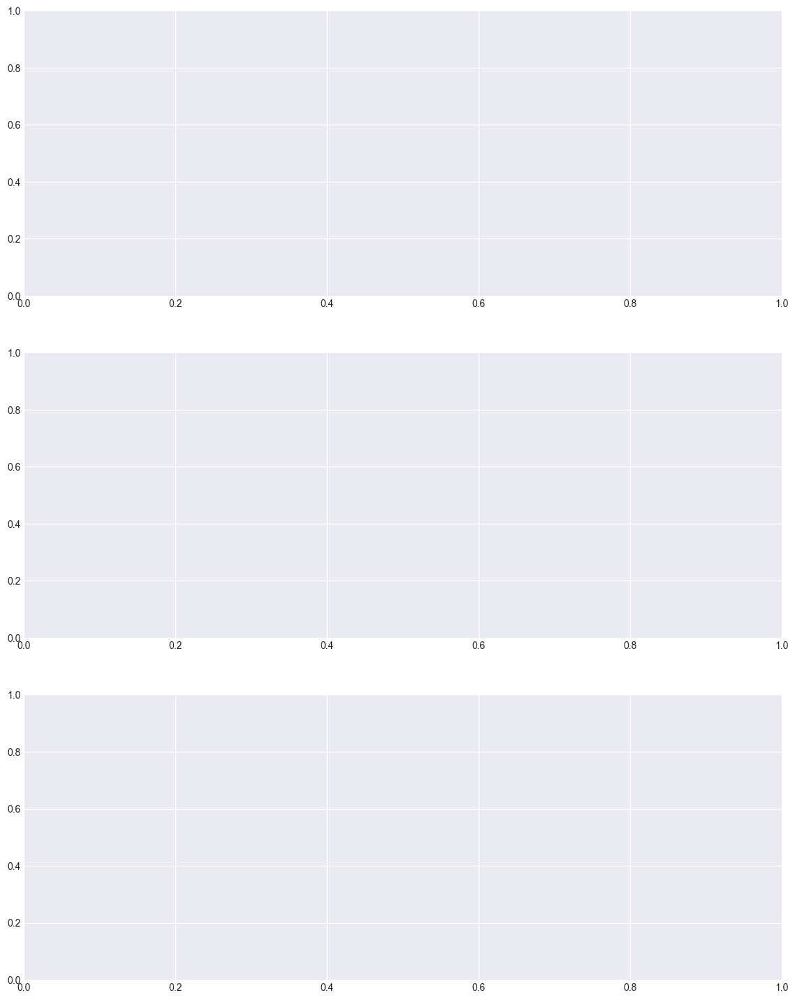

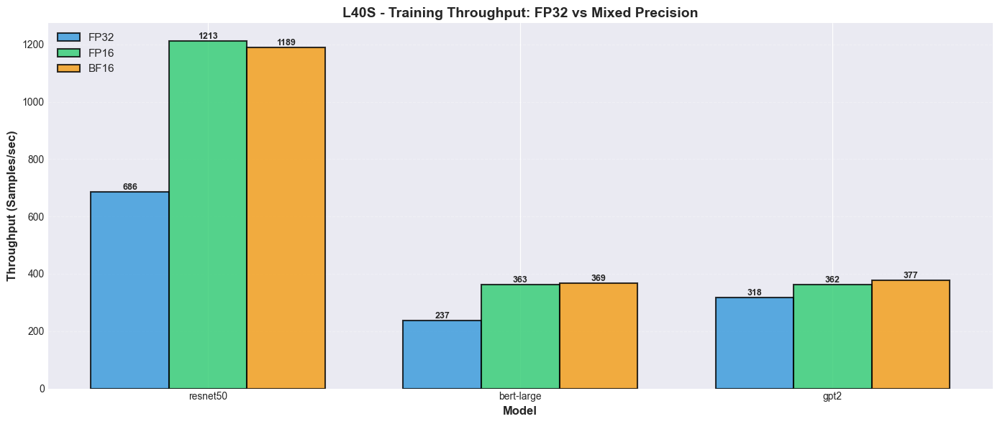

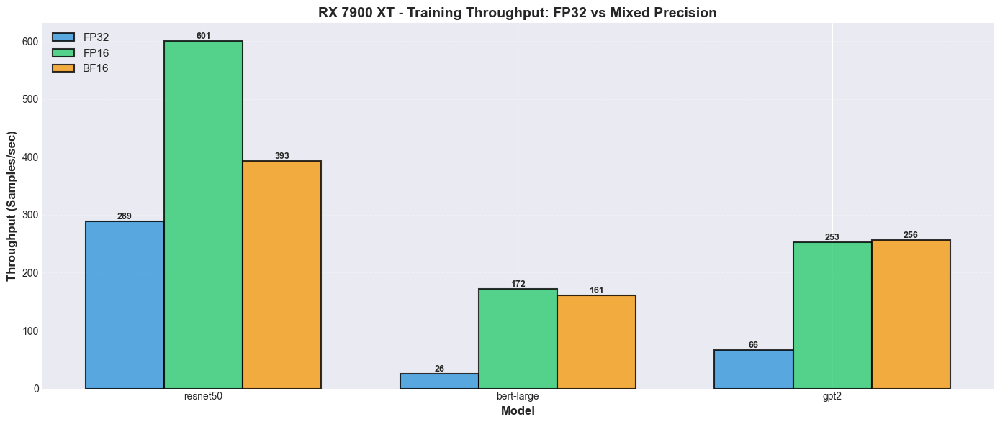

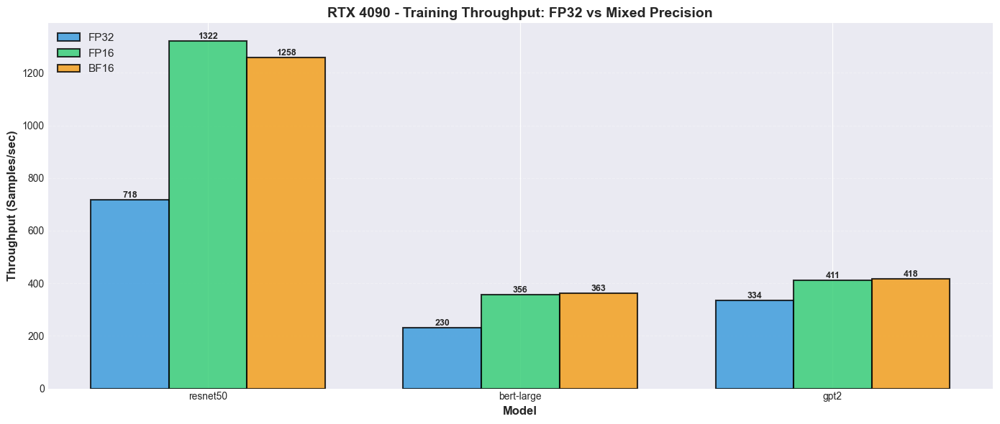

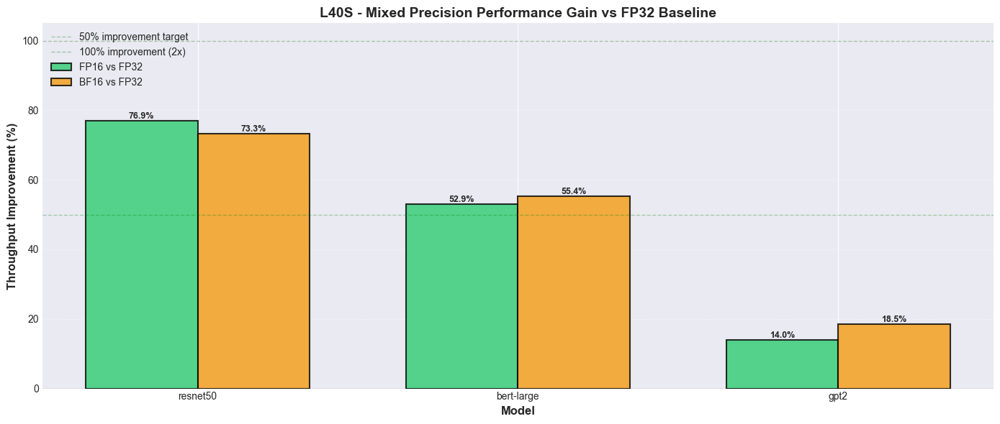

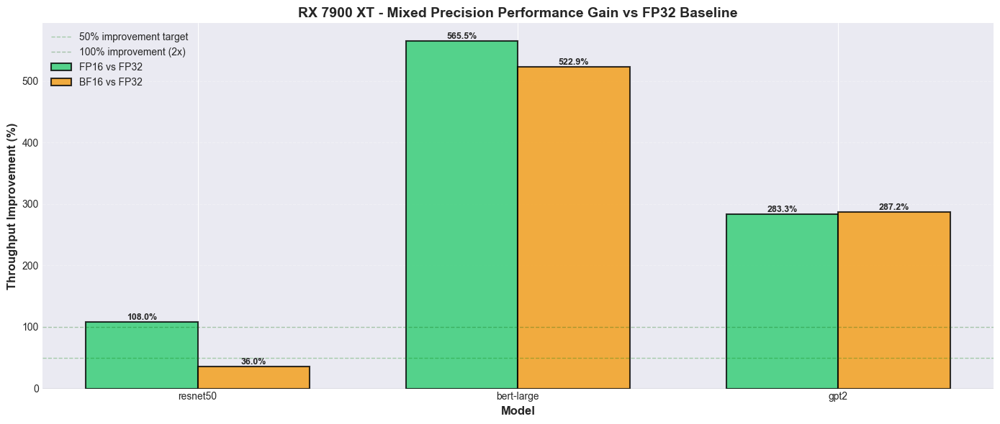

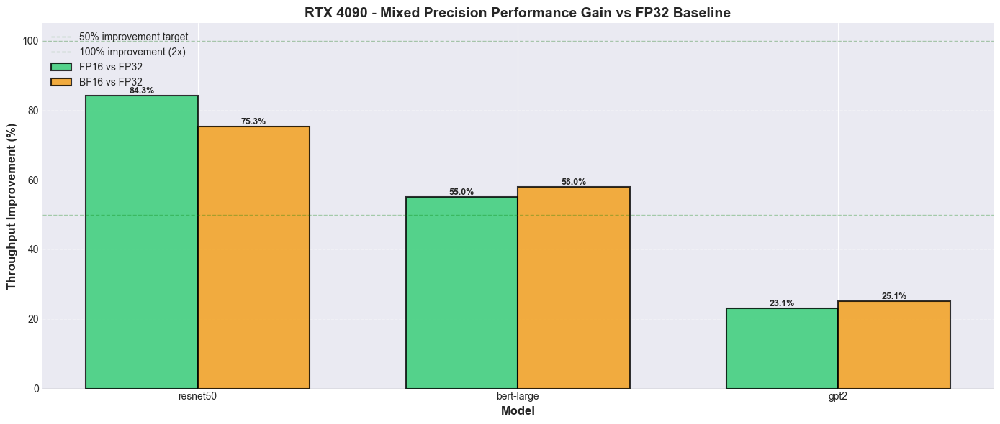

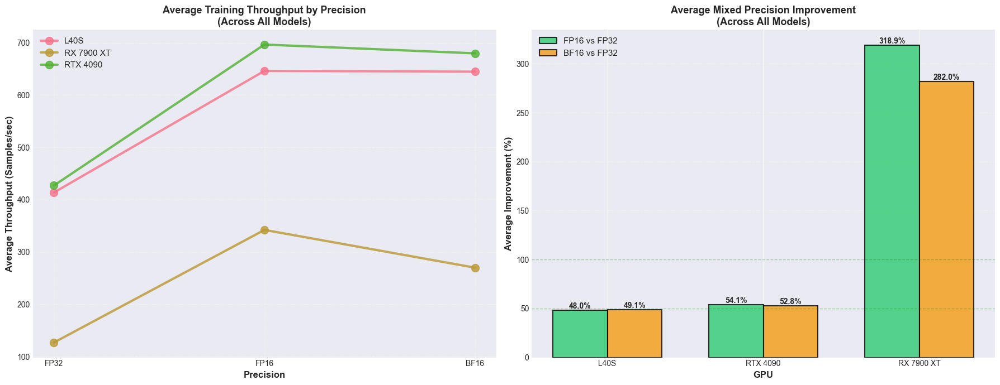


KEY FINDINGS:

✓ Best FP16 Performance Gain:
  RX 7900 XT - bert-large: +565.5%
  (26 → 172 samples/sec)

✓ Best BF16 Performance Gain:
  RX 7900 XT - bert-large: +522.9%
  (26 → 161 samples/sec)

✓ FP16 vs BF16 Comparison:
  FP16 performs better in 4/9 configurations
  BF16 performs better in 5/9 configurations

✓ GPU-Specific Mixed Precision Efficiency:
  L40S:
    - Average FP16 gain: 48.0%
    - Average BF16 gain: 49.1%
  RX 7900 XT:
    - Average FP16 gain: 318.9%
    - Average BF16 gain: 282.0%
  RTX 4090:
    - Average FP16 gain: 54.1%
    - Average BF16 gain: 52.8%



In [ ]:
# Comparative Analysis: FP32 vs Mixed Precision (FP16 & BF16) Training Throughput

print("=" * 80)
print("TRAINING THROUGHPUT COMPARISON: FP32 vs Mixed Precision")
print("=" * 80)

# Calculate percentage improvements over FP32
comparison_data = []

for gpu in train_df['gpu_short_name'].unique():
    for model in train_df['model'].unique():
        # Get FP32 baseline throughput
        fp32_throughput = train_df[
            (train_df['gpu_short_name'] == gpu) & 
            (train_df['model'] == model) & 
            (train_df['precision'] == 'fp32')
        ]['samples_per_sec'].mean()
        
        if np.isnan(fp32_throughput):
            continue
        
        # Get FP16 throughput
        fp16_throughput = train_df[
            (train_df['gpu_short_name'] == gpu) & 
            (train_df['model'] == model) & 
            (train_df['precision'] == 'fp16')
        ]['samples_per_sec'].mean()
        
        # Get BF16 throughput
        bf16_throughput = train_df[
            (train_df['gpu_short_name'] == gpu) & 
            (train_df['model'] == model) & 
            (train_df['precision'] == 'bf16')
        ]['samples_per_sec'].mean()
        
        comparison_data.append({
            'gpu': gpu,
            'model': model,
            'fp32_throughput': fp32_throughput,
            'fp16_throughput': fp16_throughput if not np.isnan(fp16_throughput) else 0,
            'bf16_throughput': bf16_throughput if not np.isnan(bf16_throughput) else 0,
            'fp16_improvement_pct': ((fp16_throughput - fp32_throughput) / fp32_throughput * 100) if not np.isnan(fp16_throughput) else 0,
            'bf16_improvement_pct': ((bf16_throughput - fp32_throughput) / fp32_throughput * 100) if not np.isnan(bf16_throughput) else 0
        })

comparison_df = pd.DataFrame(comparison_data)

print("\n=== Throughput Comparison Summary ===")
print(comparison_df.to_string(index=False))

print("\n=== Average Improvements by GPU ===")
avg_improvements = comparison_df.groupby('gpu')[['fp16_improvement_pct', 'bf16_improvement_pct']].mean()
print(avg_improvements)

# Visualization 1: Grouped Bar Chart - Absolute Throughput
fig, axes = plt.subplots(len(comparison_df['gpu'].unique()), 1, 
                         figsize=(14, 6 * len(comparison_df['gpu'].unique())))

if len(comparison_df['gpu'].unique()) == 1:
    axes = [axes]

for gpu_idx, gpu in enumerate(comparison_df['gpu'].unique()):
    # Create individual figure for each GPU
    fig, ax = plt.subplots(1, 1, figsize=(14, 6))
    
    gpu_data = comparison_df[comparison_df['gpu'] == gpu]
    
    models = gpu_data['model'].values
    x = np.arange(len(models))
    width = 0.25
    
    # Plot bars for each precision
    bars1 = ax.bar(x - width, gpu_data['fp32_throughput'], width, 
                   label='FP32', color='#3498db', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars2 = ax.bar(x, gpu_data['fp16_throughput'], width, 
                   label='FP16', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars3 = ax.bar(x + width, gpu_data['bf16_throughput'], width, 
                   label='BF16', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    # Add value labels on bars
    for bars in [bars1, bars2, bars3]:
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.0f}',
                       ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    ax.set_xlabel('Model', fontsize=12, fontweight='bold')
    ax.set_ylabel('Throughput (Samples/sec)', fontsize=12, fontweight='bold')
    ax.set_title(f'{gpu} - Training Throughput: FP32 vs Mixed Precision', 
                fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(models)
    ax.legend(fontsize=11, loc='upper left')
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.set_ylim(bottom=0)
    
    plt.tight_layout()
    plt.savefig(f'imgs/training_throughput_comparison_absolute_{gpu.replace(" ", "_")}.png', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Visualization 2: Percentage Improvement Chart - Split by GPU
for gpu_idx, gpu in enumerate(comparison_df['gpu'].unique()):
    # Create individual figure for each GPU
    fig, ax = plt.subplots(1, 1, figsize=(14, 6))
    
    gpu_data = comparison_df[comparison_df['gpu'] == gpu]
    
    models = gpu_data['model'].values
    x = np.arange(len(models))
    width = 0.35
    
    # Plot improvement bars
    bars1 = ax.bar(x - width/2, gpu_data['fp16_improvement_pct'], width, 
                   label='FP16 vs FP32', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars2 = ax.bar(x + width/2, gpu_data['bf16_improvement_pct'], width, 
                   label='BF16 vs FP32', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    # Add value labels
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.1f}%',
                   ha='center', va='bottom' if height > 0 else 'top', 
                   fontsize=9, fontweight='bold')
    
    # Add reference lines
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
    ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3, label='50% improvement target')
    ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3, label='100% improvement (2x)')
    
    ax.set_xlabel('Model', fontsize=12, fontweight='bold')
    ax.set_ylabel('Throughput Improvement (%)', fontsize=12, fontweight='bold')
    ax.set_title(f'{gpu} - Mixed Precision Performance Gain vs FP32 Baseline', 
                fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(models)
    ax.legend(fontsize=10, loc='upper left')
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.savefig(f'imgs/training_throughput_comparison_improvement_{gpu.replace(" ", "_")}.png', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Visualization 3: Side-by-side comparison (All GPUs)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

# Left plot: Average throughput by precision across all models
for gpu in comparison_df['gpu'].unique():
    gpu_data = comparison_df[comparison_df['gpu'] == gpu]
    precisions = ['fp32_throughput', 'fp16_throughput', 'bf16_throughput']
    avg_throughputs = [gpu_data[p].mean() for p in precisions]
    
    x_pos = np.arange(len(precisions))
    ax1.plot(x_pos, avg_throughputs, marker='o', linewidth=3, markersize=10, 
            label=gpu, alpha=0.8)

ax1.set_xticks(x_pos)
ax1.set_xticklabels(['FP32', 'FP16', 'BF16'])
ax1.set_ylabel('Average Throughput (Samples/sec)', fontsize=12, fontweight='bold')
ax1.set_xlabel('Precision', fontsize=12, fontweight='bold')
ax1.set_title('Average Training Throughput by Precision\n(Across All Models)', 
             fontsize=13, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(True, alpha=0.3, linestyle='--')

# Right plot: Average percentage improvement
gpu_improvements = comparison_df.groupby('gpu')[['fp16_improvement_pct', 'bf16_improvement_pct']].mean()
x_pos = np.arange(len(gpu_improvements))
width = 0.35

bars1 = ax2.bar(x_pos - width/2, gpu_improvements['fp16_improvement_pct'], width,
               label='FP16 vs FP32', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
bars2 = ax2.bar(x_pos + width/2, gpu_improvements['bf16_improvement_pct'], width,
               label='BF16 vs FP32', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)

# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.1f}%',
               ha='center', va='bottom', fontsize=10, fontweight='bold')

ax2.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3)
ax2.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3)
ax2.set_xticks(x_pos)
ax2.set_xticklabels(gpu_improvements.index)
ax2.set_ylabel('Average Improvement (%)', fontsize=12, fontweight='bold')
ax2.set_xlabel('GPU', fontsize=12, fontweight='bold')
ax2.set_title('Average Mixed Precision Improvement\n(Across All Models)', 
             fontsize=13, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
plt.savefig('imgs/training_throughput_comparison_summary.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "=" * 80)
print("KEY FINDINGS:")
print("=" * 80)

# Identify best performers
best_fp16 = comparison_df.loc[comparison_df['fp16_improvement_pct'].idxmax()]
best_bf16 = comparison_df.loc[comparison_df['bf16_improvement_pct'].idxmax()]

print(f"\n✓ Best FP16 Performance Gain:")
print(f"  {best_fp16['gpu']} - {best_fp16['model']}: +{best_fp16['fp16_improvement_pct']:.1f}%")
print(f"  ({best_fp16['fp32_throughput']:.0f} → {best_fp16['fp16_throughput']:.0f} samples/sec)")

print(f"\n✓ Best BF16 Performance Gain:")
print(f"  {best_bf16['gpu']} - {best_bf16['model']}: +{best_bf16['bf16_improvement_pct']:.1f}%")
print(f"  ({best_bf16['fp32_throughput']:.0f} → {best_bf16['bf16_throughput']:.0f} samples/sec)")

# Compare FP16 vs BF16
print("\n✓ FP16 vs BF16 Comparison:")
fp16_better_count = (comparison_df['fp16_improvement_pct'] > comparison_df['bf16_improvement_pct']).sum()
bf16_better_count = (comparison_df['bf16_improvement_pct'] > comparison_df['fp16_improvement_pct']).sum()
print(f"  FP16 performs better in {fp16_better_count}/{len(comparison_df)} configurations")
print(f"  BF16 performs better in {bf16_better_count}/{len(comparison_df)} configurations")

# GPU-specific insights
print("\n✓ GPU-Specific Mixed Precision Efficiency:")
for gpu in comparison_df['gpu'].unique():
    gpu_avg = comparison_df[comparison_df['gpu'] == gpu][['fp16_improvement_pct', 'bf16_improvement_pct']].mean()
    print(f"  {gpu}:")
    print(f"    - Average FP16 gain: {gpu_avg['fp16_improvement_pct']:.1f}%")
    print(f"    - Average BF16 gain: {gpu_avg['bf16_improvement_pct']:.1f}%")

print("\n" + "=" * 80)

TRAINING EFFICIENCY COMPARISON: FP32 vs Mixed Precision

=== Efficiency Comparison Summary (Samples/sec/Watt) ===
       gpu      model  fp32_efficiency  fp16_efficiency  bf16_efficiency  fp16_efficiency_gain_pct  bf16_efficiency_gain_pct
      L40S   resnet50         2.182223         3.855306         3.721738                 76.668732                 70.547996
      L40S bert-large         0.717928         1.160511         1.167484                 61.647218                 62.618512
      L40S       gpt2         1.035110         1.170622         1.197524                 13.091593                 15.690546
RX 7900 XT   resnet50         1.110025         2.317772         1.550661                108.803637                 39.696057
RX 7900 XT bert-large         0.099616         0.644082         0.606776                546.562459                509.112712
RX 7900 XT       gpt2         0.259572         0.950464         0.954980                266.165255                267.905371
  RTX 4090 

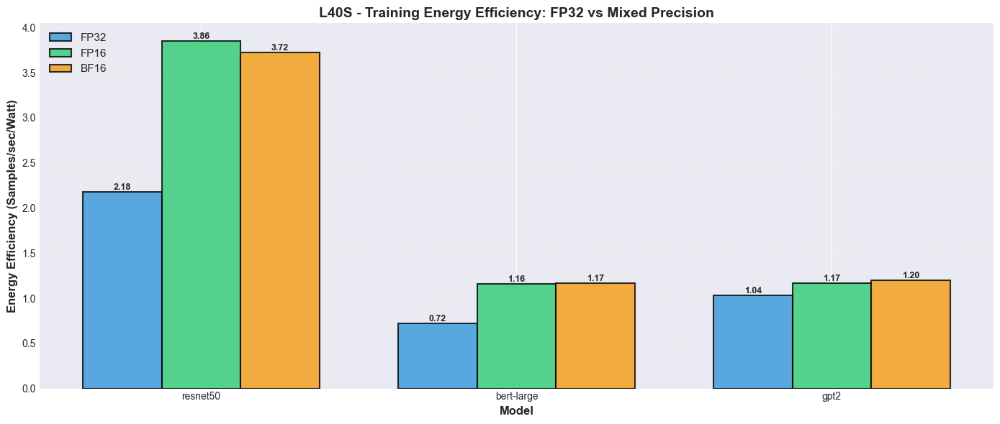

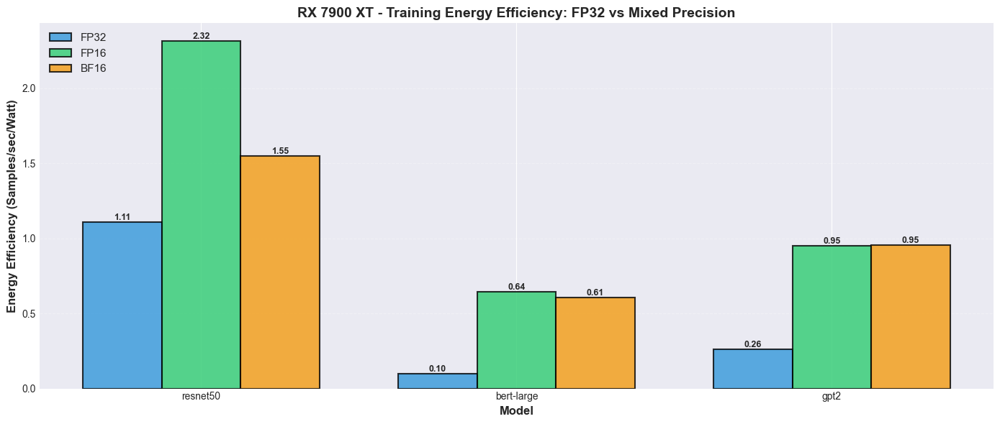

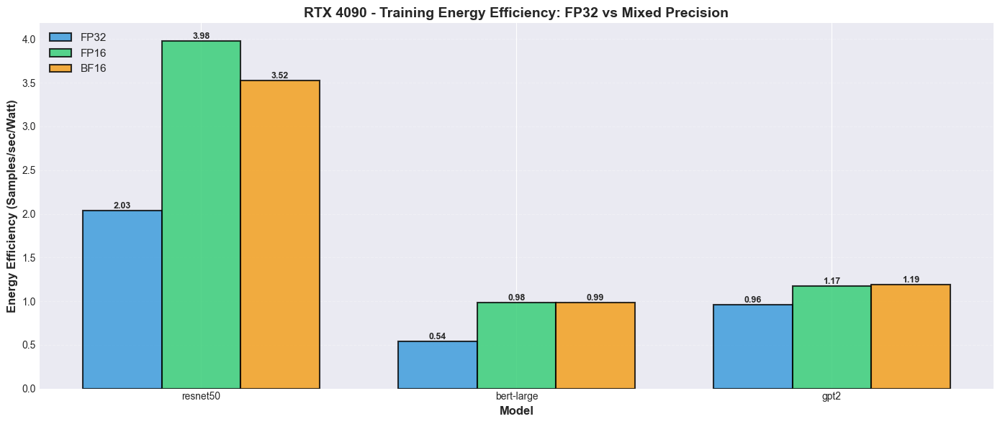

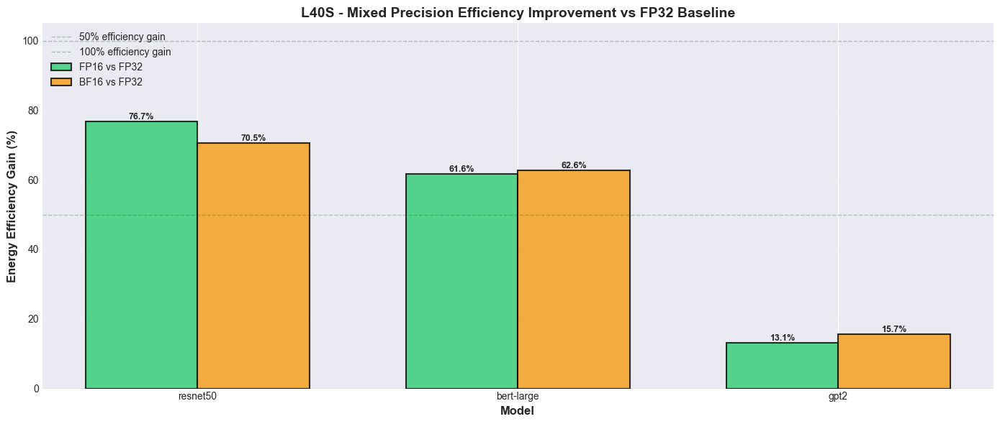

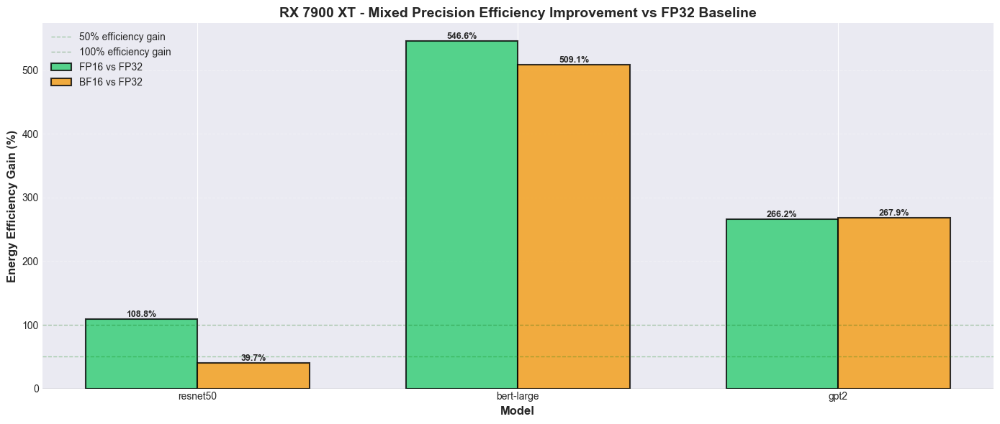

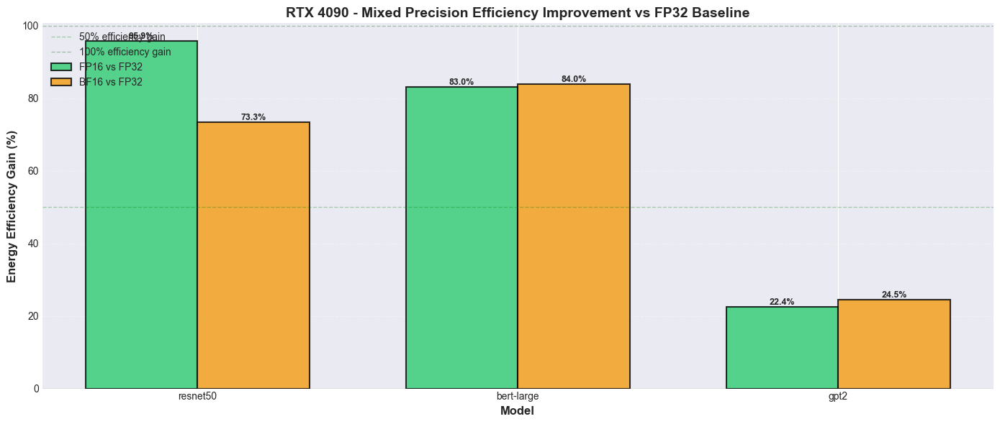

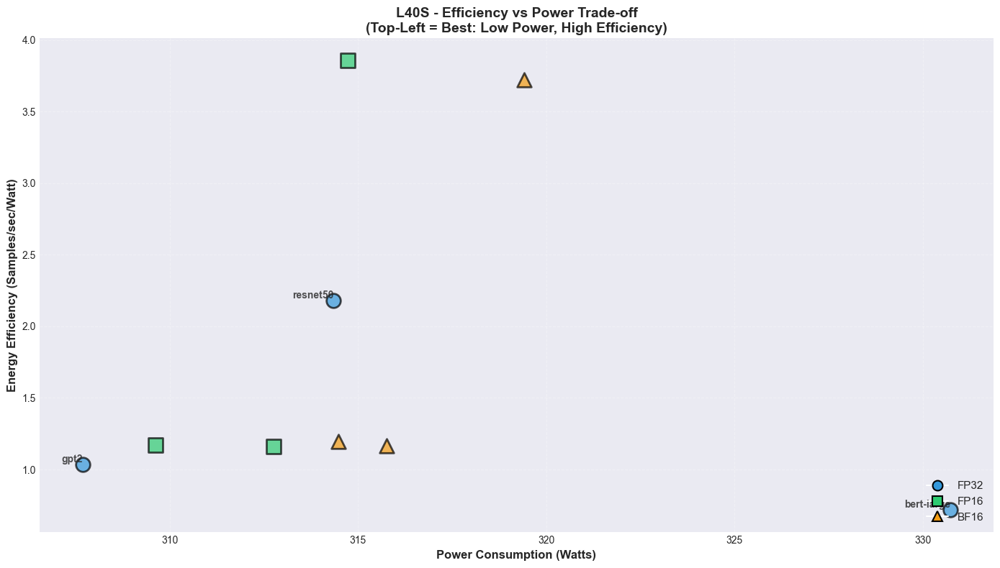

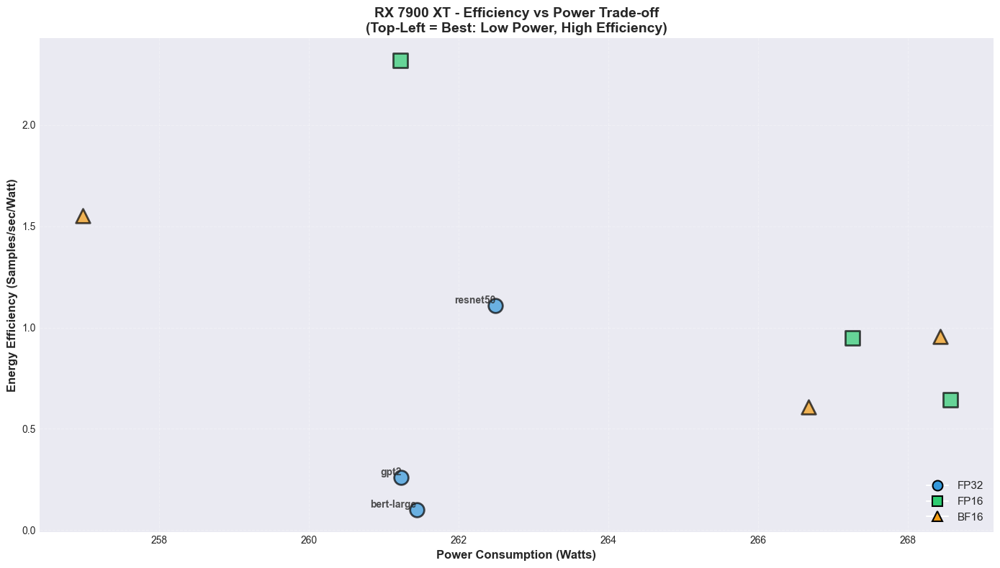

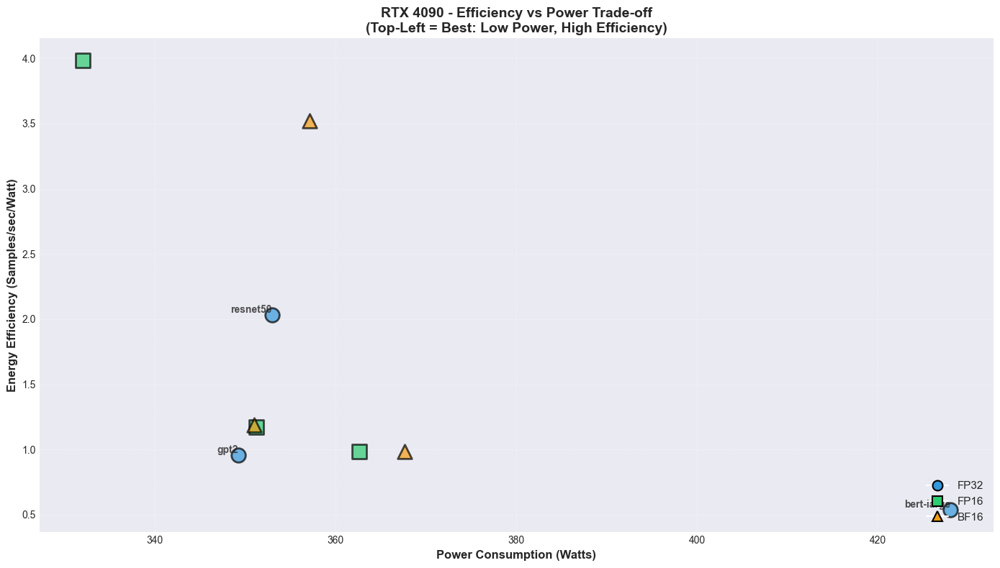

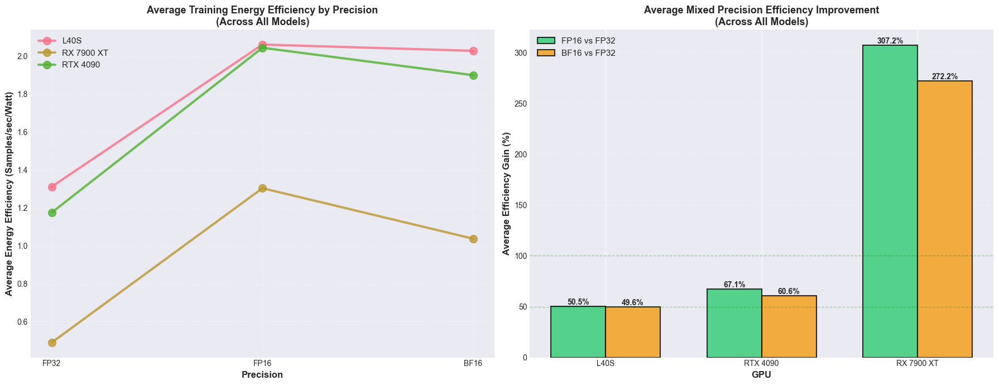


KEY FINDINGS:

✓ Best FP16 Efficiency Gain:
  RX 7900 XT - bert-large: +546.6%
  (0.10 → 0.64 samples/sec/watt)

✓ Best BF16 Efficiency Gain:
  RX 7900 XT - bert-large: +509.1%
  (0.10 → 0.61 samples/sec/watt)

✓ FP16 vs BF16 Efficiency Comparison:
  FP16 more efficient in 4/9 configurations
  BF16 more efficient in 5/9 configurations

✓ GPU-Specific Mixed Precision Efficiency:
  L40S:
    - Average FP16 efficiency gain: 50.5% (power change: -1.6%)
    - Average BF16 efficiency gain: 49.6% (power change: -0.2%)
  RX 7900 XT:
    - Average FP16 efficiency gain: 307.2% (power change: +1.5%)
    - Average BF16 efficiency gain: 272.2% (power change: +0.9%)
  RTX 4090:
    - Average FP16 efficiency gain: 67.1% (power change: -6.9%)
    - Average BF16 efficiency gain: 60.6% (power change: -4.1%)

✓ Efficiency vs Throughput Trade-off:
  Mixed precision provides BOTH higher throughput AND better efficiency:
  • FP16/BF16 compute faster (more samples/sec)
  • Power consumption remains similar 

In [ ]:
from matplotlib.lines import Line2D

# Efficiency Comparison: FP32 vs Mixed Precision (FP16 & BF16) for Training

print("=" * 80)
print("TRAINING EFFICIENCY COMPARISON: FP32 vs Mixed Precision")
print("=" * 80)

# Calculate efficiency improvements over FP32
efficiency_comparison_data = []

for gpu in train_df['gpu_short_name'].unique():
    for model in train_df['model'].unique():
        # Get FP32 baseline efficiency
        fp32_efficiency = train_df[
            (train_df['gpu_short_name'] == gpu) & 
            (train_df['model'] == model) & 
            (train_df['precision'] == 'fp32')
        ]['throughput_efficiency'].mean()
        
        if np.isnan(fp32_efficiency):
            continue
        
        # Get FP32 power
        fp32_power = train_df[
            (train_df['gpu_short_name'] == gpu) & 
            (train_df['model'] == model) & 
            (train_df['precision'] == 'fp32')
        ]['power_watts'].mean()
        
        # Get FP16 efficiency and power
        fp16_efficiency = train_df[
            (train_df['gpu_short_name'] == gpu) & 
            (train_df['model'] == model) & 
            (train_df['precision'] == 'fp16')
        ]['throughput_efficiency'].mean()
        
        fp16_power = train_df[
            (train_df['gpu_short_name'] == gpu) & 
            (train_df['model'] == model) & 
            (train_df['precision'] == 'fp16')
        ]['power_watts'].mean()
        
        # Get BF16 efficiency and power
        bf16_efficiency = train_df[
            (train_df['gpu_short_name'] == gpu) & 
            (train_df['model'] == model) & 
            (train_df['precision'] == 'bf16')
        ]['throughput_efficiency'].mean()
        
        bf16_power = train_df[
            (train_df['gpu_short_name'] == gpu) & 
            (train_df['model'] == model) & 
            (train_df['precision'] == 'bf16')
        ]['power_watts'].mean()
        
        efficiency_comparison_data.append({
            'gpu': gpu,
            'model': model,
            'fp32_efficiency': fp32_efficiency,
            'fp32_power': fp32_power,
            'fp16_efficiency': fp16_efficiency if not np.isnan(fp16_efficiency) else 0,
            'fp16_power': fp16_power if not np.isnan(fp16_power) else 0,
            'bf16_efficiency': bf16_efficiency if not np.isnan(bf16_efficiency) else 0,
            'bf16_power': bf16_power if not np.isnan(bf16_power) else 0,
            'fp16_efficiency_gain_pct': ((fp16_efficiency - fp32_efficiency) / fp32_efficiency * 100) if not np.isnan(fp16_efficiency) else 0,
            'bf16_efficiency_gain_pct': ((bf16_efficiency - fp32_efficiency) / fp32_efficiency * 100) if not np.isnan(bf16_efficiency) else 0,
            'fp16_power_change_pct': ((fp16_power - fp32_power) / fp32_power * 100) if not np.isnan(fp16_power) else 0,
            'bf16_power_change_pct': ((bf16_power - fp32_power) / fp32_power * 100) if not np.isnan(bf16_power) else 0
        })

efficiency_comparison_df = pd.DataFrame(efficiency_comparison_data)

print("\n=== Efficiency Comparison Summary (Samples/sec/Watt) ===")
print(efficiency_comparison_df[['gpu', 'model', 'fp32_efficiency', 'fp16_efficiency', 'bf16_efficiency', 
                                 'fp16_efficiency_gain_pct', 'bf16_efficiency_gain_pct']].to_string(index=False))

print("\n=== Average Efficiency Gains by GPU ===")
avg_efficiency_gains = efficiency_comparison_df.groupby('gpu')[['fp16_efficiency_gain_pct', 'bf16_efficiency_gain_pct']].mean()
print(avg_efficiency_gains)

print("\n=== Power Consumption Changes ===")
print(efficiency_comparison_df[['gpu', 'model', 'fp32_power', 'fp16_power', 'bf16_power',
                                 'fp16_power_change_pct', 'bf16_power_change_pct']].to_string(index=False))

# Visualization 1: Grouped Bar Chart - Absolute Efficiency
# Visualization 1: Grouped Bar Chart - Absolute Efficiency (separate images per GPU)
for gpu in efficiency_comparison_df['gpu'].unique():
    fig, ax = plt.subplots(1, 1, figsize=(14, 6))
    
    gpu_data = efficiency_comparison_df[efficiency_comparison_df['gpu'] == gpu]
    
    models = gpu_data['model'].values
    x = np.arange(len(models))
    width = 0.25
    
    # Plot bars for each precision
    bars1 = ax.bar(x - width, gpu_data['fp32_efficiency'], width, 
                   label='FP32', color='#3498db', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars2 = ax.bar(x, gpu_data['fp16_efficiency'], width, 
                   label='FP16', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars3 = ax.bar(x + width, gpu_data['bf16_efficiency'], width, 
                   label='BF16', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    # Add value labels on bars
    for bars in [bars1, bars2, bars3]:
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.2f}',
                       ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    ax.set_xlabel('Model', fontsize=12, fontweight='bold')
    ax.set_ylabel('Energy Efficiency (Samples/sec/Watt)', fontsize=12, fontweight='bold')
    ax.set_title(f'{gpu} - Training Energy Efficiency: FP32 vs Mixed Precision', 
                fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(models)
    ax.legend(fontsize=11, loc='upper left')
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.set_ylim(bottom=0)
    
    plt.tight_layout()
    plt.savefig(f'imgs/training_efficiency_comparison_absolute_{gpu.replace(" ", "_")}.png', dpi=300, bbox_inches='tight')
    plt.show()

# Visualization 2: Percentage Efficiency Gain Chart
# Visualization 2: Percentage Efficiency Gain Chart (separate images per GPU)
for gpu in efficiency_comparison_df['gpu'].unique():
    fig, ax = plt.subplots(1, 1, figsize=(14, 6))
    
    gpu_data = efficiency_comparison_df[efficiency_comparison_df['gpu'] == gpu]
    
    models = gpu_data['model'].values
    x = np.arange(len(models))
    width = 0.35
    
    # Plot efficiency gain bars
    bars1 = ax.bar(x - width/2, gpu_data['fp16_efficiency_gain_pct'], width, 
                   label='FP16 vs FP32', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars2 = ax.bar(x + width/2, gpu_data['bf16_efficiency_gain_pct'], width, 
                   label='BF16 vs FP32', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    # Add value labels
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.1f}%',
                   ha='center', va='bottom' if height > 0 else 'top', 
                   fontsize=9, fontweight='bold')
    
    # Add reference lines
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
    ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3, label='50% efficiency gain')
    ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3, label='100% efficiency gain')
    
    ax.set_xlabel('Model', fontsize=12, fontweight='bold')
    ax.set_ylabel('Energy Efficiency Gain (%)', fontsize=12, fontweight='bold')
    ax.set_title(f'{gpu} - Mixed Precision Efficiency Improvement vs FP32 Baseline', 
                fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(models)
    ax.legend(fontsize=10, loc='upper left')
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.savefig(f'imgs/training_efficiency_comparison_improvement_{gpu.replace(" ", "_")}.png', dpi=300, bbox_inches='tight')
    plt.show()

# Visualization 3: Efficiency vs Power Trade-off (Scatter Plot)
# Visualization 3: Efficiency vs Power Trade-off (Scatter Plot) - separate images per GPU
for gpu in efficiency_comparison_df['gpu'].unique():
    fig, ax = plt.subplots(1, 1, figsize=(14, 8))
    
    gpu_data = efficiency_comparison_df[efficiency_comparison_df['gpu'] == gpu]
    
    # Plot FP32, FP16, BF16 as separate scatter points
    for idx, model in enumerate(gpu_data['model'].unique()):
        model_data = gpu_data[gpu_data['model'] == model]
        
        # FP32
        ax.scatter(model_data['fp32_power'], model_data['fp32_efficiency'],
                  s=200, marker='o', color='#3498db', edgecolors='black', linewidth=2,
                  alpha=0.7)
        
        # FP16
        if model_data['fp16_efficiency'].values[0] > 0:
            ax.scatter(model_data['fp16_power'], model_data['fp16_efficiency'],
                      s=200, marker='s', color='#2ecc71', edgecolors='black', linewidth=2,
                      alpha=0.7)
        
        # BF16
        if model_data['bf16_efficiency'].values[0] > 0:
            ax.scatter(model_data['bf16_power'], model_data['bf16_efficiency'],
                      s=200, marker='^', color='#f39c12', edgecolors='black', linewidth=2,
                      alpha=0.7)
        
        # Add model labels
        ax.annotate(model, 
                   (model_data['fp32_power'].values[0], model_data['fp32_efficiency'].values[0]),
                   fontsize=10, ha='right', va='bottom', alpha=0.8, fontweight='bold')
    
    ax.set_xlabel('Power Consumption (Watts)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Energy Efficiency (Samples/sec/Watt)', fontsize=12, fontweight='bold')
    ax.set_title(f'{gpu} - Efficiency vs Power Trade-off\n(Top-Left = Best: Low Power, High Efficiency)', 
                fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--')
    
    # Add legend with custom labels
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='#3498db', 
               markersize=10, label='FP32', markeredgecolor='black', markeredgewidth=1.5),
        Line2D([0], [0], marker='s', color='w', markerfacecolor='#2ecc71', 
               markersize=10, label='FP16', markeredgecolor='black', markeredgewidth=1.5),
        Line2D([0], [0], marker='^', color='w', markerfacecolor='#f39c12', 
               markersize=10, label='BF16', markeredgecolor='black', markeredgewidth=1.5)
    ]
    ax.legend(handles=legend_elements, fontsize=11, loc='lower right')
    
    plt.tight_layout()
    plt.savefig(f'imgs/training_efficiency_vs_power_tradeoff_{gpu.replace(" ", "_")}.png', dpi=300, bbox_inches='tight')
    plt.show()

# Visualization 4: Summary comparison across all GPUs
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

# Left plot: Average efficiency by precision
for gpu in efficiency_comparison_df['gpu'].unique():
    gpu_data = efficiency_comparison_df[efficiency_comparison_df['gpu'] == gpu]
    precisions = ['fp32_efficiency', 'fp16_efficiency', 'bf16_efficiency']
    avg_efficiencies = [gpu_data[p].mean() for p in precisions]
    
    x_pos = np.arange(len(precisions))
    ax1.plot(x_pos, avg_efficiencies, marker='o', linewidth=3, markersize=10, 
            label=gpu, alpha=0.8)

ax1.set_xticks(x_pos)
ax1.set_xticklabels(['FP32', 'FP16', 'BF16'])
ax1.set_ylabel('Average Energy Efficiency (Samples/sec/Watt)', fontsize=12, fontweight='bold')
ax1.set_xlabel('Precision', fontsize=12, fontweight='bold')
ax1.set_title('Average Training Energy Efficiency by Precision\n(Across All Models)', 
             fontsize=13, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(True, alpha=0.3, linestyle='--')

# Right plot: Average efficiency improvement
gpu_efficiency_improvements = efficiency_comparison_df.groupby('gpu')[['fp16_efficiency_gain_pct', 'bf16_efficiency_gain_pct']].mean()
x_pos = np.arange(len(gpu_efficiency_improvements))
width = 0.35

bars1 = ax2.bar(x_pos - width/2, gpu_efficiency_improvements['fp16_efficiency_gain_pct'], width,
               label='FP16 vs FP32', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
bars2 = ax2.bar(x_pos + width/2, gpu_efficiency_improvements['bf16_efficiency_gain_pct'], width,
               label='BF16 vs FP32', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)

# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.1f}%',
               ha='center', va='bottom', fontsize=10, fontweight='bold')

ax2.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3)
ax2.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3)
ax2.set_xticks(x_pos)
ax2.set_xticklabels(gpu_efficiency_improvements.index)
ax2.set_ylabel('Average Efficiency Gain (%)', fontsize=12, fontweight='bold')
ax2.set_xlabel('GPU', fontsize=12, fontweight='bold')
ax2.set_title('Average Mixed Precision Efficiency Improvement\n(Across All Models)', 
             fontsize=13, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
plt.savefig('imgs/training_efficiency_comparison_summary.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "=" * 80)
print("KEY FINDINGS:")
print("=" * 80)

# Identify best efficiency performers
best_fp16_eff = efficiency_comparison_df.loc[efficiency_comparison_df['fp16_efficiency_gain_pct'].idxmax()]
best_bf16_eff = efficiency_comparison_df.loc[efficiency_comparison_df['bf16_efficiency_gain_pct'].idxmax()]

print(f"\n✓ Best FP16 Efficiency Gain:")
print(f"  {best_fp16_eff['gpu']} - {best_fp16_eff['model']}: +{best_fp16_eff['fp16_efficiency_gain_pct']:.1f}%")
print(f"  ({best_fp16_eff['fp32_efficiency']:.2f} → {best_fp16_eff['fp16_efficiency']:.2f} samples/sec/watt)")

print(f"\n✓ Best BF16 Efficiency Gain:")
print(f"  {best_bf16_eff['gpu']} - {best_bf16_eff['model']}: +{best_bf16_eff['bf16_efficiency_gain_pct']:.1f}%")
print(f"  ({best_bf16_eff['fp32_efficiency']:.2f} → {best_bf16_eff['bf16_efficiency']:.2f} samples/sec/watt)")

# Compare FP16 vs BF16 efficiency
print("\n✓ FP16 vs BF16 Efficiency Comparison:")
fp16_better_eff_count = (efficiency_comparison_df['fp16_efficiency_gain_pct'] > efficiency_comparison_df['bf16_efficiency_gain_pct']).sum()
bf16_better_eff_count = (efficiency_comparison_df['bf16_efficiency_gain_pct'] > efficiency_comparison_df['fp16_efficiency_gain_pct']).sum()
print(f"  FP16 more efficient in {fp16_better_eff_count}/{len(efficiency_comparison_df)} configurations")
print(f"  BF16 more efficient in {bf16_better_eff_count}/{len(efficiency_comparison_df)} configurations")

# GPU-specific insights
print("\n✓ GPU-Specific Mixed Precision Efficiency:")
for gpu in efficiency_comparison_df['gpu'].unique():
    gpu_avg = efficiency_comparison_df[efficiency_comparison_df['gpu'] == gpu][['fp16_efficiency_gain_pct', 'bf16_efficiency_gain_pct']].mean()
    gpu_power_avg = efficiency_comparison_df[efficiency_comparison_df['gpu'] == gpu][['fp16_power_change_pct', 'bf16_power_change_pct']].mean()
    print(f"  {gpu}:")
    print(f"    - Average FP16 efficiency gain: {gpu_avg['fp16_efficiency_gain_pct']:.1f}% (power change: {gpu_power_avg['fp16_power_change_pct']:+.1f}%)")
    print(f"    - Average BF16 efficiency gain: {gpu_avg['bf16_efficiency_gain_pct']:.1f}% (power change: {gpu_power_avg['bf16_power_change_pct']:+.1f}%)")

# Analyze efficiency vs throughput trade-off
print("\n✓ Efficiency vs Throughput Trade-off:")
print("  Mixed precision provides BOTH higher throughput AND better efficiency:")
print("  • FP16/BF16 compute faster (more samples/sec)")
print("  • Power consumption remains similar or slightly increases")
print("  • Net result: Significantly better samples/sec/watt")
print("  • This makes mixed precision a clear win for Green AI initiatives")

print("\n" + "=" * 80)

COMPREHENSIVE GPU COMPARISON: Performance, Efficiency, and Mixed Precision Gains

1. ABSOLUTE PERFORMANCE COMPARISON (Training)

=== Average Throughput by GPU and Precision ===

L40S:
  FP16: 646.17 ± 401.10 samples/sec
  BF16: 635.71 ± 381.85 samples/sec
  FP32: 413.65 ± 195.81 samples/sec

RTX 4090:
  FP16: 695.36 ± 443.30 samples/sec
  BF16: 679.66 ± 409.81 samples/sec
  FP32: 427.05 ± 209.82 samples/sec

RX 7900 XT:
  FP16: 342.20 ± 186.12 samples/sec
  BF16: 270.05 ± 95.20 samples/sec
  FP32: 158.04 ± 117.00 samples/sec

=== Overall GPU Ranking (Average across all configs) ===
  1. RTX 4090: 600.80 samples/sec
  2. L40S: 565.95 samples/sec
  3. RX 7900 XT: 265.47 samples/sec

2. ENERGY EFFICIENCY COMPARISON (Training)

=== Average Energy Efficiency by GPU and Precision (Samples/sec/Watt) ===

L40S:
  FP16: 2.062 ± 1.268 samples/sec/watt (Power: 312.4W)
  BF16: 2.001 ± 1.188 samples/sec/watt (Power: 316.5W)
  FP32: 1.312 ± 0.631 samples/sec/watt (Power: 317.6W)

RTX 4090:
  FP16: 2

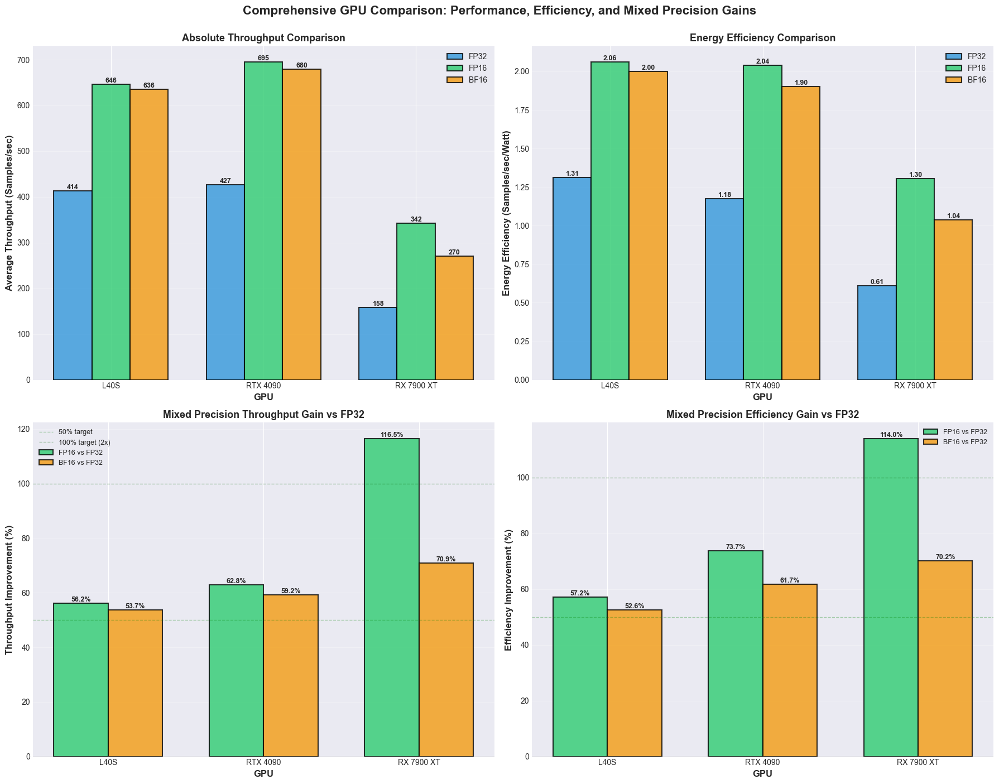


4. COMPREHENSIVE SUMMARY TABLE

       GPU FP32 Throughput FP16 Gain BF16 Gain FP32 Efficiency FP16 Eff Gain BF16 Eff Gain Avg Power
      L40S           413.6    +56.2%    +53.7%            1.31        +57.2%        +52.6%    317.6W
  RTX 4090           427.1    +62.8%    +59.2%            1.18        +73.7%        +61.7%    376.7W
RX 7900 XT           158.0   +116.5%    +70.9%            0.61       +114.0%        +70.2%    261.8W

5. KEY INSIGHTS AND CONCLUSIONS

✓ Absolute Performance Winner:
  RTX 4090: 600.8 samples/sec (average across all configurations)

✓ Energy Efficiency Winner:
  L40S: 1.794 samples/sec/watt (best performance per watt)

✓ Best Mixed Precision Adopter (Throughput Gain):
  FP16: RX 7900 XT with 116.5% improvement
  BF16: RX 7900 XT with 70.9% improvement

✓ Best Mixed Precision Adopter (Efficiency Gain):
  FP16: RX 7900 XT with 114.0% efficiency improvement
  BF16: RX 7900 XT with 70.2% efficiency improvement

✓ GPU Characterization:

  L40S:
    - Average th

In [ ]:
# Comprehensive GPU Performance and Efficiency Comparison Analysis

print("=" * 100)
print("COMPREHENSIVE GPU COMPARISON: Performance, Efficiency, and Mixed Precision Gains")
print("=" * 100)

# ========================================
# 1. ABSOLUTE PERFORMANCE COMPARISON
# ========================================
print("\n" + "=" * 100)
print("1. ABSOLUTE PERFORMANCE COMPARISON (Training)")
print("=" * 100)

# Calculate average throughput per GPU across all models and precisions
gpu_performance = train_df.groupby(['gpu_short_name', 'precision']).agg({
    'samples_per_sec': ['mean', 'std'],
    'model': 'count'
}).reset_index()
gpu_performance.columns = ['gpu_short_name', 'precision', 'avg_throughput', 'std_throughput', 'num_configs']

print("\n=== Average Throughput by GPU and Precision ===")
for gpu in gpu_performance['gpu_short_name'].unique():
    print(f"\n{gpu}:")
    gpu_data = gpu_performance[gpu_performance['gpu_short_name'] == gpu].sort_values('avg_throughput', ascending=False)
    for _, row in gpu_data.iterrows():
        print(f"  {row['precision'].upper()}: {row['avg_throughput']:.2f} ± {row['std_throughput']:.2f} samples/sec")

# Overall GPU ranking by average throughput
overall_ranking = train_df.groupby('gpu_short_name')['samples_per_sec'].mean().sort_values(ascending=False)
print("\n=== Overall GPU Ranking (Average across all configs) ===")
for rank, (gpu, throughput) in enumerate(overall_ranking.items(), 1):
    print(f"  {rank}. {gpu}: {throughput:.2f} samples/sec")

# ========================================
# 2. ENERGY EFFICIENCY COMPARISON
# ========================================
print("\n" + "=" * 100)
print("2. ENERGY EFFICIENCY COMPARISON (Training)")
print("=" * 100)

# Calculate average efficiency per GPU
gpu_efficiency = train_df.groupby(['gpu_short_name', 'precision']).agg({
    'throughput_efficiency': ['mean', 'std'],
    'power_watts': 'mean'
}).reset_index()
gpu_efficiency.columns = ['gpu_short_name', 'precision', 'avg_efficiency', 'std_efficiency', 'avg_power']

print("\n=== Average Energy Efficiency by GPU and Precision (Samples/sec/Watt) ===")
for gpu in gpu_efficiency['gpu_short_name'].unique():
    print(f"\n{gpu}:")
    gpu_data = gpu_efficiency[gpu_efficiency['gpu_short_name'] == gpu].sort_values('avg_efficiency', ascending=False)
    for _, row in gpu_data.iterrows():
        print(f"  {row['precision'].upper()}: {row['avg_efficiency']:.3f} ± {row['std_efficiency']:.3f} samples/sec/watt (Power: {row['avg_power']:.1f}W)")

# Overall GPU efficiency ranking
overall_efficiency = train_df.groupby('gpu_short_name')['throughput_efficiency'].mean().sort_values(ascending=False)
print("\n=== Overall GPU Efficiency Ranking (Average across all configs) ===")
for rank, (gpu, efficiency) in enumerate(overall_efficiency.items(), 1):
    avg_power = train_df[train_df['gpu_short_name'] == gpu]['power_watts'].mean()
    print(f"  {rank}. {gpu}: {efficiency:.3f} samples/sec/watt (Avg Power: {avg_power:.1f}W)")

# ========================================
# 3. MIXED PRECISION IMPROVEMENT ANALYSIS
# ========================================
print("\n" + "=" * 100)
print("3. MIXED PRECISION IMPROVEMENT ANALYSIS (FP32 → FP16/BF16)")
print("=" * 100)

# Calculate improvement percentages per GPU
gpu_improvements = []

for gpu in train_df['gpu_short_name'].unique():
    gpu_data = train_df[train_df['gpu_short_name'] == gpu]
    
    # Get FP32 baseline
    fp32_throughput = gpu_data[gpu_data['precision'] == 'fp32']['samples_per_sec'].mean()
    fp32_efficiency = gpu_data[gpu_data['precision'] == 'fp32']['throughput_efficiency'].mean()
    fp32_power = gpu_data[gpu_data['precision'] == 'fp32']['power_watts'].mean()
    
    for precision in ['fp16', 'bf16']:
        mixed_data = gpu_data[gpu_data['precision'] == precision]
        
        if len(mixed_data) > 0:
            mixed_throughput = mixed_data['samples_per_sec'].mean()
            mixed_efficiency = mixed_data['throughput_efficiency'].mean()
            mixed_power = mixed_data['power_watts'].mean()
            
            throughput_improvement = ((mixed_throughput - fp32_throughput) / fp32_throughput) * 100
            efficiency_improvement = ((mixed_efficiency - fp32_efficiency) / fp32_efficiency) * 100
            power_change = ((mixed_power - fp32_power) / fp32_power) * 100
            
            gpu_improvements.append({
                'gpu': gpu,
                'precision': precision,
                'fp32_throughput': fp32_throughput,
                'mixed_throughput': mixed_throughput,
                'throughput_improvement_pct': throughput_improvement,
                'fp32_efficiency': fp32_efficiency,
                'mixed_efficiency': mixed_efficiency,
                'efficiency_improvement_pct': efficiency_improvement,
                'fp32_power': fp32_power,
                'mixed_power': mixed_power,
                'power_change_pct': power_change
            })

gpu_improvements_df = pd.DataFrame(gpu_improvements)

print("\n=== Throughput Improvement: FP32 → Mixed Precision ===")
for gpu in gpu_improvements_df['gpu'].unique():
    print(f"\n{gpu}:")
    gpu_imp = gpu_improvements_df[gpu_improvements_df['gpu'] == gpu]
    for _, row in gpu_imp.iterrows():
        print(f"  {row['precision'].upper()}: {row['fp32_throughput']:.1f} → {row['mixed_throughput']:.1f} samples/sec "
              f"({row['throughput_improvement_pct']:+.1f}%)")

print("\n=== Energy Efficiency Improvement: FP32 → Mixed Precision ===")
for gpu in gpu_improvements_df['gpu'].unique():
    print(f"\n{gpu}:")
    gpu_imp = gpu_improvements_df[gpu_improvements_df['gpu'] == gpu]
    for _, row in gpu_imp.iterrows():
        print(f"  {row['precision'].upper()}: {row['fp32_efficiency']:.3f} → {row['mixed_efficiency']:.3f} samples/sec/watt "
              f"({row['efficiency_improvement_pct']:+.1f}%)")

print("\n=== Power Consumption Change: FP32 → Mixed Precision ===")
for gpu in gpu_improvements_df['gpu'].unique():
    print(f"\n{gpu}:")
    gpu_imp = gpu_improvements_df[gpu_improvements_df['gpu'] == gpu]
    for _, row in gpu_imp.iterrows():
        print(f"  {row['precision'].upper()}: {row['fp32_power']:.1f}W → {row['mixed_power']:.1f}W "
              f"({row['power_change_pct']:+.1f}%)")

# ========================================
# 4. VISUALIZATION: COMPREHENSIVE COMPARISON
# ========================================

# Plot 1: Throughput Comparison
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Subplot 1: Absolute Throughput by GPU
ax = axes[0, 0]
gpus = gpu_performance['gpu_short_name'].unique()
x = np.arange(len(gpus))
width = 0.25

for idx, precision in enumerate(['fp32', 'fp16', 'bf16']):
    throughputs = []
    for gpu in gpus:
        val = gpu_performance[(gpu_performance['gpu_short_name'] == gpu) & 
                             (gpu_performance['precision'] == precision)]['avg_throughput']
        throughputs.append(val.values[0] if len(val) > 0 else 0)
    
    color_map = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
    offset = width * (idx - 1)
    bars = ax.bar(x + offset, throughputs, width, label=precision.upper(), 
                  color=color_map[precision], alpha=0.8, edgecolor='black', linewidth=1.5)
    
    for bar in bars:
        height = bar.get_height()
        if height > 0:
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.0f}',
                   ha='center', va='bottom', fontsize=9, fontweight='bold')

ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
ax.set_ylabel('Average Throughput (Samples/sec)', fontsize=12, fontweight='bold')
ax.set_title('Absolute Throughput Comparison', fontsize=13, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(gpus)
ax.legend(fontsize=10)
ax.grid(axis='y', alpha=0.3)
ax.set_ylim(bottom=0)

# Subplot 2: Energy Efficiency by GPU
ax = axes[0, 1]
for idx, precision in enumerate(['fp32', 'fp16', 'bf16']):
    efficiencies = []
    for gpu in gpus:
        val = gpu_efficiency[(gpu_efficiency['gpu_short_name'] == gpu) & 
                            (gpu_efficiency['precision'] == precision)]['avg_efficiency']
        efficiencies.append(val.values[0] if len(val) > 0 else 0)
    
    color_map = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
    offset = width * (idx - 1)
    bars = ax.bar(x + offset, efficiencies, width, label=precision.upper(),
                  color=color_map[precision], alpha=0.8, edgecolor='black', linewidth=1.5)
    
    for bar in bars:
        height = bar.get_height()
        if height > 0:
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.2f}',
                   ha='center', va='bottom', fontsize=9, fontweight='bold')

ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
ax.set_ylabel('Energy Efficiency (Samples/sec/Watt)', fontsize=12, fontweight='bold')
ax.set_title('Energy Efficiency Comparison', fontsize=13, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(gpus)
ax.legend(fontsize=10)
ax.grid(axis='y', alpha=0.3)
ax.set_ylim(bottom=0)

# Subplot 3: Throughput Improvement (FP32 → Mixed Precision)
ax = axes[1, 0]
width_imp = 0.35

fp16_improvements = []
bf16_improvements = []
for gpu in gpus:
    fp16_val = gpu_improvements_df[(gpu_improvements_df['gpu'] == gpu) & 
                                   (gpu_improvements_df['precision'] == 'fp16')]['throughput_improvement_pct']
    bf16_val = gpu_improvements_df[(gpu_improvements_df['gpu'] == gpu) & 
                                   (gpu_improvements_df['precision'] == 'bf16')]['throughput_improvement_pct']
    
    fp16_improvements.append(fp16_val.values[0] if len(fp16_val) > 0 else 0)
    bf16_improvements.append(bf16_val.values[0] if len(bf16_val) > 0 else 0)

bars1 = ax.bar(x - width_imp/2, fp16_improvements, width_imp, label='FP16 vs FP32',
               color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
bars2 = ax.bar(x + width_imp/2, bf16_improvements, width_imp, label='BF16 vs FP32',
               color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.1f}%',
               ha='center', va='bottom' if height > 0 else 'top',
               fontsize=9, fontweight='bold')

ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3, label='50% target')
ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3, label='100% target (2x)')
ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
ax.set_ylabel('Throughput Improvement (%)', fontsize=12, fontweight='bold')
ax.set_title('Mixed Precision Throughput Gain vs FP32', fontsize=13, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(gpus)
ax.legend(fontsize=9)
ax.grid(axis='y', alpha=0.3)

# Subplot 4: Efficiency Improvement (FP32 → Mixed Precision)
ax = axes[1, 1]

fp16_eff_improvements = []
bf16_eff_improvements = []
for gpu in gpus:
    fp16_val = gpu_improvements_df[(gpu_improvements_df['gpu'] == gpu) & 
                                   (gpu_improvements_df['precision'] == 'fp16')]['efficiency_improvement_pct']
    bf16_val = gpu_improvements_df[(gpu_improvements_df['gpu'] == gpu) & 
                                   (gpu_improvements_df['precision'] == 'bf16')]['efficiency_improvement_pct']
    
    fp16_eff_improvements.append(fp16_val.values[0] if len(fp16_val) > 0 else 0)
    bf16_eff_improvements.append(bf16_val.values[0] if len(bf16_val) > 0 else 0)

bars1 = ax.bar(x - width_imp/2, fp16_eff_improvements, width_imp, label='FP16 vs FP32',
               color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
bars2 = ax.bar(x + width_imp/2, bf16_eff_improvements, width_imp, label='BF16 vs FP32',
               color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.1f}%',
               ha='center', va='bottom' if height > 0 else 'top',
               fontsize=9, fontweight='bold')

ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3)
ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3)
ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
ax.set_ylabel('Efficiency Improvement (%)', fontsize=12, fontweight='bold')
ax.set_title('Mixed Precision Efficiency Gain vs FP32', fontsize=13, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(gpus)
ax.legend(fontsize=9)
ax.grid(axis='y', alpha=0.3)

plt.suptitle('Comprehensive GPU Comparison: Performance, Efficiency, and Mixed Precision Gains',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig('imgs/comprehensive_gpu_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# ========================================
# 5. SUMMARY TABLE AND KEY INSIGHTS
# ========================================
print("\n" + "=" * 100)
print("4. COMPREHENSIVE SUMMARY TABLE")
print("=" * 100)

summary_table = []
for gpu in gpus:
    gpu_data = train_df[train_df['gpu_short_name'] == gpu]
    
    # FP32 baseline
    fp32_throughput = gpu_data[gpu_data['precision'] == 'fp32']['samples_per_sec'].mean()
    fp32_efficiency = gpu_data[gpu_data['precision'] == 'fp32']['throughput_efficiency'].mean()
    fp32_power = gpu_data[gpu_data['precision'] == 'fp32']['power_watts'].mean()
    
    # FP16
    fp16_throughput = gpu_data[gpu_data['precision'] == 'fp16']['samples_per_sec'].mean()
    fp16_efficiency = gpu_data[gpu_data['precision'] == 'fp16']['throughput_efficiency'].mean()
    fp16_throughput_gain = ((fp16_throughput - fp32_throughput) / fp32_throughput) * 100
    fp16_efficiency_gain = ((fp16_efficiency - fp32_efficiency) / fp32_efficiency) * 100
    
    # BF16
    bf16_throughput = gpu_data[gpu_data['precision'] == 'bf16']['samples_per_sec'].mean()
    bf16_efficiency = gpu_data[gpu_data['precision'] == 'bf16']['throughput_efficiency'].mean()
    bf16_throughput_gain = ((bf16_throughput - fp32_throughput) / fp32_throughput) * 100
    bf16_efficiency_gain = ((bf16_efficiency - fp32_efficiency) / fp32_efficiency) * 100
    
    summary_table.append({
        'GPU': gpu,
        'FP32 Throughput': f'{fp32_throughput:.1f}',
        'FP16 Gain': f'{fp16_throughput_gain:+.1f}%',
        'BF16 Gain': f'{bf16_throughput_gain:+.1f}%',
        'FP32 Efficiency': f'{fp32_efficiency:.2f}',
        'FP16 Eff Gain': f'{fp16_efficiency_gain:+.1f}%',
        'BF16 Eff Gain': f'{bf16_efficiency_gain:+.1f}%',
        'Avg Power': f'{fp32_power:.1f}W'
    })

summary_df_comparison = pd.DataFrame(summary_table)
print("\n" + summary_df_comparison.to_string(index=False))

print("\n" + "=" * 100)
print("5. KEY INSIGHTS AND CONCLUSIONS")
print("=" * 100)

print("\n✓ Absolute Performance Winner:")
best_gpu = overall_ranking.index[0]
best_throughput = overall_ranking.iloc[0]
print(f"  {best_gpu}: {best_throughput:.1f} samples/sec (average across all configurations)")

print("\n✓ Energy Efficiency Winner:")
best_eff_gpu = overall_efficiency.index[0]
best_efficiency = overall_efficiency.iloc[0]
print(f"  {best_eff_gpu}: {best_efficiency:.3f} samples/sec/watt (best performance per watt)")

print("\n✓ Best Mixed Precision Adopter (Throughput Gain):")
best_fp16_gain = gpu_improvements_df.loc[gpu_improvements_df['throughput_improvement_pct'].idxmax()]
best_bf16_gain = gpu_improvements_df.loc[gpu_improvements_df[gpu_improvements_df['precision'] == 'bf16']['throughput_improvement_pct'].idxmax()]
print(f"  FP16: {best_fp16_gain['gpu']} with {best_fp16_gain['throughput_improvement_pct']:.1f}% improvement")
print(f"  BF16: {best_bf16_gain['gpu']} with {best_bf16_gain['throughput_improvement_pct']:.1f}% improvement")

print("\n✓ Best Mixed Precision Adopter (Efficiency Gain):")
best_fp16_eff_gain = gpu_improvements_df.loc[gpu_improvements_df['efficiency_improvement_pct'].idxmax()]
best_bf16_eff_gain = gpu_improvements_df.loc[gpu_improvements_df[gpu_improvements_df['precision'] == 'bf16']['efficiency_improvement_pct'].idxmax()]
print(f"  FP16: {best_fp16_eff_gain['gpu']} with {best_fp16_eff_gain['efficiency_improvement_pct']:.1f}% efficiency improvement")
print(f"  BF16: {best_bf16_eff_gain['gpu']} with {best_bf16_eff_gain['efficiency_improvement_pct']:.1f}% efficiency improvement")

print("\n✓ GPU Characterization:")
for gpu in gpus:
    gpu_imp = gpu_improvements_df[gpu_improvements_df['gpu'] == gpu]
    avg_throughput_gain = gpu_imp['throughput_improvement_pct'].mean()
    avg_efficiency_gain = gpu_imp['efficiency_improvement_pct'].mean()
    avg_power = train_df[train_df['gpu_short_name'] == gpu]['power_watts'].mean()
    
    print(f"\n  {gpu}:")
    print(f"    - Average throughput gain: {avg_throughput_gain:.1f}%")
    print(f"    - Average efficiency gain: {avg_efficiency_gain:.1f}%")
    print(f"    - Average power consumption: {avg_power:.1f}W")
    
    if avg_throughput_gain > 100:
        print(f"    → Excellent mixed precision acceleration (>2x speedup)")
    elif avg_throughput_gain > 50:
        print(f"    → Good mixed precision benefit (>1.5x speedup)")
    else:
        print(f"    → Moderate mixed precision benefit")
    
    if avg_efficiency_gain > 100:
        print(f"    → Outstanding energy efficiency improvement")
    elif avg_efficiency_gain > 50:
        print(f"    → Strong energy efficiency improvement")

print("\n" + "=" * 100)
print("ANALYSIS COMPLETE")
print("=" * 100)

PER-MODEL GPU COMPARISON: Performance, Efficiency, and Mixed Precision Gains

MODEL: RESNET50

----------------------------------------------------------------------------------------------------
1. ABSOLUTE THROUGHPUT PERFORMANCE (Samples/sec)
----------------------------------------------------------------------------------------------------

GPU             Precision        Avg Throughput              Std Dev
----------------------------------------------------------------------
L40S            FP16                    1213.28                 6.93
L40S            BF16                    1188.66                21.74
L40S            FP32                     685.91                23.45
----------------------------------------------------------------------
RTX 4090        FP16                    1322.30                34.34
RTX 4090        BF16                    1258.24                 4.64
RTX 4090        FP32                     717.58                 1.86
----------------------------

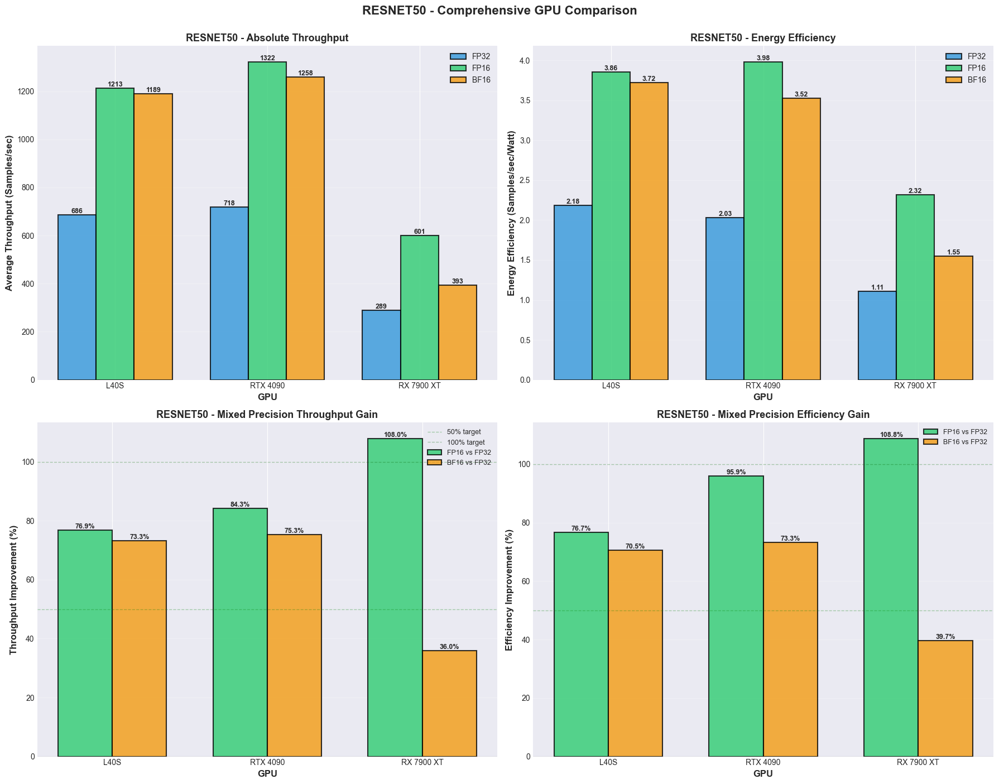


MODEL: BERT-LARGE

----------------------------------------------------------------------------------------------------
1. ABSOLUTE THROUGHPUT PERFORMANCE (Samples/sec)
----------------------------------------------------------------------------------------------------

GPU             Precision        Avg Throughput              Std Dev
----------------------------------------------------------------------
L40S            BF16                     368.61                 0.59
L40S            FP16                     362.85                 0.67
L40S            FP32                     237.24                 0.41
----------------------------------------------------------------------
RTX 4090        BF16                     362.99                 0.49
RTX 4090        FP16                     356.14                 4.94
RTX 4090        FP32                     229.72                 0.23
----------------------------------------------------------------------
RX 7900 XT      FP16            

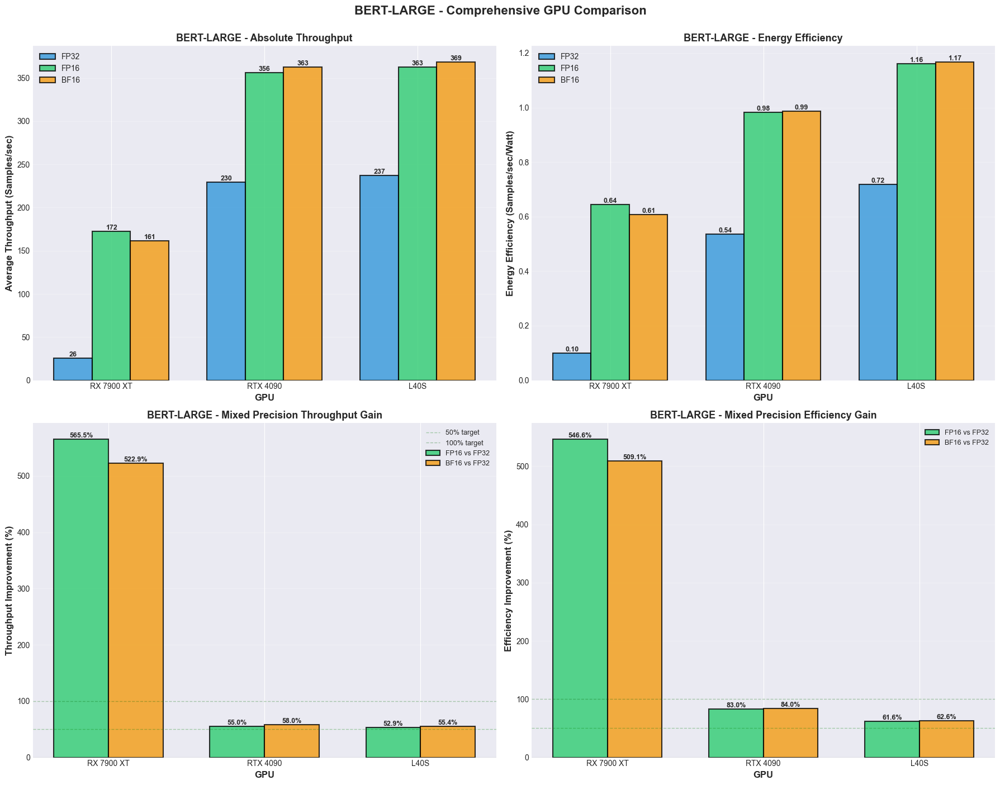


MODEL: GPT2

----------------------------------------------------------------------------------------------------
1. ABSOLUTE THROUGHPUT PERFORMANCE (Samples/sec)
----------------------------------------------------------------------------------------------------

GPU             Precision        Avg Throughput              Std Dev
----------------------------------------------------------------------
L40S            BF16                     376.57                 3.61
L40S            FP16                     362.38                 2.62
L40S            FP32                     317.80                 0.39
----------------------------------------------------------------------
RTX 4090        BF16                     417.75                 0.51
RTX 4090        FP16                     411.03                 0.49
RTX 4090        FP32                     333.86                 0.64
----------------------------------------------------------------------
RX 7900 XT      BF16                  

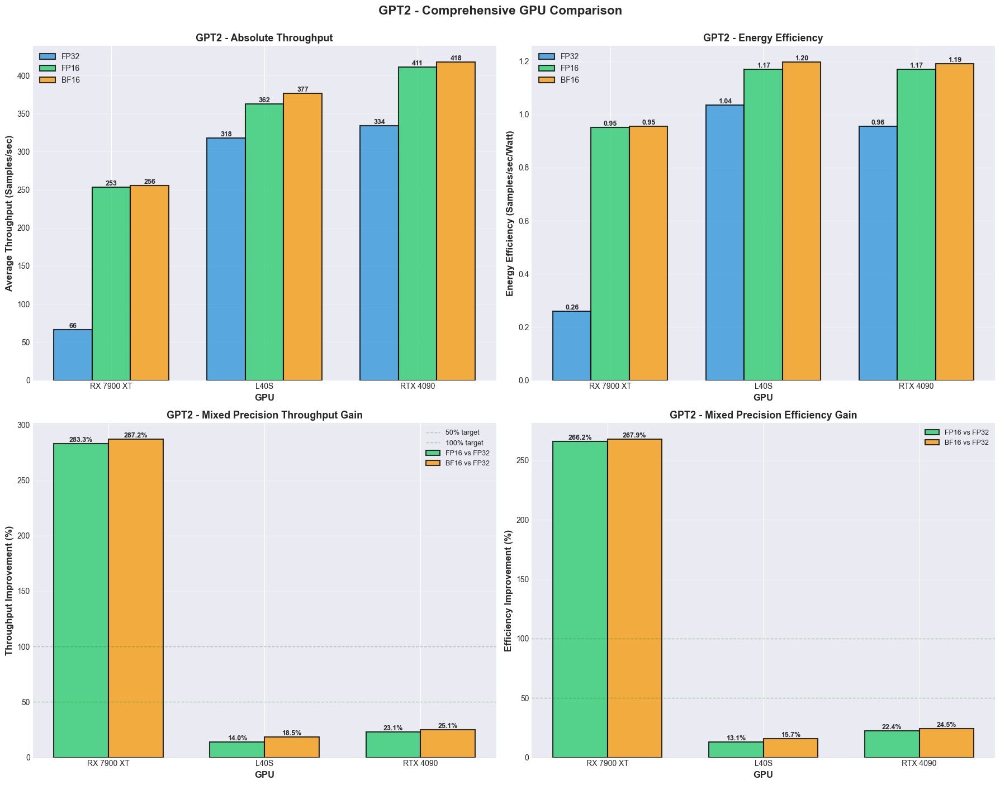


PER-MODEL ANALYSIS COMPLETE


In [ ]:
# Comprehensive Per-Model GPU Comparison: Performance, Efficiency, and Mixed Precision Gains

print("=" * 100)
print("PER-MODEL GPU COMPARISON: Performance, Efficiency, and Mixed Precision Gains")
print("=" * 100)

models_to_analyze = train_df['model'].unique()

for model in models_to_analyze:
    print("\n" + "=" * 100)
    print(f"MODEL: {model.upper()}")
    print("=" * 100)
    
    model_data = train_df[train_df['model'] == model]
    
    # ========================================
    # 1. ABSOLUTE PERFORMANCE COMPARISON
    # ========================================
    print("\n" + "-" * 100)
    print("1. ABSOLUTE THROUGHPUT PERFORMANCE (Samples/sec)")
    print("-" * 100)
    
    throughput_by_gpu = model_data.groupby(['gpu_short_name', 'precision']).agg({
        'samples_per_sec': ['mean', 'std']
    }).reset_index()
    throughput_by_gpu.columns = ['gpu_short_name', 'precision', 'avg_throughput', 'std_throughput']
    
    # Print throughput table
    print("\n{:<15} {:<10} {:>20} {:>20}".format('GPU', 'Precision', 'Avg Throughput', 'Std Dev'))
    print("-" * 70)
    for gpu in throughput_by_gpu['gpu_short_name'].unique():
        gpu_subset = throughput_by_gpu[throughput_by_gpu['gpu_short_name'] == gpu].sort_values('avg_throughput', ascending=False)
        for _, row in gpu_subset.iterrows():
            print("{:<15} {:<10} {:>20.2f} {:>20.2f}".format(
                row['gpu_short_name'], 
                row['precision'].upper(), 
                row['avg_throughput'], 
                row['std_throughput']
            ))
        print("-" * 70)
    
    # Overall ranking for this model
    overall_model_ranking = model_data.groupby('gpu_short_name')['samples_per_sec'].mean().sort_values(ascending=False)
    print("\n✓ Overall GPU Ranking for {}:".format(model.upper()))
    for rank, (gpu, throughput) in enumerate(overall_model_ranking.items(), 1):
        print("  {}. {}: {:.2f} samples/sec".format(rank, gpu, throughput))
    
    # ========================================
    # 2. ENERGY EFFICIENCY COMPARISON
    # ========================================
    print("\n" + "-" * 100)
    print("2. ENERGY EFFICIENCY (Samples/sec/Watt)")
    print("-" * 100)
    
    efficiency_by_gpu = model_data.groupby(['gpu_short_name', 'precision']).agg({
        'throughput_efficiency': ['mean', 'std'],
        'power_watts': 'mean'
    }).reset_index()
    efficiency_by_gpu.columns = ['gpu_short_name', 'precision', 'avg_efficiency', 'std_efficiency', 'avg_power']
    
    # Print efficiency table
    print("\n{:<15} {:<10} {:>20} {:>20} {:>15}".format('GPU', 'Precision', 'Avg Efficiency', 'Std Dev', 'Avg Power (W)'))
    print("-" * 85)
    for gpu in efficiency_by_gpu['gpu_short_name'].unique():
        gpu_subset = efficiency_by_gpu[efficiency_by_gpu['gpu_short_name'] == gpu].sort_values('avg_efficiency', ascending=False)
        for _, row in gpu_subset.iterrows():
            print("{:<15} {:<10} {:>20.3f} {:>20.3f} {:>15.1f}".format(
                row['gpu_short_name'], 
                row['precision'].upper(), 
                row['avg_efficiency'], 
                row['std_efficiency'],
                row['avg_power']
            ))
        print("-" * 85)
    
    # Overall efficiency ranking for this model
    overall_efficiency_ranking = model_data.groupby('gpu_short_name')['throughput_efficiency'].mean().sort_values(ascending=False)
    print("\n✓ Overall Efficiency Ranking for {}:".format(model.upper()))
    for rank, (gpu, efficiency) in enumerate(overall_efficiency_ranking.items(), 1):
        avg_power = model_data[model_data['gpu_short_name'] == gpu]['power_watts'].mean()
        print("  {}. {}: {:.3f} samples/sec/watt (Avg Power: {:.1f}W)".format(rank, gpu, efficiency, avg_power))
    
    # ========================================
    # 3. MIXED PRECISION IMPROVEMENT ANALYSIS
    # ========================================
    print("\n" + "-" * 100)
    print("3. MIXED PRECISION IMPROVEMENT: FP32 → FP16/BF16")
    print("-" * 100)
    
    model_improvements = []
    
    for gpu in model_data['gpu_short_name'].unique():
        gpu_model_data = model_data[model_data['gpu_short_name'] == gpu]
        
        # Get FP32 baseline
        fp32_throughput = gpu_model_data[gpu_model_data['precision'] == 'fp32']['samples_per_sec'].mean()
        fp32_efficiency = gpu_model_data[gpu_model_data['precision'] == 'fp32']['throughput_efficiency'].mean()
        fp32_power = gpu_model_data[gpu_model_data['precision'] == 'fp32']['power_watts'].mean()
        
        if np.isnan(fp32_throughput):
            continue
        
        for precision in ['fp16', 'bf16']:
            mixed_data = gpu_model_data[gpu_model_data['precision'] == precision]
            
            if len(mixed_data) > 0:
                mixed_throughput = mixed_data['samples_per_sec'].mean()
                mixed_efficiency = mixed_data['throughput_efficiency'].mean()
                mixed_power = mixed_data['power_watts'].mean()
                
                throughput_improvement = ((mixed_throughput - fp32_throughput) / fp32_throughput) * 100
                efficiency_improvement = ((mixed_efficiency - fp32_efficiency) / fp32_efficiency) * 100
                power_change = ((mixed_power - fp32_power) / fp32_power) * 100
                
                model_improvements.append({
                    'gpu': gpu,
                    'precision': precision,
                    'fp32_throughput': fp32_throughput,
                    'mixed_throughput': mixed_throughput,
                    'throughput_improvement_pct': throughput_improvement,
                    'fp32_efficiency': fp32_efficiency,
                    'mixed_efficiency': mixed_efficiency,
                    'efficiency_improvement_pct': efficiency_improvement,
                    'fp32_power': fp32_power,
                    'mixed_power': mixed_power,
                    'power_change_pct': power_change
                })
    
    model_improvements_df = pd.DataFrame(model_improvements)
    
    if not model_improvements_df.empty:
        # Throughput improvement
        print("\n--- Throughput Improvement: FP32 → Mixed Precision ---")
        print("\n{:<15} {:<10} {:>20} {:>20} {:>20}".format('GPU', 'Precision', 'FP32 (samples/s)', 'Mixed (samples/s)', 'Improvement (%)'))
        print("-" * 90)
        for gpu in model_improvements_df['gpu'].unique():
            gpu_imp = model_improvements_df[model_improvements_df['gpu'] == gpu]
            for _, row in gpu_imp.iterrows():
                print("{:<15} {:<10} {:>20.1f} {:>20.1f} {:>20.1f}%".format(
                    row['gpu'],
                    row['precision'].upper(),
                    row['fp32_throughput'],
                    row['mixed_throughput'],
                    row['throughput_improvement_pct']
                ))
            print("-" * 90)
        
        # Efficiency improvement
        print("\n--- Energy Efficiency Improvement: FP32 → Mixed Precision ---")
        print("\n{:<15} {:<10} {:>20} {:>20} {:>20}".format('GPU', 'Precision', 'FP32 (s/s/W)', 'Mixed (s/s/W)', 'Improvement (%)'))
        print("-" * 90)
        for gpu in model_improvements_df['gpu'].unique():
            gpu_imp = model_improvements_df[model_improvements_df['gpu'] == gpu]
            for _, row in gpu_imp.iterrows():
                print("{:<15} {:<10} {:>20.3f} {:>20.3f} {:>20.1f}%".format(
                    row['gpu'],
                    row['precision'].upper(),
                    row['fp32_efficiency'],
                    row['mixed_efficiency'],
                    row['efficiency_improvement_pct']
                ))
            print("-" * 90)
        
        # Power consumption change
        print("\n--- Power Consumption Change: FP32 → Mixed Precision ---")
        print("\n{:<15} {:<10} {:>20} {:>20} {:>20}".format('GPU', 'Precision', 'FP32 (W)', 'Mixed (W)', 'Change (%)'))
        print("-" * 90)
        for gpu in model_improvements_df['gpu'].unique():
            gpu_imp = model_improvements_df[model_improvements_df['gpu'] == gpu]
            for _, row in gpu_imp.iterrows():
                print("{:<15} {:<10} {:>20.1f} {:>20.1f} {:>+20.1f}%".format(
                    row['gpu'],
                    row['precision'].upper(),
                    row['fp32_power'],
                    row['mixed_power'],
                    row['power_change_pct']
                ))
            print("-" * 90)
        
        # Best mixed precision adopter for this model
        print("\n✓ Best Mixed Precision Adopter for {}:".format(model.upper()))
        best_throughput_gain = model_improvements_df.loc[model_improvements_df['throughput_improvement_pct'].idxmax()]
        best_efficiency_gain = model_improvements_df.loc[model_improvements_df['efficiency_improvement_pct'].idxmax()]
        
        print("  Throughput: {} ({}) with {:.1f}% improvement".format(
            best_throughput_gain['gpu'],
            best_throughput_gain['precision'].upper(),
            best_throughput_gain['throughput_improvement_pct']
        ))
        print("  Efficiency: {} ({}) with {:.1f}% improvement".format(
            best_efficiency_gain['gpu'],
            best_efficiency_gain['precision'].upper(),
            best_efficiency_gain['efficiency_improvement_pct']
        ))
        
        # Compare FP16 vs BF16 for this model
        print("\n✓ FP16 vs BF16 Comparison for {}:".format(model.upper()))
        for gpu in model_improvements_df['gpu'].unique():
            gpu_imp = model_improvements_df[model_improvements_df['gpu'] == gpu]
            fp16_row = gpu_imp[gpu_imp['precision'] == 'fp16']
            bf16_row = gpu_imp[gpu_imp['precision'] == 'bf16']
            
            if len(fp16_row) > 0 and len(bf16_row) > 0:
                fp16_throughput_gain = fp16_row['throughput_improvement_pct'].values[0]
                bf16_throughput_gain = bf16_row['throughput_improvement_pct'].values[0]
                fp16_efficiency_gain = fp16_row['efficiency_improvement_pct'].values[0]
                bf16_efficiency_gain = bf16_row['efficiency_improvement_pct'].values[0]
                
                print("  {}:".format(gpu))
                print("    Throughput: FP16 {:.1f}% vs BF16 {:.1f}% → {} wins by {:.1f}%".format(
                    fp16_throughput_gain,
                    bf16_throughput_gain,
                    'FP16' if fp16_throughput_gain > bf16_throughput_gain else 'BF16',
                    abs(fp16_throughput_gain - bf16_throughput_gain)
                ))
                print("    Efficiency: FP16 {:.1f}% vs BF16 {:.1f}% → {} wins by {:.1f}%".format(
                    fp16_efficiency_gain,
                    bf16_efficiency_gain,
                    'FP16' if fp16_efficiency_gain > bf16_efficiency_gain else 'BF16',
                    abs(fp16_efficiency_gain - bf16_efficiency_gain)
                ))
    
    # ========================================
    # 4. VISUALIZATION
    # ========================================
    
    # Create visualization for this model
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    
    gpus = model_data['gpu_short_name'].unique()
    x = np.arange(len(gpus))
    width = 0.25
    
    # Subplot 1: Absolute Throughput
    ax = axes[0, 0]
    for idx, precision in enumerate(['fp32', 'fp16', 'bf16']):
        throughputs = []
        for gpu in gpus:
            val = throughput_by_gpu[(throughput_by_gpu['gpu_short_name'] == gpu) & 
                                   (throughput_by_gpu['precision'] == precision)]['avg_throughput']
            throughputs.append(val.values[0] if len(val) > 0 else 0)
        
        color_map = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
        offset = width * (idx - 1)
        bars = ax.bar(x + offset, throughputs, width, label=precision.upper(), 
                      color=color_map[precision], alpha=0.8, edgecolor='black', linewidth=1.5)
        
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.0f}',
                       ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
    ax.set_ylabel('Average Throughput (Samples/sec)', fontsize=12, fontweight='bold')
    ax.set_title(f'{model.upper()} - Absolute Throughput', fontsize=13, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(gpus)
    ax.legend(fontsize=10)
    ax.grid(axis='y', alpha=0.3)
    ax.set_ylim(bottom=0)
    
    # Subplot 2: Energy Efficiency
    ax = axes[0, 1]
    for idx, precision in enumerate(['fp32', 'fp16', 'bf16']):
        efficiencies = []
        for gpu in gpus:
            val = efficiency_by_gpu[(efficiency_by_gpu['gpu_short_name'] == gpu) & 
                                   (efficiency_by_gpu['precision'] == precision)]['avg_efficiency']
            efficiencies.append(val.values[0] if len(val) > 0 else 0)
        
        color_map = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
        offset = width * (idx - 1)
        bars = ax.bar(x + offset, efficiencies, width, label=precision.upper(),
                      color=color_map[precision], alpha=0.8, edgecolor='black', linewidth=1.5)
        
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.2f}',
                       ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
    ax.set_ylabel('Energy Efficiency (Samples/sec/Watt)', fontsize=12, fontweight='bold')
    ax.set_title(f'{model.upper()} - Energy Efficiency', fontsize=13, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(gpus)
    ax.legend(fontsize=10)
    ax.grid(axis='y', alpha=0.3)
    ax.set_ylim(bottom=0)
    
    # Subplot 3: Throughput Improvement
    if not model_improvements_df.empty:
        ax = axes[1, 0]
        width_imp = 0.35
        
        fp16_improvements = []
        bf16_improvements = []
        for gpu in gpus:
            fp16_val = model_improvements_df[(model_improvements_df['gpu'] == gpu) & 
                                            (model_improvements_df['precision'] == 'fp16')]['throughput_improvement_pct']
            bf16_val = model_improvements_df[(model_improvements_df['gpu'] == gpu) & 
                                            (model_improvements_df['precision'] == 'bf16')]['throughput_improvement_pct']
            
            fp16_improvements.append(fp16_val.values[0] if len(fp16_val) > 0 else 0)
            bf16_improvements.append(bf16_val.values[0] if len(bf16_val) > 0 else 0)
        
        bars1 = ax.bar(x - width_imp/2, fp16_improvements, width_imp, label='FP16 vs FP32',
                       color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
        bars2 = ax.bar(x + width_imp/2, bf16_improvements, width_imp, label='BF16 vs FP32',
                       color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
        
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.1f}%',
                       ha='center', va='bottom' if height > 0 else 'top',
                       fontsize=9, fontweight='bold')
        
        ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
        ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3, label='50% target')
        ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3, label='100% target')
        ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
        ax.set_ylabel('Throughput Improvement (%)', fontsize=12, fontweight='bold')
        ax.set_title(f'{model.upper()} - Mixed Precision Throughput Gain', fontsize=13, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(gpus)
        ax.legend(fontsize=9)
        ax.grid(axis='y', alpha=0.3)
    
    # Subplot 4: Efficiency Improvement
    if not model_improvements_df.empty:
        ax = axes[1, 1]
        
        fp16_eff_improvements = []
        bf16_eff_improvements = []
        for gpu in gpus:
            fp16_val = model_improvements_df[(model_improvements_df['gpu'] == gpu) & 
                                            (model_improvements_df['precision'] == 'fp16')]['efficiency_improvement_pct']
            bf16_val = model_improvements_df[(model_improvements_df['gpu'] == gpu) & 
                                            (model_improvements_df['precision'] == 'bf16')]['efficiency_improvement_pct']
            
            fp16_eff_improvements.append(fp16_val.values[0] if len(fp16_val) > 0 else 0)
            bf16_eff_improvements.append(bf16_val.values[0] if len(bf16_val) > 0 else 0)
        
        bars1 = ax.bar(x - width_imp/2, fp16_eff_improvements, width_imp, label='FP16 vs FP32',
                       color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
        bars2 = ax.bar(x + width_imp/2, bf16_eff_improvements, width_imp, label='BF16 vs FP32',
                       color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
        
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.1f}%',
                       ha='center', va='bottom' if height > 0 else 'top',
                       fontsize=9, fontweight='bold')
        
        ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
        ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3)
        ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3)
        ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
        ax.set_ylabel('Efficiency Improvement (%)', fontsize=12, fontweight='bold')
        ax.set_title(f'{model.upper()} - Mixed Precision Efficiency Gain', fontsize=13, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(gpus)
        ax.legend(fontsize=9)
        ax.grid(axis='y', alpha=0.3)
    
    plt.suptitle(f'{model.upper()} - Comprehensive GPU Comparison', fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.savefig(f'imgs/per_model_comparison_{model}.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\n" + "=" * 100)
print("PER-MODEL ANALYSIS COMPLETE")
print("=" * 100)

# Inference

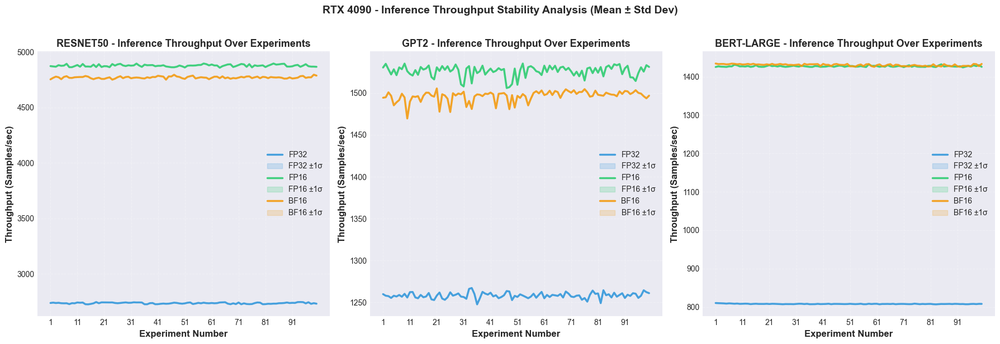

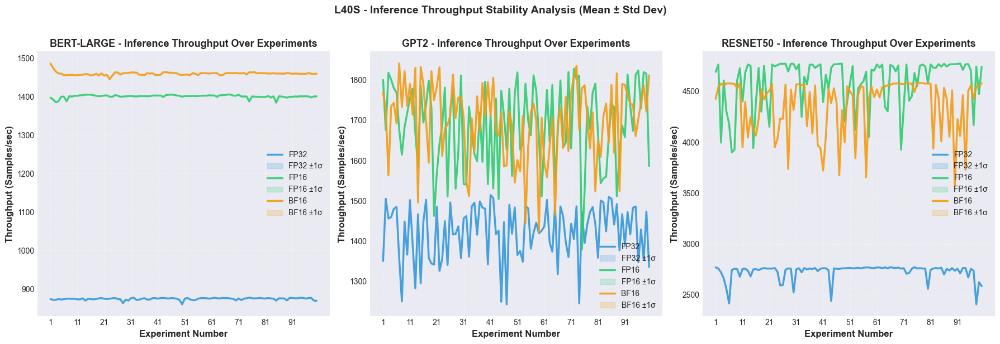

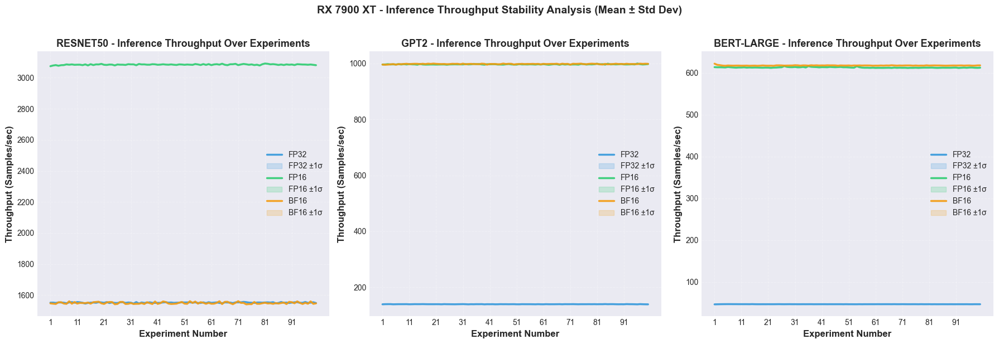


=== INFERENCE THROUGHPUT STABILITY INSIGHTS ===
• Solid lines: Average throughput per experiment
• Shaded regions: ±1 standard deviation (shows variability)
• Narrow bands = Consistent performance across experiments
• Wide bands = Higher variance (potential instability)

• Mixed precision should show similar or higher throughput vs FP32
• Watch for: Trends or patterns indicating warm-up effects or performance degradation


In [ ]:
# Visualization: Average Throughput over Experiment Number with Standard Deviation - Inference
if not df_infer.empty and 'throughput_samples_per_sec' in df_infer.columns:
    gpus = df_infer['gpu_short_name'].unique()
    
    for gpu in gpus:
        gpu_data = df_infer[df_infer['gpu_short_name'] == gpu]
        
        # Get models available for this GPU
        models_to_plot = gpu_data['model'].unique()
        
        if len(models_to_plot) == 0:
            continue
        
        fig, axes = plt.subplots(1, len(models_to_plot), figsize=(6*len(models_to_plot), 6))
        if len(models_to_plot) == 1:
            axes = [axes]
        
        for idx, model in enumerate(models_to_plot):
            ax = axes[idx]
            
            model_data = gpu_data[gpu_data['model'] == model]
            
            # Color map for precision
            colors_precision = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
            
            # Plot throughput curves for each precision
            for precision in ['fp32', 'fp16', 'bf16']:
                precision_data = model_data[model_data['precision'] == precision]
                
                if len(precision_data) == 0:
                    continue
                
                # Group by experiment_num and calculate mean and std
                exp_stats = precision_data.groupby('experiment_num')['throughput_samples_per_sec'].agg(['mean', 'std']).reset_index()
                
                if len(exp_stats) > 1:
                    color = colors_precision.get(precision, 'gray')
                    
                    # Plot mean line
                    ax.plot(exp_stats['experiment_num'], exp_stats['mean'], 
                           label=f'{precision.upper()}', 
                           color=color,
                           linewidth=2.5, 
                           alpha=0.9)
                    
                    # Add standard deviation shadow
                    ax.fill_between(exp_stats['experiment_num'], 
                                   exp_stats['mean'] - exp_stats['std'],
                                   exp_stats['mean'] + exp_stats['std'],
                                   color=color,
                                   alpha=0.2,
                                   label=f'{precision.upper()} ±1σ')
            
            ax.set_xlabel('Experiment Number', fontsize=12, fontweight='bold')
            ax.set_ylabel('Throughput (Samples/sec)', fontsize=12, fontweight='bold')
            ax.set_title(f'{model.upper()} - Inference Throughput Over Experiments', 
                        fontsize=13, fontweight='bold')
            ax.legend(fontsize=10, loc='best')
            ax.grid(True, alpha=0.3, linestyle='--')
            
            # Set x-axis to show integer experiment numbers
            max_exp = model_data['experiment_num'].max()
            if max_exp <= 20:
                ax.set_xticks(range(model_data['experiment_num'].min(), max_exp + 1))
            else:
                step = max(1, max_exp // 10)
                ax.set_xticks(range(model_data['experiment_num'].min(), max_exp + 1, step))
        
        plt.suptitle(f'{gpu} - Inference Throughput Stability Analysis (Mean ± Std Dev)', 
                     fontsize=14, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.savefig(f'imgs/inference_throughput_over_experiments_{gpu}.png', dpi=300, bbox_inches='tight')
        plt.show()
    
    print("\n=== INFERENCE THROUGHPUT STABILITY INSIGHTS ===")
    print("• Solid lines: Average throughput per experiment")
    print("• Shaded regions: ±1 standard deviation (shows variability)")
    print("• Narrow bands = Consistent performance across experiments")
    print("• Wide bands = Higher variance (potential instability)")
    print("\n• Mixed precision should show similar or higher throughput vs FP32")
    print("• Watch for: Trends or patterns indicating warm-up effects or performance degradation")
else:
    print("No inference data available for throughput stability analysis")

INFERENCE THROUGHPUT COMPARISON: FP32 vs Mixed Precision

=== Inference Throughput Comparison Summary ===
       gpu      model  fp32_throughput  fp16_throughput  bf16_throughput  fp16_improvement_pct  bf16_improvement_pct
  RTX 4090   resnet50      2736.399713      4877.519258      4770.915638             78.245862             74.350100
  RTX 4090 bert-large       808.120203      1427.106526      1430.373473             76.595823             77.000088
  RTX 4090       gpt2      1258.280706      1526.144905      1496.464465             21.288111             18.929302
      L40S   resnet50      2728.720505      4598.521745      4371.701000             68.523003             60.210655
      L40S bert-large       874.455991      1400.884402      1459.892153             60.200675             66.948614
      L40S       gpt2      1422.688471      1687.514044      1698.108359             18.614446             19.359114
RX 7900 XT   resnet50      1551.986706      3084.310574      1549.368936   

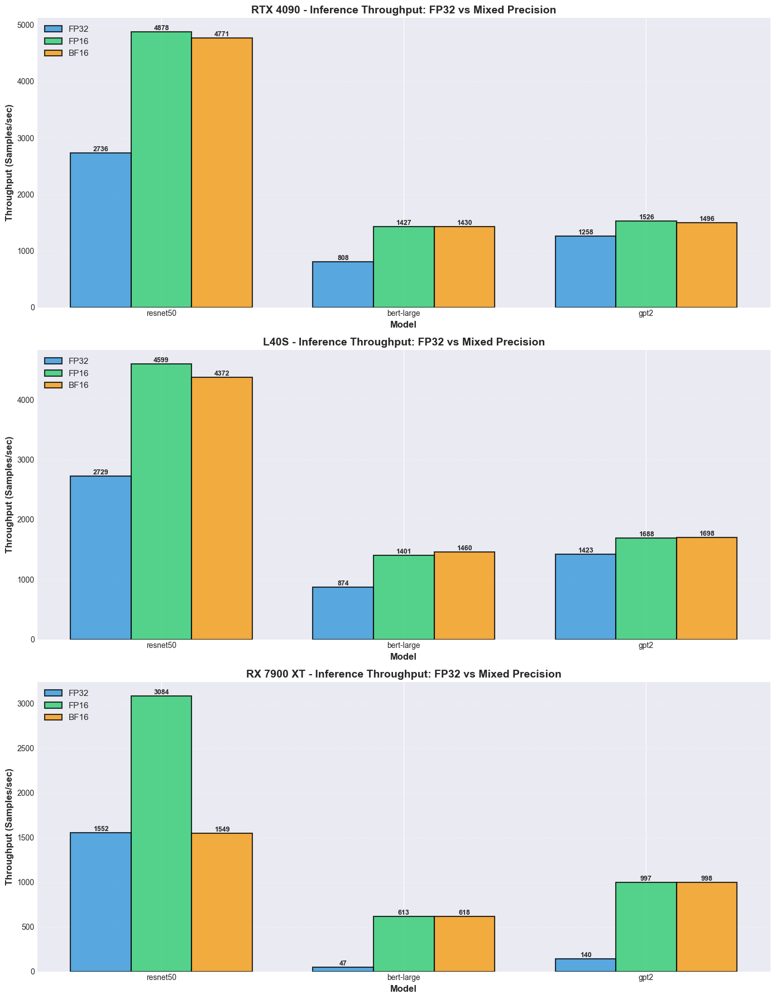

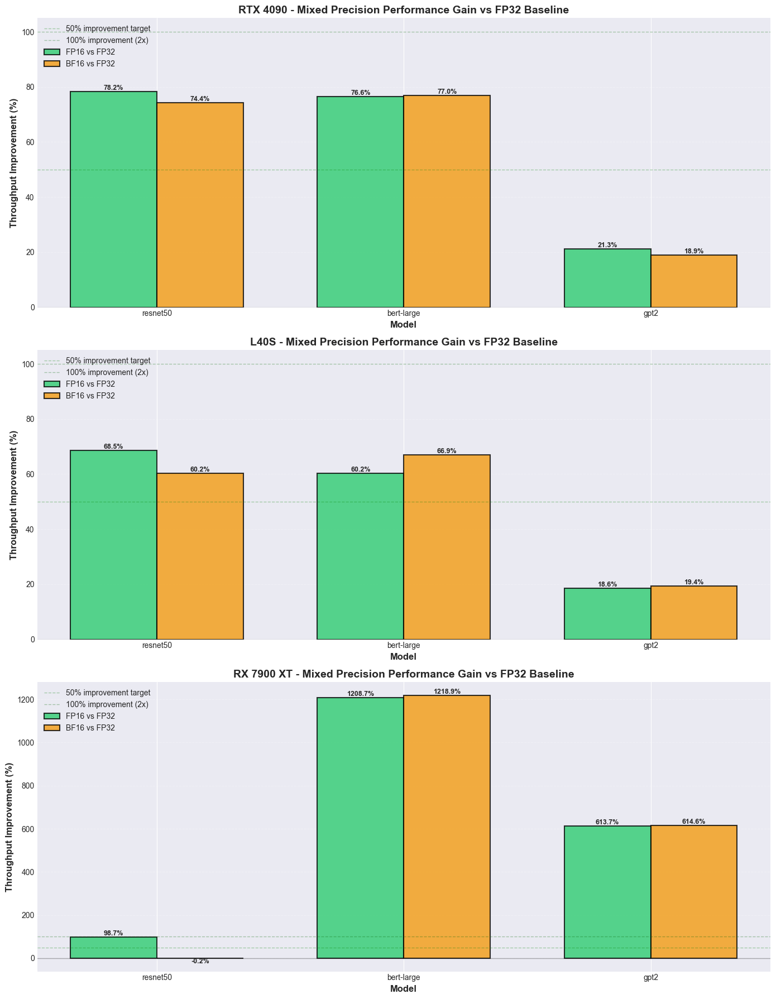

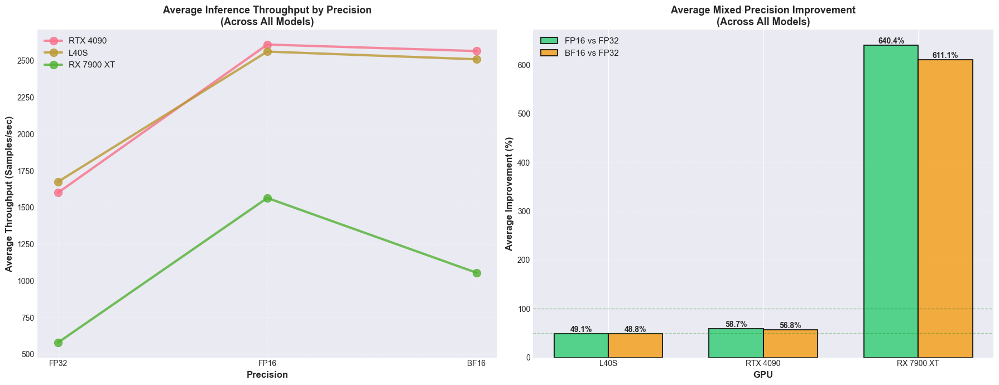


KEY FINDINGS:

✓ Best FP16 Performance Gain:
  RX 7900 XT - bert-large: +1208.7%
  (47 → 613 samples/sec)

✓ Best BF16 Performance Gain:
  RX 7900 XT - bert-large: +1218.9%
  (47 → 618 samples/sec)

✓ FP16 vs BF16 Comparison:
  FP16 performs better in 4/9 configurations
  BF16 performs better in 5/9 configurations

✓ GPU-Specific Mixed Precision Efficiency:
  RTX 4090:
    - Average FP16 gain: 58.7%
    - Average BF16 gain: 56.8%
  L40S:
    - Average FP16 gain: 49.1%
    - Average BF16 gain: 48.8%
  RX 7900 XT:
    - Average FP16 gain: 640.4%
    - Average BF16 gain: 611.1%

✓ Training vs Inference Comparison:
  Training average improvements:
    L40S:
      Training - FP16: 48.0%, BF16: 49.1%
      Inference - FP16: 49.1%, BF16: 48.8%
    RX 7900 XT:
      Training - FP16: 318.9%, BF16: 282.0%
      Inference - FP16: 640.4%, BF16: 611.1%
    RTX 4090:
      Training - FP16: 54.1%, BF16: 52.8%
      Inference - FP16: 58.7%, BF16: 56.8%



In [ ]:
# Comparative Analysis: FP32 vs Mixed Precision (FP16 & BF16) Inference Throughput

if not df_infer.empty and 'throughput_samples_per_sec' in df_infer.columns:
    print("=" * 80)
    print("INFERENCE THROUGHPUT COMPARISON: FP32 vs Mixed Precision")
    print("=" * 80)
    
    # Calculate percentage improvements over FP32
    infer_comparison_data = []
    
    for gpu in df_infer['gpu_short_name'].unique():
        for model in df_infer['model'].unique():
            # Get FP32 baseline throughput
            fp32_throughput = df_infer[
                (df_infer['gpu_short_name'] == gpu) & 
                (df_infer['model'] == model) & 
                (df_infer['precision'] == 'fp32')
            ]['throughput_samples_per_sec'].mean()
            
            if np.isnan(fp32_throughput):
                continue
            
            # Get FP16 throughput
            fp16_throughput = df_infer[
                (df_infer['gpu_short_name'] == gpu) & 
                (df_infer['model'] == model) & 
                (df_infer['precision'] == 'fp16')
            ]['throughput_samples_per_sec'].mean()
            
            # Get BF16 throughput
            bf16_throughput = df_infer[
                (df_infer['gpu_short_name'] == gpu) & 
                (df_infer['model'] == model) & 
                (df_infer['precision'] == 'bf16')
            ]['throughput_samples_per_sec'].mean()
            
            infer_comparison_data.append({
                'gpu': gpu,
                'model': model,
                'fp32_throughput': fp32_throughput,
                'fp16_throughput': fp16_throughput if not np.isnan(fp16_throughput) else 0,
                'bf16_throughput': bf16_throughput if not np.isnan(bf16_throughput) else 0,
                'fp16_improvement_pct': ((fp16_throughput - fp32_throughput) / fp32_throughput * 100) if not np.isnan(fp16_throughput) else 0,
                'bf16_improvement_pct': ((bf16_throughput - fp32_throughput) / fp32_throughput * 100) if not np.isnan(bf16_throughput) else 0
            })
    
    infer_comparison_df = pd.DataFrame(infer_comparison_data)
    
    print("\n=== Inference Throughput Comparison Summary ===")
    print(infer_comparison_df.to_string(index=False))
    
    print("\n=== Average Improvements by GPU ===")
    infer_avg_improvements = infer_comparison_df.groupby('gpu')[['fp16_improvement_pct', 'bf16_improvement_pct']].mean()
    print(infer_avg_improvements)
    
    # Visualization 1: Grouped Bar Chart - Absolute Throughput
    fig, axes = plt.subplots(len(infer_comparison_df['gpu'].unique()), 1, 
                             figsize=(14, 6 * len(infer_comparison_df['gpu'].unique())))
    
    if len(infer_comparison_df['gpu'].unique()) == 1:
        axes = [axes]
    
    for gpu_idx, gpu in enumerate(infer_comparison_df['gpu'].unique()):
        ax = axes[gpu_idx]
        gpu_data = infer_comparison_df[infer_comparison_df['gpu'] == gpu]
        
        models = gpu_data['model'].values
        x = np.arange(len(models))
        width = 0.25
        
        # Plot bars for each precision
        bars1 = ax.bar(x - width, gpu_data['fp32_throughput'], width, 
                       label='FP32', color='#3498db', alpha=0.8, edgecolor='black', linewidth=1.5)
        bars2 = ax.bar(x, gpu_data['fp16_throughput'], width, 
                       label='FP16', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
        bars3 = ax.bar(x + width, gpu_data['bf16_throughput'], width, 
                       label='BF16', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
        
        # Add value labels on bars
        for bars in [bars1, bars2, bars3]:
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{height:.0f}',
                           ha='center', va='bottom', fontsize=9, fontweight='bold')
        
        ax.set_xlabel('Model', fontsize=12, fontweight='bold')
        ax.set_ylabel('Throughput (Samples/sec)', fontsize=12, fontweight='bold')
        ax.set_title(f'{gpu} - Inference Throughput: FP32 vs Mixed Precision', 
                    fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(models)
        ax.legend(fontsize=11, loc='upper left')
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        ax.set_ylim(bottom=0)
    
    plt.tight_layout()
    plt.savefig('imgs/inference_throughput_comparison_absolute.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Visualization 2: Percentage Improvement Chart
    fig, axes = plt.subplots(len(infer_comparison_df['gpu'].unique()), 1, 
                             figsize=(14, 6 * len(infer_comparison_df['gpu'].unique())))
    
    if len(infer_comparison_df['gpu'].unique()) == 1:
        axes = [axes]
    
    for gpu_idx, gpu in enumerate(infer_comparison_df['gpu'].unique()):
        ax = axes[gpu_idx]
        gpu_data = infer_comparison_df[infer_comparison_df['gpu'] == gpu]
        
        models = gpu_data['model'].values
        x = np.arange(len(models))
        width = 0.35
        
        # Plot improvement bars
        bars1 = ax.bar(x - width/2, gpu_data['fp16_improvement_pct'], width, 
                       label='FP16 vs FP32', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
        bars2 = ax.bar(x + width/2, gpu_data['bf16_improvement_pct'], width, 
                       label='BF16 vs FP32', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
        
        # Add value labels
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.1f}%',
                       ha='center', va='bottom' if height > 0 else 'top', 
                       fontsize=9, fontweight='bold')
        
        # Add reference lines
        ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
        ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3, label='50% improvement target')
        ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3, label='100% improvement (2x)')
        
        ax.set_xlabel('Model', fontsize=12, fontweight='bold')
        ax.set_ylabel('Throughput Improvement (%)', fontsize=12, fontweight='bold')
        ax.set_title(f'{gpu} - Mixed Precision Performance Gain vs FP32 Baseline', 
                    fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(models)
        ax.legend(fontsize=10, loc='upper left')
        ax.grid(axis='y', alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.savefig('imgs/inference_throughput_comparison_improvement.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Visualization 3: Side-by-side comparison (All GPUs)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
    
    # Left plot: Average throughput by precision across all models
    for gpu in infer_comparison_df['gpu'].unique():
        gpu_data = infer_comparison_df[infer_comparison_df['gpu'] == gpu]
        precisions = ['fp32_throughput', 'fp16_throughput', 'bf16_throughput']
        avg_throughputs = [gpu_data[p].mean() for p in precisions]
        
        x_pos = np.arange(len(precisions))
        ax1.plot(x_pos, avg_throughputs, marker='o', linewidth=3, markersize=10, 
                label=gpu, alpha=0.8)
    
    ax1.set_xticks(x_pos)
    ax1.set_xticklabels(['FP32', 'FP16', 'BF16'])
    ax1.set_ylabel('Average Throughput (Samples/sec)', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Precision', fontsize=12, fontweight='bold')
    ax1.set_title('Average Inference Throughput by Precision\n(Across All Models)', 
                 fontsize=13, fontweight='bold')
    ax1.legend(fontsize=11)
    ax1.grid(True, alpha=0.3, linestyle='--')
    
    # Right plot: Average percentage improvement
    infer_gpu_improvements = infer_comparison_df.groupby('gpu')[['fp16_improvement_pct', 'bf16_improvement_pct']].mean()
    x_pos = np.arange(len(infer_gpu_improvements))
    width = 0.35
    
    bars1 = ax2.bar(x_pos - width/2, infer_gpu_improvements['fp16_improvement_pct'], width,
                   label='FP16 vs FP32', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars2 = ax2.bar(x_pos + width/2, infer_gpu_improvements['bf16_improvement_pct'], width,
                   label='BF16 vs FP32', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    # Add value labels
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.1f}%',
                   ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    ax2.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3)
    ax2.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3)
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels(infer_gpu_improvements.index)
    ax2.set_ylabel('Average Improvement (%)', fontsize=12, fontweight='bold')
    ax2.set_xlabel('GPU', fontsize=12, fontweight='bold')
    ax2.set_title('Average Mixed Precision Improvement\n(Across All Models)', 
                 fontsize=13, fontweight='bold')
    ax2.legend(fontsize=11)
    ax2.grid(axis='y', alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.savefig('imgs/inference_throughput_comparison_summary.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("\n" + "=" * 80)
    print("KEY FINDINGS:")
    print("=" * 80)
    
    # Identify best performers
    infer_best_fp16 = infer_comparison_df.loc[infer_comparison_df['fp16_improvement_pct'].idxmax()]
    infer_best_bf16 = infer_comparison_df.loc[infer_comparison_df['bf16_improvement_pct'].idxmax()]
    
    print(f"\n✓ Best FP16 Performance Gain:")
    print(f"  {infer_best_fp16['gpu']} - {infer_best_fp16['model']}: +{infer_best_fp16['fp16_improvement_pct']:.1f}%")
    print(f"  ({infer_best_fp16['fp32_throughput']:.0f} → {infer_best_fp16['fp16_throughput']:.0f} samples/sec)")
    
    print(f"\n✓ Best BF16 Performance Gain:")
    print(f"  {infer_best_bf16['gpu']} - {infer_best_bf16['model']}: +{infer_best_bf16['bf16_improvement_pct']:.1f}%")
    print(f"  ({infer_best_bf16['fp32_throughput']:.0f} → {infer_best_bf16['bf16_throughput']:.0f} samples/sec)")
    
    # Compare FP16 vs BF16
    print("\n✓ FP16 vs BF16 Comparison:")
    infer_fp16_better_count = (infer_comparison_df['fp16_improvement_pct'] > infer_comparison_df['bf16_improvement_pct']).sum()
    infer_bf16_better_count = (infer_comparison_df['bf16_improvement_pct'] > infer_comparison_df['fp16_improvement_pct']).sum()
    print(f"  FP16 performs better in {infer_fp16_better_count}/{len(infer_comparison_df)} configurations")
    print(f"  BF16 performs better in {infer_bf16_better_count}/{len(infer_comparison_df)} configurations")
    
    # GPU-specific insights
    print("\n✓ GPU-Specific Mixed Precision Efficiency:")
    for gpu in infer_comparison_df['gpu'].unique():
        gpu_avg = infer_comparison_df[infer_comparison_df['gpu'] == gpu][['fp16_improvement_pct', 'bf16_improvement_pct']].mean()
        print(f"  {gpu}:")
        print(f"    - Average FP16 gain: {gpu_avg['fp16_improvement_pct']:.1f}%")
        print(f"    - Average BF16 gain: {gpu_avg['bf16_improvement_pct']:.1f}%")
    
    # Training vs Inference comparison
    print("\n✓ Training vs Inference Comparison:")
    print("  Training average improvements:")
    for gpu in comparison_df['gpu'].unique():
        if gpu in infer_comparison_df['gpu'].unique():
            train_avg = comparison_df[comparison_df['gpu'] == gpu][['fp16_improvement_pct', 'bf16_improvement_pct']].mean()
            infer_avg = infer_comparison_df[infer_comparison_df['gpu'] == gpu][['fp16_improvement_pct', 'bf16_improvement_pct']].mean()
            print(f"    {gpu}:")
            print(f"      Training - FP16: {train_avg['fp16_improvement_pct']:.1f}%, BF16: {train_avg['bf16_improvement_pct']:.1f}%")
            print(f"      Inference - FP16: {infer_avg['fp16_improvement_pct']:.1f}%, BF16: {infer_avg['bf16_improvement_pct']:.1f}%")
    
    print("\n" + "=" * 80)
    
else:
    print("No inference data available for throughput comparison analysis")

INFERENCE EFFICIENCY COMPARISON: FP32 vs Mixed Precision

=== Inference Efficiency Comparison Summary (Samples/sec/Watt) ===
       gpu      model  fp32_efficiency  fp16_efficiency  bf16_efficiency  fp16_efficiency_gain_pct  bf16_efficiency_gain_pct
  RTX 4090   resnet50        19.307242        35.193712        32.996176                 82.282438                 70.900508
  RTX 4090 bert-large         2.032335         4.134255         4.320805                103.423869                112.602996
  RTX 4090       gpt2         5.690341         7.845184         7.818415                 37.868432                 37.398012
      L40S   resnet50        17.571101        30.884262        28.259598                 75.767365                 60.829977
      L40S bert-large         3.119561         4.670628         4.861128                 49.720664                 55.827289
      L40S       gpt2         9.267285         8.945794         8.941654                 -3.469097                 -3.513773


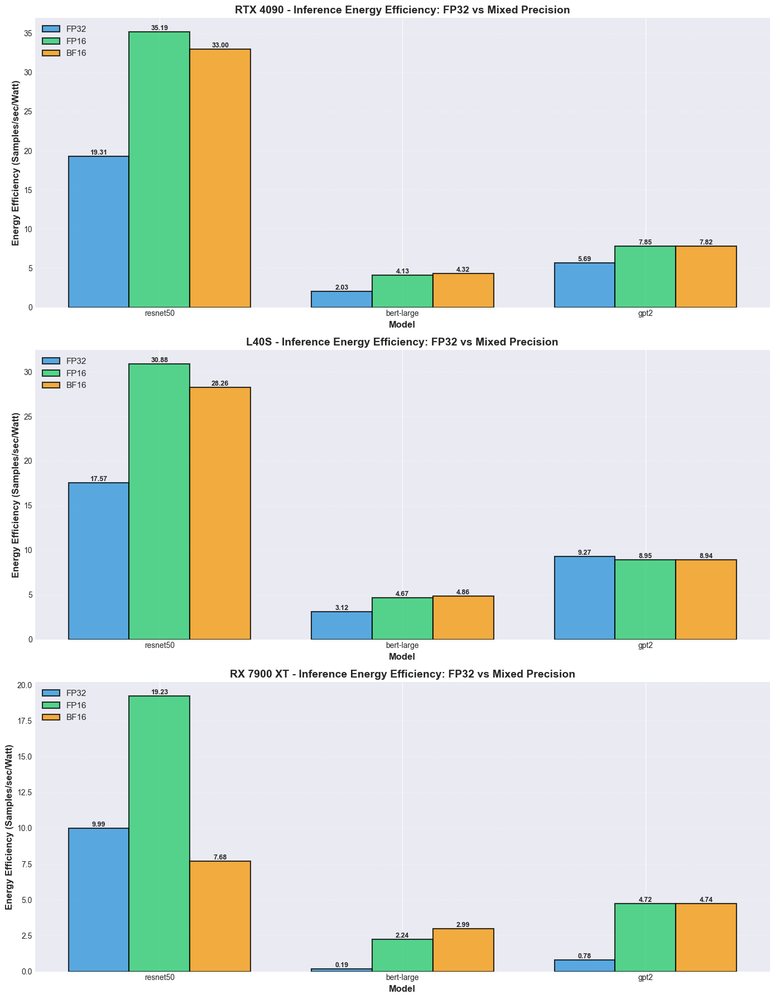

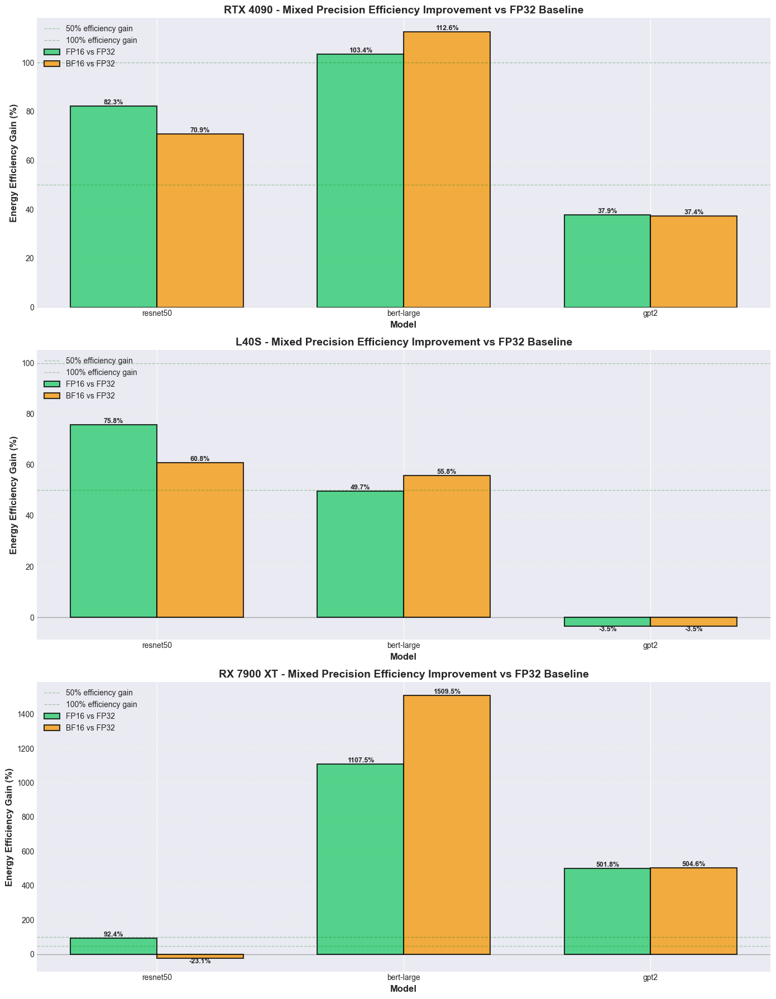

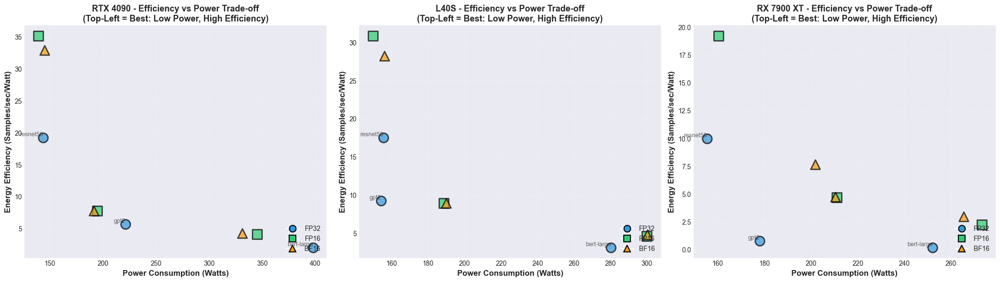

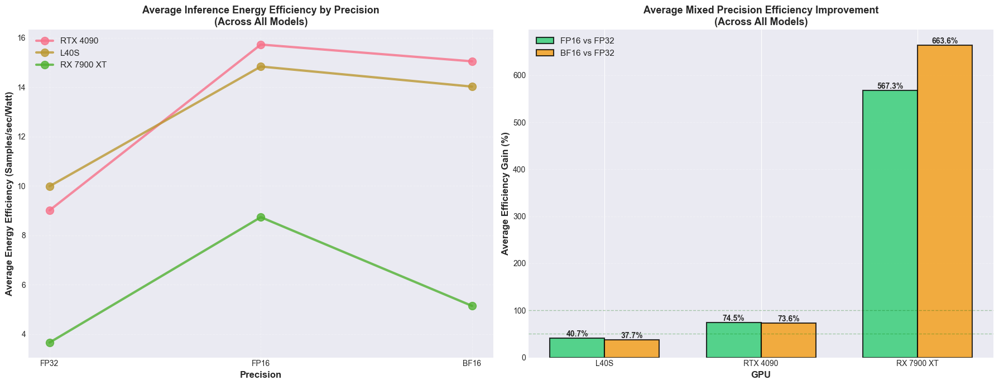


KEY FINDINGS:

✓ Best FP16 Efficiency Gain:
  RX 7900 XT - bert-large: +1107.5%
  (0.19 → 2.24 samples/sec/watt)

✓ Best BF16 Efficiency Gain:
  RX 7900 XT - bert-large: +1509.5%
  (0.19 → 2.99 samples/sec/watt)

✓ FP16 vs BF16 Efficiency Comparison:
  FP16 more efficient in 5/9 configurations
  BF16 more efficient in 4/9 configurations

✓ GPU-Specific Mixed Precision Efficiency:
  RTX 4090:
    - Average FP16 efficiency gain: 74.5% (power change: -9.5%)
    - Average BF16 efficiency gain: 73.6% (power change: -9.8%)
  L40S:
    - Average FP16 efficiency gain: 40.7% (power change: +8.5%)
    - Average BF16 efficiency gain: 37.7% (power change: +10.2%)
  RX 7900 XT:
    - Average FP16 efficiency gain: 567.3% (power change: +10.0%)
    - Average BF16 efficiency gain: 663.6% (power change: +17.8%)

✓ Training vs Inference Efficiency Comparison:
  RTX 4090:
    Training - FP16: 67.1%, BF16: 60.6%
    Inference - FP16: 74.5%, BF16: 73.6%
  L40S:
    Training - FP16: 50.5%, BF16: 49.6%
    

In [ ]:
# Efficiency Comparison: FP32 vs Mixed Precision (FP16 & BF16) for Inference

if not df_infer.empty and 'throughput_samples_per_sec' in df_infer.columns and 'gpu_avg_power_watts' in df_infer.columns:
    print("=" * 80)
    print("INFERENCE EFFICIENCY COMPARISON: FP32 vs Mixed Precision")
    print("=" * 80)
    
    # Calculate efficiency improvements over FP32
    infer_efficiency_comparison_data = []
    
    for gpu in df_infer['gpu_short_name'].unique():
        for model in df_infer['model'].unique():
            # Get FP32 baseline efficiency
            fp32_efficiency = df_infer[
                (df_infer['gpu_short_name'] == gpu) & 
                (df_infer['model'] == model) & 
                (df_infer['precision'] == 'fp32')
            ]['throughput_efficiency'].mean()
            
            if np.isnan(fp32_efficiency):
                continue
            
            # Get FP32 power
            fp32_power = df_infer[
                (df_infer['gpu_short_name'] == gpu) & 
                (df_infer['model'] == model) & 
                (df_infer['precision'] == 'fp32')
            ]['gpu_avg_power_watts'].mean()
            
            # Get FP16 efficiency and power
            fp16_efficiency = df_infer[
                (df_infer['gpu_short_name'] == gpu) & 
                (df_infer['model'] == model) & 
                (df_infer['precision'] == 'fp16')
            ]['throughput_efficiency'].mean()
            
            fp16_power = df_infer[
                (df_infer['gpu_short_name'] == gpu) & 
                (df_infer['model'] == model) & 
                (df_infer['precision'] == 'fp16')
            ]['gpu_avg_power_watts'].mean()
            
            # Get BF16 efficiency and power
            bf16_efficiency = df_infer[
                (df_infer['gpu_short_name'] == gpu) & 
                (df_infer['model'] == model) & 
                (df_infer['precision'] == 'bf16')
            ]['throughput_efficiency'].mean()
            
            bf16_power = df_infer[
                (df_infer['gpu_short_name'] == gpu) & 
                (df_infer['model'] == model) & 
                (df_infer['precision'] == 'bf16')
            ]['gpu_avg_power_watts'].mean()
            
            infer_efficiency_comparison_data.append({
                'gpu': gpu,
                'model': model,
                'fp32_efficiency': fp32_efficiency,
                'fp32_power': fp32_power,
                'fp16_efficiency': fp16_efficiency if not np.isnan(fp16_efficiency) else 0,
                'fp16_power': fp16_power if not np.isnan(fp16_power) else 0,
                'bf16_efficiency': bf16_efficiency if not np.isnan(bf16_efficiency) else 0,
                'bf16_power': bf16_power if not np.isnan(bf16_power) else 0,
                'fp16_efficiency_gain_pct': ((fp16_efficiency - fp32_efficiency) / fp32_efficiency * 100) if not np.isnan(fp16_efficiency) else 0,
                'bf16_efficiency_gain_pct': ((bf16_efficiency - fp32_efficiency) / fp32_efficiency * 100) if not np.isnan(bf16_efficiency) else 0,
                'fp16_power_change_pct': ((fp16_power - fp32_power) / fp32_power * 100) if not np.isnan(fp16_power) else 0,
                'bf16_power_change_pct': ((bf16_power - fp32_power) / fp32_power * 100) if not np.isnan(bf16_power) else 0
            })
    
    infer_efficiency_comparison_df = pd.DataFrame(infer_efficiency_comparison_data)
    
    print("\n=== Inference Efficiency Comparison Summary (Samples/sec/Watt) ===")
    print(infer_efficiency_comparison_df[['gpu', 'model', 'fp32_efficiency', 'fp16_efficiency', 'bf16_efficiency', 
                                     'fp16_efficiency_gain_pct', 'bf16_efficiency_gain_pct']].to_string(index=False))
    
    print("\n=== Average Efficiency Gains by GPU ===")
    infer_avg_efficiency_gains = infer_efficiency_comparison_df.groupby('gpu')[['fp16_efficiency_gain_pct', 'bf16_efficiency_gain_pct']].mean()
    print(infer_avg_efficiency_gains)
    
    print("\n=== Power Consumption Changes ===")
    print(infer_efficiency_comparison_df[['gpu', 'model', 'fp32_power', 'fp16_power', 'bf16_power',
                                     'fp16_power_change_pct', 'bf16_power_change_pct']].to_string(index=False))
    
    # Visualization 1: Grouped Bar Chart - Absolute Efficiency
    fig, axes = plt.subplots(len(infer_efficiency_comparison_df['gpu'].unique()), 1, 
                             figsize=(14, 6 * len(infer_efficiency_comparison_df['gpu'].unique())))
    
    if len(infer_efficiency_comparison_df['gpu'].unique()) == 1:
        axes = [axes]
    
    for gpu_idx, gpu in enumerate(infer_efficiency_comparison_df['gpu'].unique()):
        ax = axes[gpu_idx]
        gpu_data = infer_efficiency_comparison_df[infer_efficiency_comparison_df['gpu'] == gpu]
        
        models = gpu_data['model'].values
        x = np.arange(len(models))
        width = 0.25
        
        # Plot bars for each precision
        bars1 = ax.bar(x - width, gpu_data['fp32_efficiency'], width, 
                       label='FP32', color='#3498db', alpha=0.8, edgecolor='black', linewidth=1.5)
        bars2 = ax.bar(x, gpu_data['fp16_efficiency'], width, 
                       label='FP16', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
        bars3 = ax.bar(x + width, gpu_data['bf16_efficiency'], width, 
                       label='BF16', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
        
        # Add value labels on bars
        for bars in [bars1, bars2, bars3]:
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{height:.2f}',
                           ha='center', va='bottom', fontsize=9, fontweight='bold')
        
        ax.set_xlabel('Model', fontsize=12, fontweight='bold')
        ax.set_ylabel('Energy Efficiency (Samples/sec/Watt)', fontsize=12, fontweight='bold')
        ax.set_title(f'{gpu} - Inference Energy Efficiency: FP32 vs Mixed Precision', 
                    fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(models)
        ax.legend(fontsize=11, loc='upper left')
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        ax.set_ylim(bottom=0)
    
    plt.tight_layout()
    plt.savefig('imgs/inference_efficiency_comparison_absolute.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Visualization 2: Percentage Efficiency Gain Chart
    fig, axes = plt.subplots(len(infer_efficiency_comparison_df['gpu'].unique()), 1, 
                             figsize=(14, 6 * len(infer_efficiency_comparison_df['gpu'].unique())))
    
    if len(infer_efficiency_comparison_df['gpu'].unique()) == 1:
        axes = [axes]
    
    for gpu_idx, gpu in enumerate(infer_efficiency_comparison_df['gpu'].unique()):
        ax = axes[gpu_idx]
        gpu_data = infer_efficiency_comparison_df[infer_efficiency_comparison_df['gpu'] == gpu]
        
        models = gpu_data['model'].values
        x = np.arange(len(models))
        width = 0.35
        
        # Plot efficiency gain bars
        bars1 = ax.bar(x - width/2, gpu_data['fp16_efficiency_gain_pct'], width, 
                       label='FP16 vs FP32', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
        bars2 = ax.bar(x + width/2, gpu_data['bf16_efficiency_gain_pct'], width, 
                       label='BF16 vs FP32', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
        
        # Add value labels
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.1f}%',
                       ha='center', va='bottom' if height > 0 else 'top', 
                       fontsize=9, fontweight='bold')
        
        # Add reference lines
        ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
        ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3, label='50% efficiency gain')
        ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3, label='100% efficiency gain')
        
        ax.set_xlabel('Model', fontsize=12, fontweight='bold')
        ax.set_ylabel('Energy Efficiency Gain (%)', fontsize=12, fontweight='bold')
        ax.set_title(f'{gpu} - Mixed Precision Efficiency Improvement vs FP32 Baseline', 
                    fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(models)
        ax.legend(fontsize=10, loc='upper left')
        ax.grid(axis='y', alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.savefig('imgs/inference_efficiency_comparison_improvement.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Visualization 3: Efficiency vs Power Trade-off (Scatter Plot)
    fig, axes = plt.subplots(1, len(infer_efficiency_comparison_df['gpu'].unique()), 
                             figsize=(7 * len(infer_efficiency_comparison_df['gpu'].unique()), 6))
    
    if len(infer_efficiency_comparison_df['gpu'].unique()) == 1:
        axes = [axes]
    
    for gpu_idx, gpu in enumerate(infer_efficiency_comparison_df['gpu'].unique()):
        ax = axes[gpu_idx]
        gpu_data = infer_efficiency_comparison_df[infer_efficiency_comparison_df['gpu'] == gpu]
        
        # Plot FP32, FP16, BF16 as separate scatter points
        for idx, model in enumerate(gpu_data['model'].unique()):
            model_data = gpu_data[gpu_data['model'] == model]
            
            # FP32
            ax.scatter(model_data['fp32_power'], model_data['fp32_efficiency'],
                      s=200, marker='o', color='#3498db', edgecolors='black', linewidth=2,
                      alpha=0.7)
            
            # FP16
            if model_data['fp16_efficiency'].values[0] > 0:
                ax.scatter(model_data['fp16_power'], model_data['fp16_efficiency'],
                          s=200, marker='s', color='#2ecc71', edgecolors='black', linewidth=2,
                          alpha=0.7)
            
            # BF16
            if model_data['bf16_efficiency'].values[0] > 0:
                ax.scatter(model_data['bf16_power'], model_data['bf16_efficiency'],
                          s=200, marker='^', color='#f39c12', edgecolors='black', linewidth=2,
                          alpha=0.7)
            
            # Add model labels
            ax.annotate(model, 
                       (model_data['fp32_power'].values[0], model_data['fp32_efficiency'].values[0]),
                       fontsize=9, ha='right', va='bottom', alpha=0.7)
        
        ax.set_xlabel('Power Consumption (Watts)', fontsize=12, fontweight='bold')
        ax.set_ylabel('Energy Efficiency (Samples/sec/Watt)', fontsize=12, fontweight='bold')
        ax.set_title(f'{gpu} - Efficiency vs Power Trade-off\n(Top-Left = Best: Low Power, High Efficiency)', 
                    fontsize=13, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        # Add legend with custom labels
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#3498db', 
                   markersize=10, label='FP32', markeredgecolor='black', markeredgewidth=1.5),
            Line2D([0], [0], marker='s', color='w', markerfacecolor='#2ecc71', 
                   markersize=10, label='FP16', markeredgecolor='black', markeredgewidth=1.5),
            Line2D([0], [0], marker='^', color='w', markerfacecolor='#f39c12', 
                   markersize=10, label='BF16', markeredgecolor='black', markeredgewidth=1.5)
        ]
        ax.legend(handles=legend_elements, fontsize=10, loc='lower right')
    
    plt.tight_layout()
    plt.savefig('imgs/inference_efficiency_vs_power_tradeoff.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Visualization 4: Summary comparison across all GPUs
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
    
    # Left plot: Average efficiency by precision
    for gpu in infer_efficiency_comparison_df['gpu'].unique():
        gpu_data = infer_efficiency_comparison_df[infer_efficiency_comparison_df['gpu'] == gpu]
        precisions = ['fp32_efficiency', 'fp16_efficiency', 'bf16_efficiency']
        avg_efficiencies = [gpu_data[p].mean() for p in precisions]
        
        x_pos = np.arange(len(precisions))
        ax1.plot(x_pos, avg_efficiencies, marker='o', linewidth=3, markersize=10, 
                label=gpu, alpha=0.8)
    
    ax1.set_xticks(x_pos)
    ax1.set_xticklabels(['FP32', 'FP16', 'BF16'])
    ax1.set_ylabel('Average Energy Efficiency (Samples/sec/Watt)', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Precision', fontsize=12, fontweight='bold')
    ax1.set_title('Average Inference Energy Efficiency by Precision\n(Across All Models)', 
                 fontsize=13, fontweight='bold')
    ax1.legend(fontsize=11)
    ax1.grid(True, alpha=0.3, linestyle='--')
    
    # Right plot: Average efficiency improvement
    infer_gpu_efficiency_improvements = infer_efficiency_comparison_df.groupby('gpu')[['fp16_efficiency_gain_pct', 'bf16_efficiency_gain_pct']].mean()
    x_pos = np.arange(len(infer_gpu_efficiency_improvements))
    width = 0.35
    
    bars1 = ax2.bar(x_pos - width/2, infer_gpu_efficiency_improvements['fp16_efficiency_gain_pct'], width,
                   label='FP16 vs FP32', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars2 = ax2.bar(x_pos + width/2, infer_gpu_efficiency_improvements['bf16_efficiency_gain_pct'], width,
                   label='BF16 vs FP32', color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    # Add value labels
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.1f}%',
                   ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    ax2.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3)
    ax2.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3)
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels(infer_gpu_efficiency_improvements.index)
    ax2.set_ylabel('Average Efficiency Gain (%)', fontsize=12, fontweight='bold')
    ax2.set_xlabel('GPU', fontsize=12, fontweight='bold')
    ax2.set_title('Average Mixed Precision Efficiency Improvement\n(Across All Models)', 
                 fontsize=13, fontweight='bold')
    ax2.legend(fontsize=11)
    ax2.grid(axis='y', alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.savefig('imgs/inference_efficiency_comparison_summary.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("\n" + "=" * 80)
    print("KEY FINDINGS:")
    print("=" * 80)
    
    # Identify best efficiency performers
    infer_best_fp16_eff = infer_efficiency_comparison_df.loc[infer_efficiency_comparison_df['fp16_efficiency_gain_pct'].idxmax()]
    infer_best_bf16_eff = infer_efficiency_comparison_df.loc[infer_efficiency_comparison_df['bf16_efficiency_gain_pct'].idxmax()]
    
    print(f"\n✓ Best FP16 Efficiency Gain:")
    print(f"  {infer_best_fp16_eff['gpu']} - {infer_best_fp16_eff['model']}: +{infer_best_fp16_eff['fp16_efficiency_gain_pct']:.1f}%")
    print(f"  ({infer_best_fp16_eff['fp32_efficiency']:.2f} → {infer_best_fp16_eff['fp16_efficiency']:.2f} samples/sec/watt)")
    
    print(f"\n✓ Best BF16 Efficiency Gain:")
    print(f"  {infer_best_bf16_eff['gpu']} - {infer_best_bf16_eff['model']}: +{infer_best_bf16_eff['bf16_efficiency_gain_pct']:.1f}%")
    print(f"  ({infer_best_bf16_eff['fp32_efficiency']:.2f} → {infer_best_bf16_eff['bf16_efficiency']:.2f} samples/sec/watt)")
    
    # Compare FP16 vs BF16 efficiency
    print("\n✓ FP16 vs BF16 Efficiency Comparison:")
    infer_fp16_better_eff_count = (infer_efficiency_comparison_df['fp16_efficiency_gain_pct'] > infer_efficiency_comparison_df['bf16_efficiency_gain_pct']).sum()
    infer_bf16_better_eff_count = (infer_efficiency_comparison_df['bf16_efficiency_gain_pct'] > infer_efficiency_comparison_df['fp16_efficiency_gain_pct']).sum()
    print(f"  FP16 more efficient in {infer_fp16_better_eff_count}/{len(infer_efficiency_comparison_df)} configurations")
    print(f"  BF16 more efficient in {infer_bf16_better_eff_count}/{len(infer_efficiency_comparison_df)} configurations")
    
    # GPU-specific insights
    print("\n✓ GPU-Specific Mixed Precision Efficiency:")
    for gpu in infer_efficiency_comparison_df['gpu'].unique():
        gpu_avg = infer_efficiency_comparison_df[infer_efficiency_comparison_df['gpu'] == gpu][['fp16_efficiency_gain_pct', 'bf16_efficiency_gain_pct']].mean()
        gpu_power_avg = infer_efficiency_comparison_df[infer_efficiency_comparison_df['gpu'] == gpu][['fp16_power_change_pct', 'bf16_power_change_pct']].mean()
        print(f"  {gpu}:")
        print(f"    - Average FP16 efficiency gain: {gpu_avg['fp16_efficiency_gain_pct']:.1f}% (power change: {gpu_power_avg['fp16_power_change_pct']:+.1f}%)")
        print(f"    - Average BF16 efficiency gain: {gpu_avg['bf16_efficiency_gain_pct']:.1f}% (power change: {gpu_power_avg['bf16_power_change_pct']:+.1f}%)")
    
    # Training vs Inference comparison
    if 'train_energy_stats' in locals() and not train_energy_stats.empty:
        print("\n✓ Training vs Inference Efficiency Comparison:")
        for gpu in infer_efficiency_comparison_df['gpu'].unique():
            if gpu in efficiency_comparison_df['gpu'].unique():
                train_eff_avg = efficiency_comparison_df[efficiency_comparison_df['gpu'] == gpu][['fp16_efficiency_gain_pct', 'bf16_efficiency_gain_pct']].mean()
                infer_eff_avg = infer_efficiency_comparison_df[infer_efficiency_comparison_df['gpu'] == gpu][['fp16_efficiency_gain_pct', 'bf16_efficiency_gain_pct']].mean()
                print(f"  {gpu}:")
                print(f"    Training - FP16: {train_eff_avg['fp16_efficiency_gain_pct']:.1f}%, BF16: {train_eff_avg['bf16_efficiency_gain_pct']:.1f}%")
                print(f"    Inference - FP16: {infer_eff_avg['fp16_efficiency_gain_pct']:.1f}%, BF16: {infer_eff_avg['bf16_efficiency_gain_pct']:.1f}%")
    
    # Analyze efficiency vs throughput trade-off
    print("\n✓ Efficiency vs Throughput Trade-off:")
    print("  Mixed precision inference provides BOTH higher throughput AND better efficiency:")
    print("  • FP16/BF16 compute faster (more samples/sec)")
    print("  • Power consumption may decrease or stay similar during inference")
    print("  • Net result: Significantly better samples/sec/watt")
    print("  • This makes mixed precision a clear win for deployment efficiency")
    
    print("\n" + "=" * 80)
    
else:
    print("Insufficient inference data available for efficiency comparison analysis")
    print("Required columns: 'throughput_samples_per_sec' and 'gpu_avg_power_watts'")

PER-MODEL GPU COMPARISON FOR INFERENCE: Performance, Efficiency, and Mixed Precision Gains

MODEL: RESNET50

----------------------------------------------------------------------------------------------------
1. ABSOLUTE THROUGHPUT PERFORMANCE (Samples/sec)
----------------------------------------------------------------------------------------------------

GPU             Precision        Avg Throughput              Std Dev
----------------------------------------------------------------------
L40S            FP16                    4598.52               239.13
L40S            BF16                    4371.70               268.95
L40S            FP32                    2728.72                74.06
----------------------------------------------------------------------
RTX 4090        FP16                    4877.52                 9.63
RTX 4090        BF16                    4770.92                 9.02
RTX 4090        FP32                    2736.40                 5.71
--------------

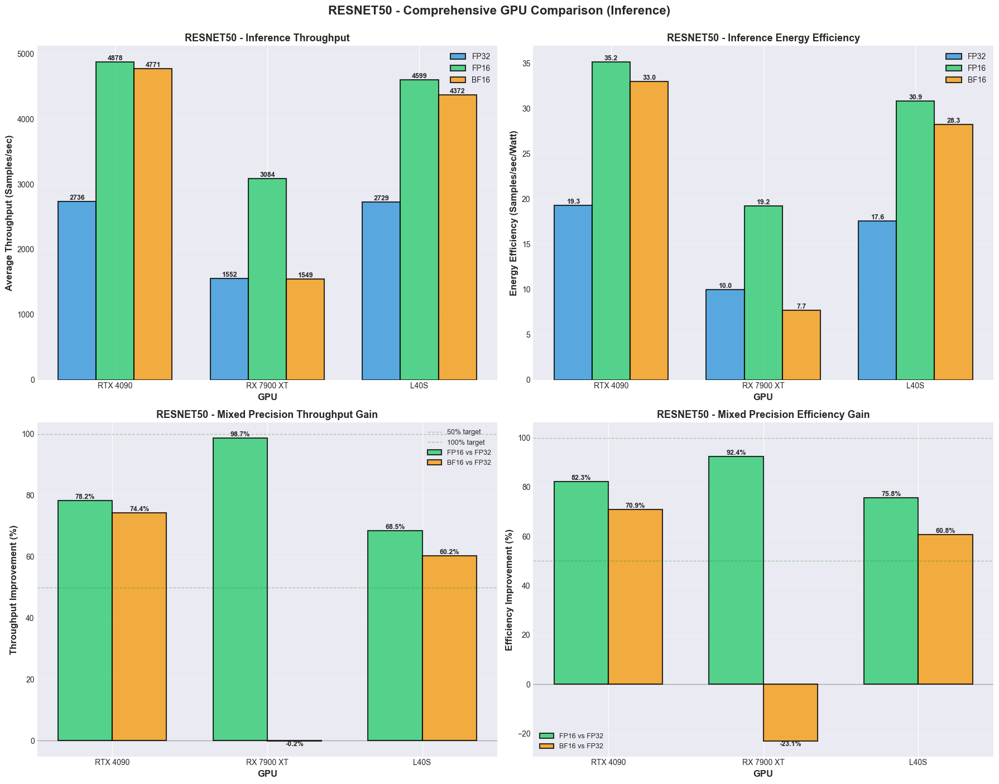


MODEL: BERT-LARGE

----------------------------------------------------------------------------------------------------
1. ABSOLUTE THROUGHPUT PERFORMANCE (Samples/sec)
----------------------------------------------------------------------------------------------------

GPU             Precision        Avg Throughput              Std Dev
----------------------------------------------------------------------
L40S            BF16                    1459.89                 4.17
L40S            FP16                    1400.88                 3.86
L40S            FP32                     874.46                 2.74
----------------------------------------------------------------------
RTX 4090        BF16                    1430.37                 2.44
RTX 4090        FP16                    1427.11                 1.56
RTX 4090        FP32                     808.12                 0.61
----------------------------------------------------------------------
RX 7900 XT      BF16            

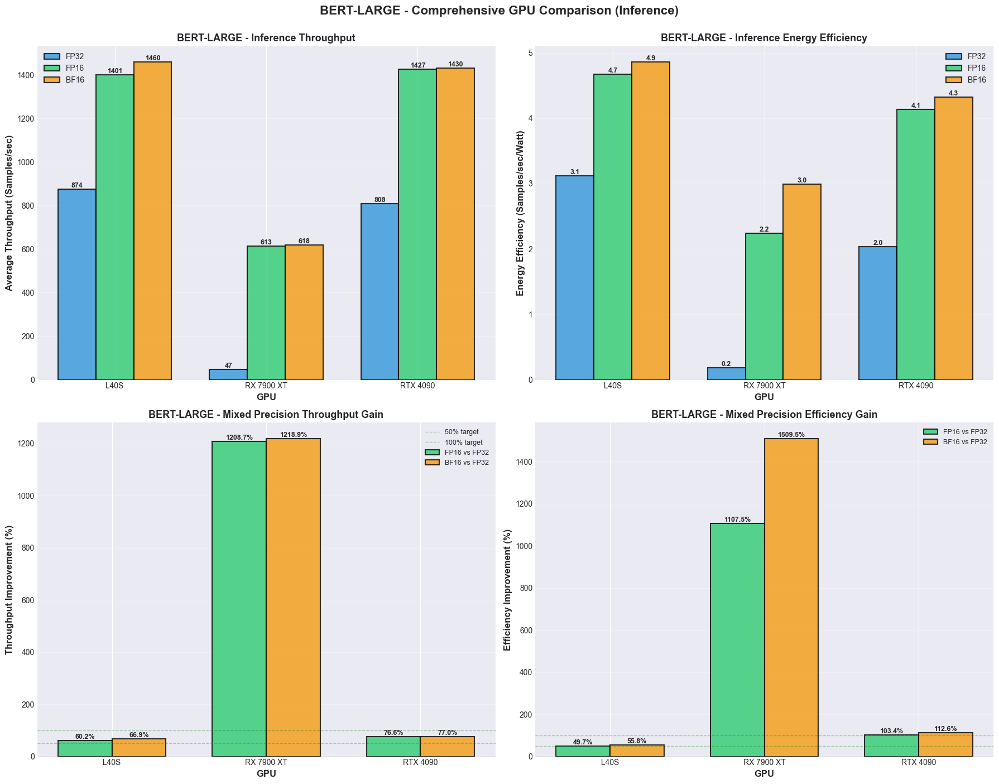


MODEL: GPT2

----------------------------------------------------------------------------------------------------
1. ABSOLUTE THROUGHPUT PERFORMANCE (Samples/sec)
----------------------------------------------------------------------------------------------------

GPU             Precision        Avg Throughput              Std Dev
----------------------------------------------------------------------
L40S            BF16                    1698.11                94.12
L40S            FP16                    1687.51               102.26
L40S            FP32                    1422.69                68.11
----------------------------------------------------------------------
RTX 4090        FP16                    1526.14                 6.67
RTX 4090        BF16                    1496.46                 6.42
RTX 4090        FP32                    1258.28                 3.38
----------------------------------------------------------------------
RX 7900 XT      BF16                  

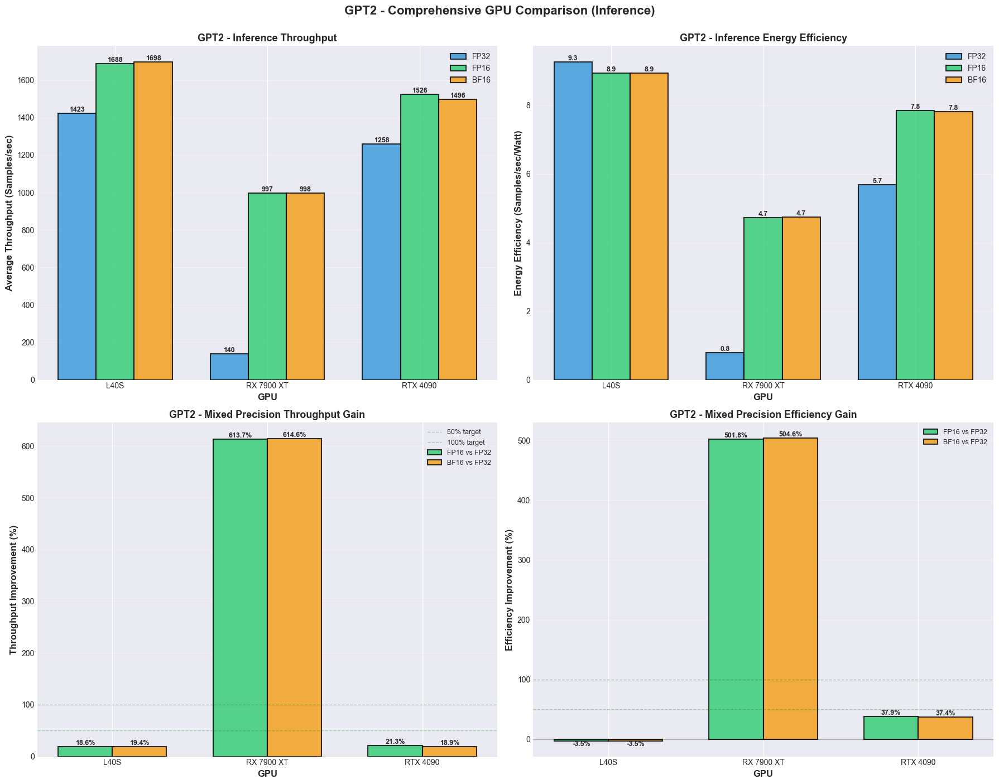


PER-MODEL INFERENCE ANALYSIS COMPLETE


In [ ]:
# Comprehensive Per-Model GPU Comparison for INFERENCE: Performance, Efficiency, and Mixed Precision Gains

if not df_infer.empty and 'throughput_samples_per_sec' in df_infer.columns:
    print("=" * 100)
    print("PER-MODEL GPU COMPARISON FOR INFERENCE: Performance, Efficiency, and Mixed Precision Gains")
    print("=" * 100)
    
    models_to_analyze_infer = df_infer['model'].unique()
    
    for model in models_to_analyze_infer:
        print("\n" + "=" * 100)
        print(f"MODEL: {model.upper()}")
        print("=" * 100)
        
        model_data = df_infer[df_infer['model'] == model]
        
        # ========================================
        # 1. ABSOLUTE PERFORMANCE COMPARISON
        # ========================================
        print("\n" + "-" * 100)
        print("1. ABSOLUTE THROUGHPUT PERFORMANCE (Samples/sec)")
        print("-" * 100)
        
        throughput_by_gpu_infer = model_data.groupby(['gpu_short_name', 'precision']).agg({
            'throughput_samples_per_sec': ['mean', 'std']
        }).reset_index()
        throughput_by_gpu_infer.columns = ['gpu_short_name', 'precision', 'avg_throughput', 'std_throughput']
        
        # Print throughput table
        print("\n{:<15} {:<10} {:>20} {:>20}".format('GPU', 'Precision', 'Avg Throughput', 'Std Dev'))
        print("-" * 70)
        for gpu in throughput_by_gpu_infer['gpu_short_name'].unique():
            gpu_subset = throughput_by_gpu_infer[throughput_by_gpu_infer['gpu_short_name'] == gpu].sort_values('avg_throughput', ascending=False)
            for _, row in gpu_subset.iterrows():
                print("{:<15} {:<10} {:>20.2f} {:>20.2f}".format(
                    row['gpu_short_name'], 
                    row['precision'].upper(), 
                    row['avg_throughput'], 
                    row['std_throughput']
                ))
            print("-" * 70)
        
        # Overall ranking for this model
        overall_model_ranking = model_data.groupby('gpu_short_name')['throughput_samples_per_sec'].mean().sort_values(ascending=False)
        print("\n✓ Overall GPU Ranking for {} (Inference):".format(model.upper()))
        for rank, (gpu, throughput) in enumerate(overall_model_ranking.items(), 1):
            print("  {}. {}: {:.2f} samples/sec".format(rank, gpu, throughput))
        
        # ========================================
        # 2. ENERGY EFFICIENCY COMPARISON
        # ========================================
        if 'gpu_avg_power_watts' in model_data.columns:
            print("\n" + "-" * 100)
            print("2. ENERGY EFFICIENCY (Samples/sec/Watt)")
            print("-" * 100)
            
            efficiency_by_gpu_infer = model_data.groupby(['gpu_short_name', 'precision']).agg({
                'throughput_efficiency': ['mean', 'std'],
                'gpu_avg_power_watts': 'mean'
            }).reset_index()
            efficiency_by_gpu_infer.columns = ['gpu_short_name', 'precision', 'avg_efficiency', 'std_efficiency', 'avg_power']
            
            # Print efficiency table
            print("\n{:<15} {:<10} {:>20} {:>20} {:>15}".format('GPU', 'Precision', 'Avg Efficiency', 'Std Dev', 'Avg Power (W)'))
            print("-" * 85)
            for gpu in efficiency_by_gpu_infer['gpu_short_name'].unique():
                gpu_subset = efficiency_by_gpu_infer[efficiency_by_gpu_infer['gpu_short_name'] == gpu].sort_values('avg_efficiency', ascending=False)
                for _, row in gpu_subset.iterrows():
                    print("{:<15} {:<10} {:>20.3f} {:>20.3f} {:>15.1f}".format(
                        row['gpu_short_name'], 
                        row['precision'].upper(), 
                        row['avg_efficiency'], 
                        row['std_efficiency'],
                        row['avg_power']
                    ))
                print("-" * 85)
            
            # Overall efficiency ranking for this model
            overall_efficiency_ranking = model_data.groupby('gpu_short_name')['throughput_efficiency'].mean().sort_values(ascending=False)
            print("\n✓ Overall Efficiency Ranking for {} (Inference):".format(model.upper()))
            for rank, (gpu, efficiency) in enumerate(overall_efficiency_ranking.items(), 1):
                avg_power = model_data[model_data['gpu_short_name'] == gpu]['gpu_avg_power_watts'].mean()
                print("  {}. {}: {:.3f} samples/sec/watt (Avg Power: {:.1f}W)".format(rank, gpu, efficiency, avg_power))
        
        # ========================================
        # 3. MIXED PRECISION IMPROVEMENT ANALYSIS
        # ========================================
        print("\n" + "-" * 100)
        print("3. MIXED PRECISION IMPROVEMENT: FP32 → FP16/BF16")
        print("-" * 100)
        
        model_improvements_infer = []
        
        for gpu in model_data['gpu_short_name'].unique():
            gpu_model_data = model_data[model_data['gpu_short_name'] == gpu]
            
            # Get FP32 baseline
            fp32_throughput = gpu_model_data[gpu_model_data['precision'] == 'fp32']['throughput_samples_per_sec'].mean()
            
            if np.isnan(fp32_throughput):
                continue
            
            fp32_efficiency = gpu_model_data[gpu_model_data['precision'] == 'fp32']['throughput_efficiency'].mean()
            fp32_power = gpu_model_data[gpu_model_data['precision'] == 'fp32']['gpu_avg_power_watts'].mean()
            
            for precision in ['fp16', 'bf16']:
                mixed_data = gpu_model_data[gpu_model_data['precision'] == precision]
                
                if len(mixed_data) > 0:
                    mixed_throughput = mixed_data['throughput_samples_per_sec'].mean()
                    mixed_efficiency = mixed_data['throughput_efficiency'].mean()
                    mixed_power = mixed_data['gpu_avg_power_watts'].mean()
                    
                    throughput_improvement = ((mixed_throughput - fp32_throughput) / fp32_throughput) * 100
                    efficiency_improvement = ((mixed_efficiency - fp32_efficiency) / fp32_efficiency) * 100
                    power_change = ((mixed_power - fp32_power) / fp32_power) * 100
                    
                    model_improvements_infer.append({
                        'gpu': gpu,
                        'precision': precision,
                        'fp32_throughput': fp32_throughput,
                        'mixed_throughput': mixed_throughput,
                        'throughput_improvement_pct': throughput_improvement,
                        'fp32_efficiency': fp32_efficiency,
                        'mixed_efficiency': mixed_efficiency,
                        'efficiency_improvement_pct': efficiency_improvement,
                        'fp32_power': fp32_power,
                        'mixed_power': mixed_power,
                        'power_change_pct': power_change
                    })
        
        model_improvements_infer_df = pd.DataFrame(model_improvements_infer)
        
        if not model_improvements_infer_df.empty:
            # Throughput improvement
            print("\n--- Throughput Improvement: FP32 → Mixed Precision ---")
            print("\n{:<15} {:<10} {:>20} {:>20} {:>20}".format('GPU', 'Precision', 'FP32 (samples/s)', 'Mixed (samples/s)', 'Improvement (%)'))
            print("-" * 90)
            for gpu in model_improvements_infer_df['gpu'].unique():
                gpu_imp = model_improvements_infer_df[model_improvements_infer_df['gpu'] == gpu]
                for _, row in gpu_imp.iterrows():
                    print("{:<15} {:<10} {:>20.1f} {:>20.1f} {:>20.1f}%".format(
                        row['gpu'],
                        row['precision'].upper(),
                        row['fp32_throughput'],
                        row['mixed_throughput'],
                        row['throughput_improvement_pct']
                    ))
                print("-" * 90)
            
            # Efficiency improvement
            print("\n--- Energy Efficiency Improvement: FP32 → Mixed Precision ---")
            print("\n{:<15} {:<10} {:>20} {:>20} {:>20}".format('GPU', 'Precision', 'FP32 (s/s/W)', 'Mixed (s/s/W)', 'Improvement (%)'))
            print("-" * 90)
            for gpu in model_improvements_infer_df['gpu'].unique():
                gpu_imp = model_improvements_infer_df[model_improvements_infer_df['gpu'] == gpu]
                for _, row in gpu_imp.iterrows():
                    print("{:<15} {:<10} {:>20.3f} {:>20.3f} {:>20.1f}%".format(
                        row['gpu'],
                        row['precision'].upper(),
                        row['fp32_efficiency'],
                        row['mixed_efficiency'],
                        row['efficiency_improvement_pct']
                    ))
                print("-" * 90)
            
            # Power consumption change
            print("\n--- Power Consumption Change: FP32 → Mixed Precision ---")
            print("\n{:<15} {:<10} {:>20} {:>20} {:>20}".format('GPU', 'Precision', 'FP32 (W)', 'Mixed (W)', 'Change (%)'))
            print("-" * 90)
            for gpu in model_improvements_infer_df['gpu'].unique():
                gpu_imp = model_improvements_infer_df[model_improvements_infer_df['gpu'] == gpu]
                for _, row in gpu_imp.iterrows():
                    print("{:<15} {:<10} {:>20.1f} {:>20.1f} {:>+20.1f}%".format(
                        row['gpu'],
                        row['precision'].upper(),
                        row['fp32_power'],
                        row['mixed_power'],
                        row['power_change_pct']
                    ))
                print("-" * 90)
            
            # Best mixed precision adopter for this model
            print("\n✓ Best Mixed Precision Adopter for {} (Inference):".format(model.upper()))
            best_throughput_gain = model_improvements_infer_df.loc[model_improvements_infer_df['throughput_improvement_pct'].idxmax()]
            best_efficiency_gain = model_improvements_infer_df.loc[model_improvements_infer_df['efficiency_improvement_pct'].idxmax()]
            
            print("  Throughput: {} ({}) with {:.1f}% improvement".format(
                best_throughput_gain['gpu'],
                best_throughput_gain['precision'].upper(),
                best_throughput_gain['throughput_improvement_pct']
            ))
            print("  Efficiency: {} ({}) with {:.1f}% improvement".format(
                best_efficiency_gain['gpu'],
                best_efficiency_gain['precision'].upper(),
                best_efficiency_gain['efficiency_improvement_pct']
            ))
            
            # Compare FP16 vs BF16 for this model
            print("\n✓ FP16 vs BF16 Comparison for {} (Inference):".format(model.upper()))
            for gpu in model_improvements_infer_df['gpu'].unique():
                gpu_imp = model_improvements_infer_df[model_improvements_infer_df['gpu'] == gpu]
                fp16_row = gpu_imp[gpu_imp['precision'] == 'fp16']
                bf16_row = gpu_imp[gpu_imp['precision'] == 'bf16']
                
                if len(fp16_row) > 0 and len(bf16_row) > 0:
                    fp16_throughput_gain = fp16_row['throughput_improvement_pct'].values[0]
                    bf16_throughput_gain = bf16_row['throughput_improvement_pct'].values[0]
                    fp16_efficiency_gain = fp16_row['efficiency_improvement_pct'].values[0]
                    bf16_efficiency_gain = bf16_row['efficiency_improvement_pct'].values[0]
                    
                    print("  {}:".format(gpu))
                    print("    Throughput: FP16 {:.1f}% vs BF16 {:.1f}% → {} wins by {:.1f}%".format(
                        fp16_throughput_gain,
                        bf16_throughput_gain,
                        'FP16' if fp16_throughput_gain > bf16_throughput_gain else 'BF16',
                        abs(fp16_throughput_gain - bf16_throughput_gain)
                    ))
                    print("    Efficiency: FP16 {:.1f}% vs BF16 {:.1f}% → {} wins by {:.1f}%".format(
                        fp16_efficiency_gain,
                        bf16_efficiency_gain,
                        'FP16' if fp16_efficiency_gain > bf16_efficiency_gain else 'BF16',
                        abs(fp16_efficiency_gain - bf16_efficiency_gain)
                    ))
        
        # ========================================
        # 4. VISUALIZATION
        # ========================================
        
        # Create visualization for this model
        fig, axes = plt.subplots(2, 2, figsize=(18, 14))
        
        gpus = model_data['gpu_short_name'].unique()
        x = np.arange(len(gpus))
        width = 0.25
        
        # Subplot 1: Absolute Throughput
        ax = axes[0, 0]
        for idx, precision in enumerate(['fp32', 'fp16', 'bf16']):
            throughputs = []
            for gpu in gpus:
                val = throughput_by_gpu_infer[(throughput_by_gpu_infer['gpu_short_name'] == gpu) & 
                                       (throughput_by_gpu_infer['precision'] == precision)]['avg_throughput']
                throughputs.append(val.values[0] if len(val) > 0 else 0)
            
            color_map = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
            offset = width * (idx - 1)
            bars = ax.bar(x + offset, throughputs, width, label=precision.upper(), 
                          color=color_map[precision], alpha=0.8, edgecolor='black', linewidth=1.5)
            
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{height:.0f}',
                           ha='center', va='bottom', fontsize=9, fontweight='bold')
        
        ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
        ax.set_ylabel('Average Throughput (Samples/sec)', fontsize=12, fontweight='bold')
        ax.set_title(f'{model.upper()} - Inference Throughput', fontsize=13, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(gpus)
        ax.legend(fontsize=10)
        ax.grid(axis='y', alpha=0.3)
        ax.set_ylim(bottom=0)
        
        # Subplot 2: Energy Efficiency
        if 'avg_efficiency' in efficiency_by_gpu_infer.columns:
            ax = axes[0, 1]
            for idx, precision in enumerate(['fp32', 'fp16', 'bf16']):
                efficiencies = []
                for gpu in gpus:
                    val = efficiency_by_gpu_infer[(efficiency_by_gpu_infer['gpu_short_name'] == gpu) & 
                                           (efficiency_by_gpu_infer['precision'] == precision)]['avg_efficiency']
                    efficiencies.append(val.values[0] if len(val) > 0 else 0)
                
                color_map = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
                offset = width * (idx - 1)
                bars = ax.bar(x + offset, efficiencies, width, label=precision.upper(),
                              color=color_map[precision], alpha=0.8, edgecolor='black', linewidth=1.5)
                
                for bar in bars:
                    height = bar.get_height()
                    if height > 0:
                        ax.text(bar.get_x() + bar.get_width()/2., height,
                               f'{height:.1f}',
                               ha='center', va='bottom', fontsize=9, fontweight='bold')
            
            ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
            ax.set_ylabel('Energy Efficiency (Samples/sec/Watt)', fontsize=12, fontweight='bold')
            ax.set_title(f'{model.upper()} - Inference Energy Efficiency', fontsize=13, fontweight='bold')
            ax.set_xticks(x)
            ax.set_xticklabels(gpus)
            ax.legend(fontsize=10)
            ax.grid(axis='y', alpha=0.3)
            ax.set_ylim(bottom=0)
        
        # Subplot 3: Throughput Improvement
        if not model_improvements_infer_df.empty:
            ax = axes[1, 0]
            width_imp = 0.35
            
            fp16_improvements = []
            bf16_improvements = []
            for gpu in gpus:
                fp16_val = model_improvements_infer_df[(model_improvements_infer_df['gpu'] == gpu) & 
                                                (model_improvements_infer_df['precision'] == 'fp16')]['throughput_improvement_pct']
                bf16_val = model_improvements_infer_df[(model_improvements_infer_df['gpu'] == gpu) & 
                                                (model_improvements_infer_df['precision'] == 'bf16')]['throughput_improvement_pct']
                
                fp16_improvements.append(fp16_val.values[0] if len(fp16_val) > 0 else 0)
                bf16_improvements.append(bf16_val.values[0] if len(bf16_val) > 0 else 0)
            
            bars1 = ax.bar(x - width_imp/2, fp16_improvements, width_imp, label='FP16 vs FP32',
                           color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
            bars2 = ax.bar(x + width_imp/2, bf16_improvements, width_imp, label='BF16 vs FP32',
                           color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
            
            for bars in [bars1, bars2]:
                for bar in bars:
                    height = bar.get_height()
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{height:.1f}%',
                           ha='center', va='bottom' if height > 0 else 'top',
                           fontsize=9, fontweight='bold')
            
            ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
            ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3, label='50% target')
            ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3, label='100% target')
            ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
            ax.set_ylabel('Throughput Improvement (%)', fontsize=12, fontweight='bold')
            ax.set_title(f'{model.upper()} - Mixed Precision Throughput Gain', fontsize=13, fontweight='bold')
            ax.set_xticks(x)
            ax.set_xticklabels(gpus)
            ax.legend(fontsize=9)
            ax.grid(axis='y', alpha=0.3)
        
        # Subplot 4: Efficiency Improvement
        if not model_improvements_infer_df.empty:
            ax = axes[1, 1]
            
            fp16_eff_improvements = []
            bf16_eff_improvements = []
            for gpu in gpus:
                fp16_val = model_improvements_infer_df[(model_improvements_infer_df['gpu'] == gpu) & 
                                                (model_improvements_infer_df['precision'] == 'fp16')]['efficiency_improvement_pct']
                bf16_val = model_improvements_infer_df[(model_improvements_infer_df['gpu'] == gpu) & 
                                                (model_improvements_infer_df['precision'] == 'bf16')]['efficiency_improvement_pct']
                
                fp16_eff_improvements.append(fp16_val.values[0] if len(fp16_val) > 0 else 0)
                bf16_eff_improvements.append(bf16_val.values[0] if len(bf16_val) > 0 else 0)
            
            bars1 = ax.bar(x - width_imp/2, fp16_eff_improvements, width_imp, label='FP16 vs FP32',
                           color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
            bars2 = ax.bar(x + width_imp/2, bf16_eff_improvements, width_imp, label='BF16 vs FP32',
                           color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
            
            for bars in [bars1, bars2]:
                for bar in bars:
                    height = bar.get_height()
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{height:.1f}%',
                           ha='center', va='bottom' if height > 0 else 'top',
                           fontsize=9, fontweight='bold')
            
            ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
            ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3)
            ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3)
            ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
            ax.set_ylabel('Efficiency Improvement (%)', fontsize=12, fontweight='bold')
            ax.set_title(f'{model.upper()} - Mixed Precision Efficiency Gain', fontsize=13, fontweight='bold')
            ax.set_xticks(x)
            ax.set_xticklabels(gpus)
            ax.legend(fontsize=9)
            ax.grid(axis='y', alpha=0.3)
        
        plt.suptitle(f'{model.upper()} - Comprehensive GPU Comparison (Inference)', fontsize=16, fontweight='bold', y=1.00)
        plt.tight_layout()
        plt.savefig(f'imgs/per_model_comparison_inference_{model}.png', dpi=300, bbox_inches='tight')
        plt.show()
    
    print("\n" + "=" * 100)
    print("PER-MODEL INFERENCE ANALYSIS COMPLETE")
    print("=" * 100)
    
else:
    print("Insufficient inference data for per-model GPU comparison analysis")

COMPREHENSIVE GPU COMPARISON FOR INFERENCE

1. RAW DOMINANCE: Absolute Throughput Leaders (Inference)

=== Average Inference Throughput by GPU and Precision ===

L40S:
  FP16: 2562.31 ± 1454.70 samples/sec
  BF16: 2509.90 ± 1332.41 samples/sec
  FP32: 1675.29 ± 781.24 samples/sec

RTX 4090:
  FP16: 2610.26 ± 1606.40 samples/sec
  BF16: 2565.92 ± 1562.02 samples/sec
  FP32: 1600.93 ± 825.05 samples/sec

RX 7900 XT:
  FP16: 1564.70 ± 1087.70 samples/sec
  BF16: 1050.72 ± 383.65 samples/sec
  FP32: 579.50 ± 689.85 samples/sec

=== Overall GPU Ranking (Average across all configs) ===
  1. RTX 4090: 2259.04 samples/sec
  2. L40S: 2249.17 samples/sec
  3. RX 7900 XT: 1064.93 samples/sec

2. ENERGY EFFICIENCY COMPARISON (Inference)

=== Average Energy Efficiency by GPU and Precision (Samples/sec/Watt) ===

L40S:
  FP16: 14.834 ± 11.600 samples/sec/watt (Power: 212.7W)
  BF16: 14.021 ± 10.397 samples/sec/watt (Power: 215.4W)
  FP32: 9.986 ± 5.964 samples/sec/watt (Power: 196.7W)

RTX 4090:
  F

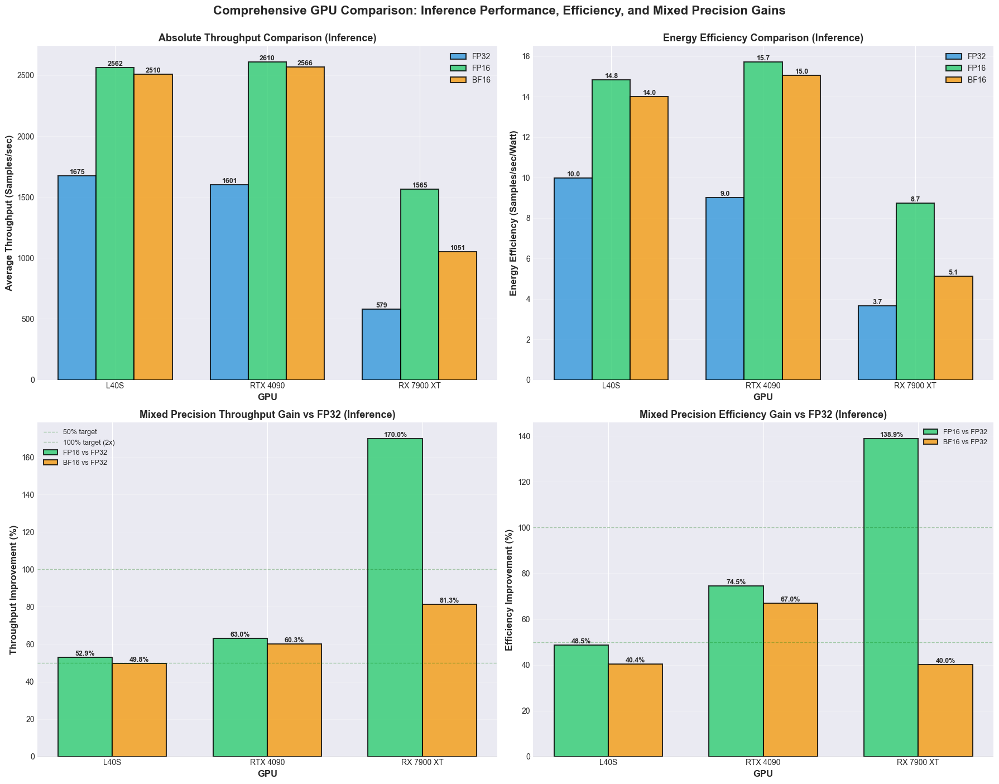


4. COMPREHENSIVE SUMMARY TABLE (INFERENCE)

       GPU FP32 Throughput FP16 Gain BF16 Gain FP32 Efficiency FP16 Eff Gain BF16 Eff Gain Avg Power
      L40S          1675.3    +52.9%    +49.8%            9.99        +48.5%        +40.4%    196.7W
  RTX 4090          1600.9    +63.0%    +60.3%            9.01        +74.5%        +67.0%    254.2W
RX 7900 XT           579.5   +170.0%    +81.3%            3.65       +138.9%        +40.0%    195.2W

5. KEY INSIGHTS AND CONCLUSIONS (INFERENCE)

✓ Absolute Performance Winner:
  RTX 4090: 2259.0 samples/sec (average across all configurations)

✓ Energy Efficiency Winner:
  RTX 4090: 13.260 samples/sec/watt (best performance per watt)

✓ Best Mixed Precision Adopter (Throughput Gain):
  FP16: RX 7900 XT with 170.0% improvement
  BF16: RX 7900 XT with 81.3% improvement

✓ Best Mixed Precision Adopter (Efficiency Gain):
  FP16: RX 7900 XT with 138.9% efficiency improvement
  BF16: RTX 4090 with 67.0% efficiency improvement

✓ GPU Characterizatio

In [ ]:
# Comprehensive GPU Comparison for INFERENCE: Performance, Efficiency, and Mixed Precision Gains

if not df_infer.empty and 'throughput_samples_per_sec' in df_infer.columns:
    print("=" * 100)
    print("COMPREHENSIVE GPU COMPARISON FOR INFERENCE")
    print("=" * 100)
    
    # ========================================
    # 1. ABSOLUTE PERFORMANCE COMPARISON
    # ========================================
    print("\n" + "=" * 100)
    print("1. RAW DOMINANCE: Absolute Throughput Leaders (Inference)")
    print("=" * 100)
    
    # Calculate average throughput per GPU across all models and precisions
    gpu_performance_infer = df_infer.groupby(['gpu_short_name', 'precision']).agg({
        'throughput_samples_per_sec': ['mean', 'std'],
        'model': 'count'
    }).reset_index()
    gpu_performance_infer.columns = ['gpu_short_name', 'precision', 'avg_throughput', 'std_throughput', 'num_configs']
    
    print("\n=== Average Inference Throughput by GPU and Precision ===")
    for gpu in gpu_performance_infer['gpu_short_name'].unique():
        print(f"\n{gpu}:")
        gpu_data = gpu_performance_infer[gpu_performance_infer['gpu_short_name'] == gpu].sort_values('avg_throughput', ascending=False)
        for _, row in gpu_data.iterrows():
            print(f"  {row['precision'].upper()}: {row['avg_throughput']:.2f} ± {row['std_throughput']:.2f} samples/sec")
    
    # Overall GPU ranking by average throughput
    overall_ranking_infer = df_infer.groupby('gpu_short_name')['throughput_samples_per_sec'].mean().sort_values(ascending=False)
    print("\n=== Overall GPU Ranking (Average across all configs) ===")
    for rank, (gpu, throughput) in enumerate(overall_ranking_infer.items(), 1):
        print(f"  {rank}. {gpu}: {throughput:.2f} samples/sec")
    
    # ========================================
    # 2. ENERGY EFFICIENCY COMPARISON
    # ========================================
    if 'gpu_avg_power_watts' in df_infer.columns:
        print("\n" + "=" * 100)
        print("2. ENERGY EFFICIENCY COMPARISON (Inference)")
        print("=" * 100)
        
        # Calculate average efficiency per GPU
        gpu_efficiency_infer = df_infer.groupby(['gpu_short_name', 'precision']).agg({
            'throughput_efficiency': ['mean', 'std'],
            'gpu_avg_power_watts': 'mean'
        }).reset_index()
        gpu_efficiency_infer.columns = ['gpu_short_name', 'precision', 'avg_efficiency', 'std_efficiency', 'avg_power']
        
        print("\n=== Average Energy Efficiency by GPU and Precision (Samples/sec/Watt) ===")
        for gpu in gpu_efficiency_infer['gpu_short_name'].unique():
            print(f"\n{gpu}:")
            gpu_data = gpu_efficiency_infer[gpu_efficiency_infer['gpu_short_name'] == gpu].sort_values('avg_efficiency', ascending=False)
            for _, row in gpu_data.iterrows():
                print(f"  {row['precision'].upper()}: {row['avg_efficiency']:.3f} ± {row['std_efficiency']:.3f} samples/sec/watt (Power: {row['avg_power']:.1f}W)")
        
        # Overall GPU efficiency ranking
        overall_efficiency_infer = df_infer.groupby('gpu_short_name')['throughput_efficiency'].mean().sort_values(ascending=False)
        print("\n=== Overall GPU Efficiency Ranking (Average across all configs) ===")
        for rank, (gpu, efficiency) in enumerate(overall_efficiency_infer.items(), 1):
            avg_power = df_infer[df_infer['gpu_short_name'] == gpu]['gpu_avg_power_watts'].mean()
            print(f"  {rank}. {gpu}: {efficiency:.3f} samples/sec/watt (Avg Power: {avg_power:.1f}W)")
    
    # ========================================
    # 3. MIXED PRECISION IMPROVEMENT ANALYSIS
    # ========================================
    print("\n" + "=" * 100)
    print("3. MIXED PRECISION IMPROVEMENT ANALYSIS (FP32 → FP16/BF16)")
    print("=" * 100)
    
    # Calculate improvement percentages per GPU
    gpu_improvements_infer = []
    
    for gpu in df_infer['gpu_short_name'].unique():
        gpu_data = df_infer[df_infer['gpu_short_name'] == gpu]
        
        # Get FP32 baseline
        fp32_throughput = gpu_data[gpu_data['precision'] == 'fp32']['throughput_samples_per_sec'].mean()
        fp32_efficiency = gpu_data[gpu_data['precision'] == 'fp32']['throughput_efficiency'].mean()
        fp32_power = gpu_data[gpu_data['precision'] == 'fp32']['gpu_avg_power_watts'].mean()
        
        for precision in ['fp16', 'bf16']:
            mixed_data = gpu_data[gpu_data['precision'] == precision]
            
            if len(mixed_data) > 0:
                mixed_throughput = mixed_data['throughput_samples_per_sec'].mean()
                mixed_efficiency = mixed_data['throughput_efficiency'].mean()
                mixed_power = mixed_data['gpu_avg_power_watts'].mean()
                
                throughput_improvement = ((mixed_throughput - fp32_throughput) / fp32_throughput) * 100
                efficiency_improvement = ((mixed_efficiency - fp32_efficiency) / fp32_efficiency) * 100
                power_change = ((mixed_power - fp32_power) / fp32_power) * 100
                
                gpu_improvements_infer.append({
                    'gpu': gpu,
                    'precision': precision,
                    'fp32_throughput': fp32_throughput,
                    'mixed_throughput': mixed_throughput,
                    'throughput_improvement_pct': throughput_improvement,
                    'fp32_efficiency': fp32_efficiency,
                    'mixed_efficiency': mixed_efficiency,
                    'efficiency_improvement_pct': efficiency_improvement,
                    'fp32_power': fp32_power,
                    'mixed_power': mixed_power,
                    'power_change_pct': power_change
                })
    
    gpu_improvements_infer_df = pd.DataFrame(gpu_improvements_infer)
    
    print("\n=== Throughput Improvement: FP32 → Mixed Precision ===")
    for gpu in gpu_improvements_infer_df['gpu'].unique():
        print(f"\n{gpu}:")
        gpu_imp = gpu_improvements_infer_df[gpu_improvements_infer_df['gpu'] == gpu]
        for _, row in gpu_imp.iterrows():
            print(f"  {row['precision'].upper()}: {row['fp32_throughput']:.1f} → {row['mixed_throughput']:.1f} samples/sec "
                  f"({row['throughput_improvement_pct']:+.1f}%)")
    
    print("\n=== Energy Efficiency Improvement: FP32 → Mixed Precision ===")
    for gpu in gpu_improvements_infer_df['gpu'].unique():
        print(f"\n{gpu}:")
        gpu_imp = gpu_improvements_infer_df[gpu_improvements_infer_df['gpu'] == gpu]
        for _, row in gpu_imp.iterrows():
            print(f"  {row['precision'].upper()}: {row['fp32_efficiency']:.3f} → {row['mixed_efficiency']:.3f} samples/sec/watt "
                  f"({row['efficiency_improvement_pct']:+.1f}%)")
    
    print("\n=== Power Consumption Change: FP32 → Mixed Precision ===")
    for gpu in gpu_improvements_infer_df['gpu'].unique():
        print(f"\n{gpu}:")
        gpu_imp = gpu_improvements_infer_df[gpu_improvements_infer_df['gpu'] == gpu]
        for _, row in gpu_imp.iterrows():
            print(f"  {row['precision'].upper()}: {row['fp32_power']:.1f}W → {row['mixed_power']:.1f}W "
                  f"({row['power_change_pct']:+.1f}%)")
    
    # ========================================
    # 4. VISUALIZATION: COMPREHENSIVE COMPARISON
    # ========================================
    
    # Plot 1: Comprehensive comparison
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    
    # Subplot 1: Absolute Throughput by GPU
    ax = axes[0, 0]
    gpus = gpu_performance_infer['gpu_short_name'].unique()
    x = np.arange(len(gpus))
    width = 0.25
    
    for idx, precision in enumerate(['fp32', 'fp16', 'bf16']):
        throughputs = []
        for gpu in gpus:
            val = gpu_performance_infer[(gpu_performance_infer['gpu_short_name'] == gpu) & 
                                 (gpu_performance_infer['precision'] == precision)]['avg_throughput']
            throughputs.append(val.values[0] if len(val) > 0 else 0)
        
        color_map = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
        offset = width * (idx - 1)
        bars = ax.bar(x + offset, throughputs, width, label=precision.upper(), 
                      color=color_map[precision], alpha=0.8, edgecolor='black', linewidth=1.5)
        
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.0f}',
                       ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
    ax.set_ylabel('Average Throughput (Samples/sec)', fontsize=12, fontweight='bold')
    ax.set_title('Absolute Throughput Comparison (Inference)', fontsize=13, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(gpus)
    ax.legend(fontsize=10)
    ax.grid(axis='y', alpha=0.3)
    ax.set_ylim(bottom=0)
    
    # Subplot 2: Energy Efficiency by GPU
    if 'avg_efficiency' in gpu_efficiency_infer.columns:
        ax = axes[0, 1]
        for idx, precision in enumerate(['fp32', 'fp16', 'bf16']):
            efficiencies = []
            for gpu in gpus:
                val = gpu_efficiency_infer[(gpu_efficiency_infer['gpu_short_name'] == gpu) & 
                                    (gpu_efficiency_infer['precision'] == precision)]['avg_efficiency']
                efficiencies.append(val.values[0] if len(val) > 0 else 0)
            
            color_map = {'fp32': '#3498db', 'fp16': '#2ecc71', 'bf16': '#f39c12'}
            offset = width * (idx - 1)
            bars = ax.bar(x + offset, efficiencies, width, label=precision.upper(),
                          color=color_map[precision], alpha=0.8, edgecolor='black', linewidth=1.5)
            
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{height:.1f}',
                           ha='center', va='bottom', fontsize=9, fontweight='bold')
        
        ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
        ax.set_ylabel('Energy Efficiency (Samples/sec/Watt)', fontsize=12, fontweight='bold')
        ax.set_title('Energy Efficiency Comparison (Inference)', fontsize=13, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(gpus)
        ax.legend(fontsize=10)
        ax.grid(axis='y', alpha=0.3)
        ax.set_ylim(bottom=0)
    
    # Subplot 3: Throughput Improvement (FP32 → Mixed Precision)
    ax = axes[1, 0]
    width_imp = 0.35
    
    fp16_improvements = []
    bf16_improvements = []
    for gpu in gpus:
        fp16_val = gpu_improvements_infer_df[(gpu_improvements_infer_df['gpu'] == gpu) & 
                                   (gpu_improvements_infer_df['precision'] == 'fp16')]['throughput_improvement_pct']
        bf16_val = gpu_improvements_infer_df[(gpu_improvements_infer_df['gpu'] == gpu) & 
                                   (gpu_improvements_infer_df['precision'] == 'bf16')]['throughput_improvement_pct']
        
        fp16_improvements.append(fp16_val.values[0] if len(fp16_val) > 0 else 0)
        bf16_improvements.append(bf16_val.values[0] if len(bf16_val) > 0 else 0)
    
    bars1 = ax.bar(x - width_imp/2, fp16_improvements, width_imp, label='FP16 vs FP32',
                   color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars2 = ax.bar(x + width_imp/2, bf16_improvements, width_imp, label='BF16 vs FP32',
                   color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.1f}%',
                   ha='center', va='bottom' if height > 0 else 'top',
                   fontsize=9, fontweight='bold')
    
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
    ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3, label='50% target')
    ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3, label='100% target (2x)')
    ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
    ax.set_ylabel('Throughput Improvement (%)', fontsize=12, fontweight='bold')
    ax.set_title('Mixed Precision Throughput Gain vs FP32 (Inference)', fontsize=13, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(gpus)
    ax.legend(fontsize=9)
    ax.grid(axis='y', alpha=0.3)
    
    # Subplot 4: Efficiency Improvement (FP32 → Mixed Precision)
    ax = axes[1, 1]
    
    fp16_eff_improvements = []
    bf16_eff_improvements = []
    for gpu in gpus:
        fp16_val = gpu_improvements_infer_df[(gpu_improvements_infer_df['gpu'] == gpu) & 
                                   (gpu_improvements_infer_df['precision'] == 'fp16')]['efficiency_improvement_pct']
        bf16_val = gpu_improvements_infer_df[(gpu_improvements_infer_df['gpu'] == gpu) & 
                                   (gpu_improvements_infer_df['precision'] == 'bf16')]['efficiency_improvement_pct']
        
        fp16_eff_improvements.append(fp16_val.values[0] if len(fp16_val) > 0 else 0)
        bf16_eff_improvements.append(bf16_val.values[0] if len(bf16_val) > 0 else 0)
    
    bars1 = ax.bar(x - width_imp/2, fp16_eff_improvements, width_imp, label='FP16 vs FP32',
                   color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars2 = ax.bar(x + width_imp/2, bf16_eff_improvements, width_imp, label='BF16 vs FP32',
                   color='#f39c12', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.1f}%',
                   ha='center', va='bottom' if height > 0 else 'top',
                   fontsize=9, fontweight='bold')
    
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
    ax.axhline(y=50, color='green', linestyle='--', linewidth=1, alpha=0.3)
    ax.axhline(y=100, color='darkgreen', linestyle='--', linewidth=1, alpha=0.3)
    ax.set_xlabel('GPU', fontsize=12, fontweight='bold')
    ax.set_ylabel('Efficiency Improvement (%)', fontsize=12, fontweight='bold')
    ax.set_title('Mixed Precision Efficiency Gain vs FP32 (Inference)', fontsize=13, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(gpus)
    ax.legend(fontsize=9)
    ax.grid(axis='y', alpha=0.3)
    
    plt.suptitle('Comprehensive GPU Comparison: Inference Performance, Efficiency, and Mixed Precision Gains',
                 fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.savefig('imgs/comprehensive_gpu_comparison_inference.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ========================================
    # 5. SUMMARY TABLE AND KEY INSIGHTS
    # ========================================
    print("\n" + "=" * 100)
    print("4. COMPREHENSIVE SUMMARY TABLE (INFERENCE)")
    print("=" * 100)
    
    summary_table_infer = []
    for gpu in gpus:
        gpu_data = df_infer[df_infer['gpu_short_name'] == gpu]
        
        # FP32 baseline
        fp32_throughput = gpu_data[gpu_data['precision'] == 'fp32']['throughput_samples_per_sec'].mean()
        fp32_efficiency = gpu_data[gpu_data['precision'] == 'fp32']['throughput_efficiency'].mean()
        fp32_power = gpu_data[gpu_data['precision'] == 'fp32']['gpu_avg_power_watts'].mean()
        
        # FP16
        fp16_throughput = gpu_data[gpu_data['precision'] == 'fp16']['throughput_samples_per_sec'].mean()
        fp16_efficiency = gpu_data[gpu_data['precision'] == 'fp16']['throughput_efficiency'].mean()
        fp16_throughput_gain = ((fp16_throughput - fp32_throughput) / fp32_throughput) * 100
        fp16_efficiency_gain = ((fp16_efficiency - fp32_efficiency) / fp32_efficiency) * 100
        
        # BF16
        bf16_throughput = gpu_data[gpu_data['precision'] == 'bf16']['throughput_samples_per_sec'].mean()
        bf16_efficiency = gpu_data[gpu_data['precision'] == 'bf16']['throughput_efficiency'].mean()
        bf16_throughput_gain = ((bf16_throughput - fp32_throughput) / fp32_throughput) * 100
        bf16_efficiency_gain = ((bf16_efficiency - fp32_efficiency) / fp32_efficiency) * 100
        
        summary_table_infer.append({
            'GPU': gpu,
            'FP32 Throughput': f'{fp32_throughput:.1f}',
            'FP16 Gain': f'{fp16_throughput_gain:+.1f}%',
            'BF16 Gain': f'{bf16_throughput_gain:+.1f}%',
            'FP32 Efficiency': f'{fp32_efficiency:.2f}',
            'FP16 Eff Gain': f'{fp16_efficiency_gain:+.1f}%',
            'BF16 Eff Gain': f'{bf16_efficiency_gain:+.1f}%',
            'Avg Power': f'{fp32_power:.1f}W'
        })
    
    summary_df_comparison_infer = pd.DataFrame(summary_table_infer)
    print("\n" + summary_df_comparison_infer.to_string(index=False))
    
    print("\n" + "=" * 100)
    print("5. KEY INSIGHTS AND CONCLUSIONS (INFERENCE)")
    print("=" * 100)
    
    print("\n✓ Absolute Performance Winner:")
    best_gpu = overall_ranking_infer.index[0]
    best_throughput = overall_ranking_infer.iloc[0]
    print(f"  {best_gpu}: {best_throughput:.1f} samples/sec (average across all configurations)")
    
    if 'avg_efficiency' in gpu_efficiency_infer.columns:
        print("\n✓ Energy Efficiency Winner:")
        best_eff_gpu = overall_efficiency_infer.index[0]
        best_efficiency = overall_efficiency_infer.iloc[0]
        print(f"  {best_eff_gpu}: {best_efficiency:.3f} samples/sec/watt (best performance per watt)")
    
    print("\n✓ Best Mixed Precision Adopter (Throughput Gain):")
    best_fp16_gain = gpu_improvements_infer_df.loc[gpu_improvements_infer_df['throughput_improvement_pct'].idxmax()]
    best_bf16_gain = gpu_improvements_infer_df.loc[gpu_improvements_infer_df[gpu_improvements_infer_df['precision'] == 'bf16']['throughput_improvement_pct'].idxmax()]
    print(f"  FP16: {best_fp16_gain['gpu']} with {best_fp16_gain['throughput_improvement_pct']:.1f}% improvement")
    print(f"  BF16: {best_bf16_gain['gpu']} with {best_bf16_gain['throughput_improvement_pct']:.1f}% improvement")
    
    print("\n✓ Best Mixed Precision Adopter (Efficiency Gain):")
    best_fp16_eff_gain = gpu_improvements_infer_df.loc[gpu_improvements_infer_df['efficiency_improvement_pct'].idxmax()]
    best_bf16_eff_gain = gpu_improvements_infer_df.loc[gpu_improvements_infer_df[gpu_improvements_infer_df['precision'] == 'bf16']['efficiency_improvement_pct'].idxmax()]
    print(f"  FP16: {best_fp16_eff_gain['gpu']} with {best_fp16_eff_gain['efficiency_improvement_pct']:.1f}% efficiency improvement")
    print(f"  BF16: {best_bf16_eff_gain['gpu']} with {best_bf16_eff_gain['efficiency_improvement_pct']:.1f}% efficiency improvement")
    
    print("\n✓ GPU Characterization (Inference):")
    for gpu in gpus:
        gpu_imp = gpu_improvements_infer_df[gpu_improvements_infer_df['gpu'] == gpu]
        avg_throughput_gain = gpu_imp['throughput_improvement_pct'].mean()
        avg_efficiency_gain = gpu_imp['efficiency_improvement_pct'].mean()
        avg_power = df_infer[df_infer['gpu_short_name'] == gpu]['gpu_avg_power_watts'].mean()
        
        print(f"\n  {gpu}:")
        print(f"    - Average throughput gain: {avg_throughput_gain:.1f}%")
        print(f"    - Average efficiency gain: {avg_efficiency_gain:.1f}%")
        print(f"    - Average power consumption: {avg_power:.1f}W")
        
        if avg_throughput_gain > 100:
            print(f"    → Excellent mixed precision acceleration (>2x speedup)")
        elif avg_throughput_gain > 50:
            print(f"    → Good mixed precision benefit (>1.5x speedup)")
        else:
            print(f"    → Moderate mixed precision benefit")
        
        if avg_efficiency_gain > 100:
            print(f"    → Outstanding energy efficiency improvement")
        elif avg_efficiency_gain > 50:
            print(f"    → Strong energy efficiency improvement")
    
    print("\n" + "=" * 100)
    print("INFERENCE ANALYSIS COMPLETE")
    print("=" * 100)
    
else:
    print("Insufficient inference data for comprehensive GPU comparison analysis")